**APPENDIX**

In [1]:
import os
import torch
import math
import torch.nn as nn
import torch.optim as optim
from torch.nn.parameter import Parameter
import numpy as np
import matplotlib.pyplot as plt
import scipy
import vtk
from vtk.util import numpy_support as VN
from itertools import combinations

Here, we consider a unsteady flow inside a symmetric stenosed coronary artery computed by imposing time-varying inlet flow rate using an open sourced - SimVascular FEM fluid solver. The post-stenoic velocity flow field over a grid of 512X512 is used for the project work. 

In [2]:
x_dim = 512
y_dim = 512
data_file = "data_"
directory = os.getcwd()  # GET THE CURRENT WORKING DIRECTORY  
path      = directory + '/'
data_file = path + data_file
Nfiles    = 100

In [3]:
fieldname  = 'Vmag'
Vel_data   = np.zeros((x_dim*y_dim, Nfiles))

for i in range(Nfiles):
    file_name = data_file + str(i) + ".vtk"
    print ('READING THE DATA FILE: ', file_name[len(directory)+1:])
    reader = vtk.vtkStructuredGridReader()
    reader.SetFileName(file_name)
    reader.Update()
    data = reader.GetOutput()
    pointData = data.GetPointData().GetArray(fieldname)
    velocity  = np.reshape(VN.vtk_to_numpy(pointData), (1, x_dim*y_dim))
    Vel_data [:, i] = (2.0*velocity - np.min(velocity) - np.max(velocity))/ (np.max(velocity) - np.min(velocity))
    print ("*"*85)


READING THE DATA FILE:  data_0.vtk
*************************************************************************************
READING THE DATA FILE:  data_1.vtk
*************************************************************************************
READING THE DATA FILE:  data_2.vtk
*************************************************************************************
READING THE DATA FILE:  data_3.vtk
*************************************************************************************
READING THE DATA FILE:  data_4.vtk
*************************************************************************************
READING THE DATA FILE:  data_5.vtk
*************************************************************************************
READING THE DATA FILE:  data_6.vtk
*************************************************************************************
READING THE DATA FILE:  data_7.vtk
*************************************************************************************
READING THE DATA FILE:  data_8.v

*************************************************************************************
READING THE DATA FILE:  data_74.vtk
*************************************************************************************
READING THE DATA FILE:  data_75.vtk
*************************************************************************************
READING THE DATA FILE:  data_76.vtk
*************************************************************************************
READING THE DATA FILE:  data_77.vtk
*************************************************************************************
READING THE DATA FILE:  data_78.vtk
*************************************************************************************
READING THE DATA FILE:  data_79.vtk
*************************************************************************************
READING THE DATA FILE:  data_80.vtk
*************************************************************************************
READING THE DATA FILE:  data_81.vtk
************************

First, we normalize the temporal velocity data by its spatially averaged mean value at a given time instant. Then, the matrix size is transformed to a square matrix, thereby computing the SVD operation more efficiently.

In [4]:
U, E, V  = np.linalg.svd(Vel_data, full_matrices=False)
Eigen_val = np.sqrt(E)

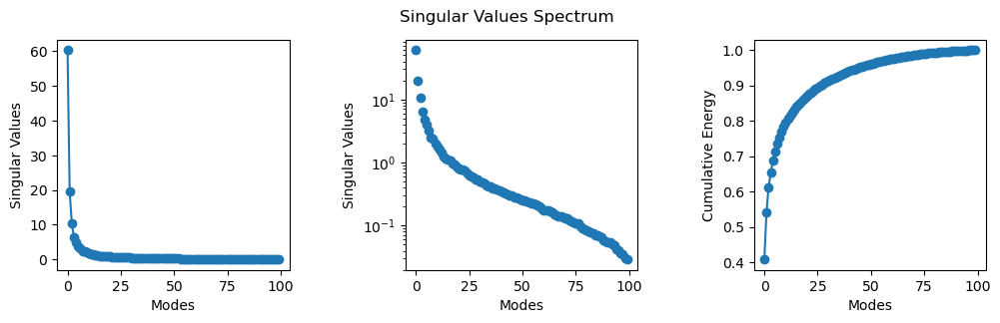

In [5]:
fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize =(12, 3))
fig.suptitle('Singular Values Spectrum')

ax[0].plot(Eigen_val, '-o')
ax[0].set(xlabel="Modes",ylabel="Singular Values")

ax[1].plot(Eigen_val, 'o')
ax[1].set(xlabel="Modes",ylabel="Singular Values")
ax[1].set_yscale('log')

ax[2].plot(np.cumsum(Eigen_val)/np.sum(Eigen_val), '-o')
ax[2].set(xlabel="Modes",ylabel="Cumulative Energy")
fig.subplots_adjust(wspace=0.5)

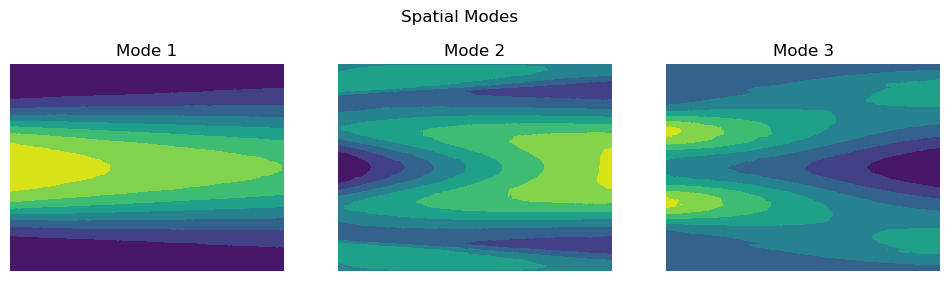

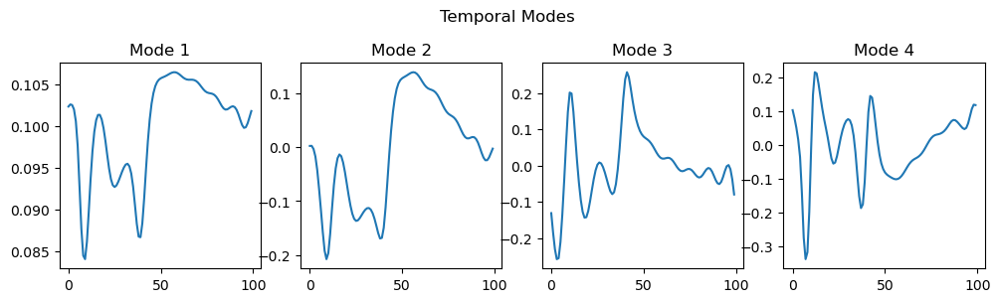

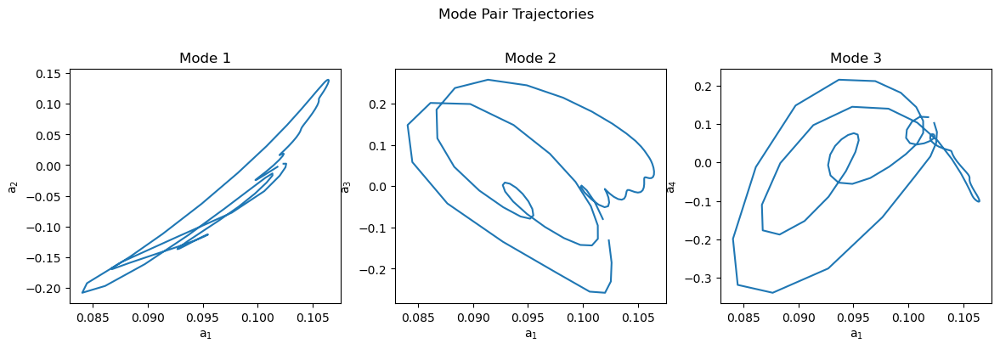

In [6]:
mode1 = np.reshape(U[:, 0], (x_dim, y_dim))
mode2 = np.reshape(U[:, 1], (x_dim, y_dim))
mode3 = np.reshape(U[:, 2], (x_dim, y_dim))

coeff1 = V [0, :]
coeff2 = V [1, :]
coeff3 = V [2, :]
coeff4 = V [3, :]

fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize =(12, 3))
fig.suptitle('Spatial Modes')

ax[0].contourf(mode1) 
ax[0].set_title('Mode 1')
ax[0].axis('off')

ax[1].contourf(mode2) 
ax[1].set_title('Mode 2')
ax[1].axis('off')

ax[2].contourf(mode3) 
ax[2].set_title('Mode 3')
ax[2].axis('off')
fig.subplots_adjust(top=0.8)

fig, ax = plt.subplots(nrows = 1, ncols = 4, figsize =(12, 3))
fig.suptitle('Temporal Modes')

ax[0].plot(coeff1) 
ax[0].set_title('Mode 1')

ax[1].plot(coeff2)
ax[1].set_title('Mode 2')


ax[2].plot(coeff3)
ax[2].set_title('Mode 3')

ax[3].plot(coeff4)
ax[3].set_title('Mode 4')

fig.subplots_adjust(top=0.8)



fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize =(14, 4))
fig.suptitle('Mode Pair Trajectories')

ax[0].plot(coeff1, coeff2) 
ax[0].set_title('Mode 1')
ax[0].set_xlabel('$\mathregular{a_1}$')
ax[0].set_ylabel('$\mathregular{a_2}$')

ax[1].plot(coeff1, coeff3)
ax[1].set_title('Mode 2')
ax[1].set_xlabel('$\mathregular{a_1}$')
ax[1].set_ylabel('$\mathregular{a_3}$')

ax[2].plot(coeff1, coeff4)
ax[2].set_title('Mode 3')
ax[2].set_xlabel('$\mathregular{a_1}$')
ax[2].set_ylabel('$\mathregular{a_4}$')
fig.subplots_adjust(top=0.8)

SINDy computation starts from here, utilizing the computed PCA modes.

In [7]:
processor = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("AVAILABLE PROCESSOR:", processor, '\n')

N_modes     = 3
modes       = torch.Tensor(V [:N_modes, :]).to(processor)

# HYPERPARAMETERS FOR THE SINDy POD METHODOLOGY
Epochs        = 15000
learning_rate = 1e-3
step_epoch    = 3500
decay_rate    = 0.50

N_terms = math.comb(N_modes, 1) + math.comb(N_modes, 2) + math.comb(N_modes, 3) + N_modes

# COMPUTING THE COMBINATIONS AMONG THE THREE CHOSEN TEMPORAL MODES
A1 = modes [0, :].reshape(1, -1)
A2 = modes [1, :].reshape(1, -1)
A3 = modes [2, :].reshape(1, -1)

A1A2   = (A1*A2).reshape(1, -1) 
A2A3   = (A2*A3).reshape(1, -1)
A3A1   = (A3*A1).reshape(1, -1)

A11A2  = (A1*A1*A2).reshape(1, -1) 
A22A3  = (A2*A2*A3).reshape(1, -1)
A33A1  = (A3*A3*A1).reshape(1, -1)

A1A22  = (A1*A2*A2).reshape(1, -1) 
A2A33  = (A2*A3*A3).reshape(1, -1)
A3A11  = (A3*A1*A1).reshape(1, -1)

A1A2A3 = (A1*A2*A3).reshape(1, -1)

A11A2A3 = (A1*A1*A2*A3).reshape(1, -1)
A1A22A3 = (A1*A2*A2*A3).reshape(1, -1)
A1A2A33 = (A1*A2*A3*A3).reshape(1, -1)

A11A22A3 = (A1*A1*A2*A2*A3).reshape(1, -1)
A1A22A33 = (A1*A2*A2*A3*A3).reshape(1, -1)
A11A2A33 = (A1*A1*A2*A3*A3).reshape(1, -1)

A_candidates = torch.transpose(torch.vstack ((torch.ones_like(A1), A1, A2, A3, A1A2, A2A3, A3A1, A11A2, A22A3, A33A1, A1A22, A2A33, A3A11, A1A2A3,
                              A11A2A3, A1A22A3, A1A2A33, A11A22A3, A1A22A33, A11A2A33)), 0, 1)
print(A_candidates.shape)                             


AVAILABLE PROCESSOR: cuda 

torch.Size([100, 20])


In [8]:
def DERIVATIVE(a, Nfiles):
    dadt = torch.zeros_like(a)
    for i in range(Nfiles-1):
        dadt [:, i] = a[:, i+1] - a[:, i]
    dadt [:, -1] = a[:, -2] - a[:, -1]
    return dadt

In [9]:
class SINDy_MODEL(nn.Module):
    def __init__(self, a):
        super().__init__()    
        self.a  = a
    def forward(self, x):
        output = x @ self.a
        return output

In [10]:
# AMPLITUDE COEFFICIENTS OF SINDy MODEL

# NO Lambda
COEFF_ADT1 = torch.ones(A_candidates.shape[1], N_modes, requires_grad= True, device= processor)

# Static Scalar Lambda
COEFF_ADT2 = torch.ones(A_candidates.shape[1], N_modes, requires_grad= True, device= processor)

# Dynamic Scalar Lambda
COEFF_ADT3 = torch.ones(A_candidates.shape[1], N_modes, requires_grad= True, device= processor)

# Dynamic matrix Lambda
COEFF_ADT4 = torch.ones(A_candidates.shape[1], N_modes, requires_grad= True, device= processor)

In [11]:
# COEFFICIENTS OF SINDy MODEL
optim_COEFF_ADT1 = optim.Adam([COEFF_ADT1],  lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)
optim_COEFF_ADT2 = optim.Adam([COEFF_ADT2],  lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)
optim_COEFF_ADT3 = optim.Adam([COEFF_ADT3],  lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)
optim_COEFF_ADT4 = optim.Adam([COEFF_ADT4],  lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)

# WEIGHT FUNCTION OF SINDy MODEL
W_FUNCTION2   = Parameter(torch.tensor(0.001), requires_grad= True)
W_FUNCTION3   = Parameter(torch.tensor(0.001), requires_grad= True)
W_FUNCTION4   = Parameter(torch.ones_like(COEFF_ADT4), requires_grad= True)

optim_Lambda3  = optim.Adam([W_FUNCTION3], lr = learning_rate, betas = (0.9,0.99),eps = 10**-15)
optim_Lambda4  = optim.Adam([W_FUNCTION4], lr = learning_rate, betas = (0.9,0.99),eps = 10**-15)

# STEP DECAY DYNAMIC LEARNING RATE
scheduler_COEFF_ADT1 = torch.optim.lr_scheduler.StepLR(optim_COEFF_ADT1, step_size=step_epoch, gamma=decay_rate)
scheduler_COEFF_ADT2 = torch.optim.lr_scheduler.StepLR(optim_COEFF_ADT2, step_size=step_epoch, gamma=decay_rate)
scheduler_COEFF_ADT3 = torch.optim.lr_scheduler.StepLR(optim_COEFF_ADT3, step_size=step_epoch, gamma=decay_rate)
scheduler_COEFF_ADT4 = torch.optim.lr_scheduler.StepLR(optim_COEFF_ADT4, step_size=step_epoch, gamma=decay_rate)

scheduler_LAMBDA3    = torch.optim.lr_scheduler.StepLR(optim_Lambda3,    step_size=step_epoch, gamma=decay_rate)
scheduler_LAMBDA4    = torch.optim.lr_scheduler.StepLR(optim_Lambda4,    step_size=step_epoch, gamma=decay_rate)

**CASE I: SINDy with $\lambda = 0$**

In [12]:
A1A2A3_time_deriv = DERIVATIVE (modes, Nfiles)

# TEMPORAL MODE 1
A1_DT = SINDy_MODEL(COEFF_ADT1[:, 0]).to(processor)

# TEMPORAL MODE 2
A2_DT = SINDy_MODEL(COEFF_ADT1[:, 1]).to(processor)

# TEMPORAL MODE 3
A3_DT = SINDy_MODEL(COEFF_ADT1[:, 2]).to(processor)

Loss_data1     = torch.empty(size=(Epochs, 1))
loss_function = nn.MSELoss()

for epoch in range(Epochs):
    A1_out, A2_out, A3_out  = A1_DT (A_candidates), A2_DT (A_candidates), A3_DT (A_candidates)
    output_data  = torch.vstack((A1_out , A2_out, A3_out))
    loss_epoch   = loss_function (A1A2A3_time_deriv, output_data)
    
    optim_COEFF_ADT1.zero_grad()
    loss_epoch.backward()

    with torch.no_grad():
        optim_COEFF_ADT1.step()       
        Loss_data1 [epoch] = loss_epoch.detach()
        
    print('LOSS DATA, [EPOCH =', epoch,  ']:',  Loss_data1 [epoch].item())
    print('LEARNING RATE:', optim_COEFF_ADT1.param_groups[0]['lr'])
    print ("*"*85)
       
    scheduler_COEFF_ADT1.step()


LOSS DATA, [EPOCH = 0 ]: 1.2301783561706543
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1 ]: 1.227717399597168
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2 ]: 1.2252590656280518
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3 ]: 1.2228031158447266
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 4 ]: 1.220349907875061
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 5 ]: 1.2178994417190552
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 6 ]: 1.2154514789581299
LEARNING RATE: 0.001
*******************************

LOSS DATA, [EPOCH = 188 ]: 0.8225399255752563
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 189 ]: 0.8206548690795898
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 190 ]: 0.8187726140022278
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 191 ]: 0.8168930411338806
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 192 ]: 0.8150162696838379
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 193 ]: 0.8131422400474548
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 194 ]: 0.8112708926200867
LEARNING RATE: 0.001
***************

LOSS DATA, [EPOCH = 297 ]: 0.6325101852416992
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 298 ]: 0.6309054493904114
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 299 ]: 0.6293030977249146
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 300 ]: 0.6277031302452087
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 301 ]: 0.6261056065559387
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 302 ]: 0.6245105266571045
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 303 ]: 0.6229177713394165
LEARNING RATE: 0.001
***************

LOSS DATA, [EPOCH = 410 ]: 0.4660869538784027
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 411 ]: 0.4647449851036072
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 412 ]: 0.46340522170066833
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 413 ]: 0.46206769347190857
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 414 ]: 0.4607323706150055
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 415 ]: 0.4593993127346039
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 416 ]: 0.45806846022605896
LEARNING RATE: 0.001
************

LOSS DATA, [EPOCH = 519 ]: 0.3327184021472931
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 520 ]: 0.3316132724285126
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 521 ]: 0.3305101990699768
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 522 ]: 0.32940930128097534
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 523 ]: 0.32831045985221863
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 524 ]: 0.32721376419067383
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 525 ]: 0.32611915469169617
LEARNING RATE: 0.001
***********

LOSS DATA, [EPOCH = 636 ]: 0.2175087332725525
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 637 ]: 0.21664434671401978
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 638 ]: 0.21578197181224823
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 639 ]: 0.21492162346839905
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 640 ]: 0.21406324207782745
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 641 ]: 0.21320688724517822
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 642 ]: 0.21235249936580658
LEARNING RATE: 0.001
*********

LOSS DATA, [EPOCH = 752 ]: 0.13032421469688416
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 753 ]: 0.12968486547470093
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 754 ]: 0.12904737889766693
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 755 ]: 0.12841178476810455
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 756 ]: 0.1277780383825302
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 757 ]: 0.1271461844444275
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 758 ]: 0.1265161633491516
LEARNING RATE: 0.001
***********

LOSS DATA, [EPOCH = 857 ]: 0.07315534353256226
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 858 ]: 0.07270478457212448
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 859 ]: 0.0722559466958046
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 860 ]: 0.0718088150024414
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 861 ]: 0.07136339694261551
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 862 ]: 0.07091967761516571
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 863 ]: 0.0704776793718338
LEARNING RATE: 0.001
***********

LOSS DATA, [EPOCH = 971 ]: 0.03234346583485603
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 972 ]: 0.03207475692033768
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 973 ]: 0.031807512044906616
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 974 ]: 0.03154171258211136
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 975 ]: 0.0312773659825325
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 976 ]: 0.031014472246170044
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 977 ]: 0.030753016471862793
LEARNING RATE: 0.001
******

LOSS DATA, [EPOCH = 1085 ]: 0.010337617248296738
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1086 ]: 0.01021397951990366
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1087 ]: 0.010091396979987621
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1088 ]: 0.009969869628548622
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1089 ]: 0.00984939094632864
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1090 ]: 0.009729956276714802
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1091 ]: 0.009611561894416809
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 1207 ]: 0.0017012604512274265
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1208 ]: 0.001672064303420484
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1209 ]: 0.0016433392884209752
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1210 ]: 0.0016150805167853832
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1211 ]: 0.0015872828662395477
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1212 ]: 0.001559942145831883
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1213 ]: 0.0015330530004575849
LEARNING R

LOSS DATA, [EPOCH = 1328 ]: 0.00034589896677061915
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1329 ]: 0.00034433818655088544
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1330 ]: 0.00034283098648302257
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1331 ]: 0.00034137576585635543
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1332 ]: 0.0003399711276870221
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1333 ]: 0.00033861547126434743
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1334 ]: 0.0003373075742274523
LEA

LOSS DATA, [EPOCH = 1450 ]: 0.0003052550309803337
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1451 ]: 0.00030523265013471246
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1452 ]: 0.0003052104148082435
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1453 ]: 0.0003051882958970964
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1454 ]: 0.000305166351608932
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1455 ]: 0.00030514452373608947
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1456 ]: 0.0003051228413823992
LEARNIN

LOSS DATA, [EPOCH = 1571 ]: 0.000302736705634743
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1572 ]: 0.00030271513969637454
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1573 ]: 0.0003026935155503452
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1574 ]: 0.00030267189140431583
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1575 ]: 0.000302650238154456
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1576 ]: 0.00030262855580076575
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1577 ]: 0.00030260681523941457
LEARNI

LOSS DATA, [EPOCH = 1698 ]: 0.00029974934295751154
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1699 ]: 0.00029972378979437053
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1700 ]: 0.0002996981784235686
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1701 ]: 0.0002996725379489362
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1702 ]: 0.00029964689747430384
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1703 ]: 0.0002996211696881801
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1704 ]: 0.0002995954710058868
LEARN

LOSS DATA, [EPOCH = 1823 ]: 0.00029631625511683524
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1824 ]: 0.0002962868893519044
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1825 ]: 0.000296257552690804
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1826 ]: 0.0002962281578220427
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1827 ]: 0.0002961987629532814
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1828 ]: 0.0002961693098768592
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1829 ]: 0.0002961398276966065
LEARNING

LOSS DATA, [EPOCH = 1943 ]: 0.0002925960288848728
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1944 ]: 0.00029256343259476125
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1945 ]: 0.0002925308363046497
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1946 ]: 0.00029249818180687726
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1947 ]: 0.00029246549820527434
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1948 ]: 0.000292432785499841
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1949 ]: 0.0002924000727944076
LEARNI

LOSS DATA, [EPOCH = 2067 ]: 0.00028839585138484836
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2068 ]: 0.0002883609267883003
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2069 ]: 0.0002883259439840913
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2070 ]: 0.00028829104849137366
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2071 ]: 0.0002882560365833342
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2072 ]: 0.00028822108288295567
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2073 ]: 0.00028818604187108576
LEAR

LOSS DATA, [EPOCH = 2191 ]: 0.00028397218557074666
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2192 ]: 0.0002839358348865062
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2193 ]: 0.00028389939689077437
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2194 ]: 0.00028386301710270345
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2195 ]: 0.0002838266082108021
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2196 ]: 0.0002837901411112398
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2197 ]: 0.00028375370311550796
LEAR

LOSS DATA, [EPOCH = 2313 ]: 0.00027943585882894695
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2314 ]: 0.0002793977619148791
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2315 ]: 0.00027935963589698076
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2316 ]: 0.000279321480775252
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2317 ]: 0.00027928329654969275
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2318 ]: 0.0002792451123241335
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2319 ]: 0.0002792068989947438
LEARNI

LOSS DATA, [EPOCH = 2435 ]: 0.0002746469690464437
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2436 ]: 0.00027460651472210884
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2437 ]: 0.00027456600219011307
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2438 ]: 0.00027452551876194775
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2439 ]: 0.000274485006229952
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2440 ]: 0.00027444446459412575
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2441 ]: 0.0002744038647506386
LEARN

LOSS DATA, [EPOCH = 2562 ]: 0.0002693679998628795
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2563 ]: 0.00026932553737424314
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2564 ]: 0.00026928301667794585
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2565 ]: 0.000269240525085479
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2566 ]: 0.00026919800438918173
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2567 ]: 0.00026915548369288445
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2568 ]: 0.0002691129338927567
LEARN

LOSS DATA, [EPOCH = 2686 ]: 0.0002640466846060008
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2687 ]: 0.00026400352362543344
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2688 ]: 0.00026396039174869657
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2689 ]: 0.00026391728897579014
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2690 ]: 0.00026387415709905326
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2691 ]: 0.0002638310252223164
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2692 ]: 0.00026378792244940996
LEA

LOSS DATA, [EPOCH = 2809 ]: 0.00025876215659081936
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2810 ]: 0.00025871951947920024
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2811 ]: 0.00025867688236758113
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2812 ]: 0.000258634245255962
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2813 ]: 0.0002585916663520038
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2814 ]: 0.00025854905834421515
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2815 ]: 0.00025850642123259604
LEAR

LOSS DATA, [EPOCH = 2935 ]: 0.00025347410701215267
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2936 ]: 0.00025343336164951324
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2937 ]: 0.000253392499871552
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2938 ]: 0.0002533512597437948
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2939 ]: 0.0002533098158892244
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2940 ]: 0.00025326854665763676
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2941 ]: 0.0002532277721911669
LEARNI

LOSS DATA, [EPOCH = 3060 ]: 0.00024845919688232243
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3061 ]: 0.0002484200813341886
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3062 ]: 0.00024838082026690245
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3063 ]: 0.00024834158830344677
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3064 ]: 0.00024830258917063475
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3065 ]: 0.0002482634736225009
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3066 ]: 0.0002482243871781975
LEAR

LOSS DATA, [EPOCH = 3181 ]: 0.00024380843387916684
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3182 ]: 0.0002437716320855543
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3183 ]: 0.0002437343937344849
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3184 ]: 0.00024369664606638253
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3185 ]: 0.00024365942226722836
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3186 ]: 0.00024362184922210872
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3187 ]: 0.0002435839269310236
LEAR

LOSS DATA, [EPOCH = 3307 ]: 0.0002391771849943325
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3308 ]: 0.0002391412854194641
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3309 ]: 0.00023910508025437593
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3310 ]: 0.00023906880232971162
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3311 ]: 0.00023903264082036912
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3312 ]: 0.00023899672669358552
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3313 ]: 0.0002389609580859542
LEAR

LOSS DATA, [EPOCH = 3432 ]: 0.0002347712725168094
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3433 ]: 0.00023473678447771817
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3434 ]: 0.00023470302403438836
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3435 ]: 0.00023466871061827987
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3436 ]: 0.0002346336841583252
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3437 ]: 0.00023459923977497965
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3438 ]: 0.00023456529015675187
LEA

LOSS DATA, [EPOCH = 3554 ]: 0.0002315435413038358
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3555 ]: 0.00023152667563408613
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3556 ]: 0.00023150980996433645
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3557 ]: 0.00023149291519075632
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3558 ]: 0.0002314760786248371
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3559 ]: 0.0002314591984031722
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3560 ]: 0.0002314423327334225

LOSS DATA, [EPOCH = 3681 ]: 0.00022940360940992832
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3682 ]: 0.00022938495385460556
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3683 ]: 0.00022936865570954978
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3684 ]: 0.0002293526631547138
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3685 ]: 0.0002293345460202545
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3686 ]: 0.00022931821877136827
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3687 ]: 0.000229301935178227

LOSS DATA, [EPOCH = 3805 ]: 0.0002273465070175007
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3806 ]: 0.0002273304999107495
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3807 ]: 0.00022731471108272672
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3808 ]: 0.00022729784541297704
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3809 ]: 0.00022728041221853346
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3810 ]: 0.000227264070417732
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3811 ]: 0.0002272483252454549


LOSS DATA, [EPOCH = 3923 ]: 0.00022542820079252124
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3924 ]: 0.00022541235375683755
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3925 ]: 0.00022539625933859497
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3926 ]: 0.00022537997574545443
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3927 ]: 0.0002253635466331616
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3928 ]: 0.00022534740855917335
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3929 ]: 0.00022533156152348

LOSS DATA, [EPOCH = 4049 ]: 0.0002234243438579142
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4050 ]: 0.00022340849682223052
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4051 ]: 0.00022339230054058135
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4052 ]: 0.00022337661357596517
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4053 ]: 0.0002233611885458231
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4054 ]: 0.00022334531240630895
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4055 ]: 0.000223329363507218

LOSS DATA, [EPOCH = 4172 ]: 0.0002215107379015535
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4173 ]: 0.00022149558935780078
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4174 ]: 0.0002214801643276587
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4175 ]: 0.00022146473929751664
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4176 ]: 0.00022144961985759437
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4177 ]: 0.0002214341948274523
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4178 ]: 0.0002214188716607168

LOSS DATA, [EPOCH = 4289 ]: 0.00021973226103000343
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4290 ]: 0.00021971744718030095
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4291 ]: 0.00021970232774037868
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4292 ]: 0.0002196872083004564
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4293 ]: 0.00021967242355458438
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4294 ]: 0.00021965733321849257
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4295 ]: 0.00021964227198623

LOSS DATA, [EPOCH = 4413 ]: 0.0002178888098569587
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4414 ]: 0.0002178740978706628
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4415 ]: 0.00021785942954011261
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4416 ]: 0.0002178448048653081
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4417 ]: 0.00021783019474241883
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4418 ]: 0.00021781549730803818
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4419 ]: 0.0002178007416659966

LOSS DATA, [EPOCH = 4538 ]: 0.00021607171220239252
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4539 ]: 0.0002160572330467403
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4540 ]: 0.00021604269568342716
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4541 ]: 0.00021602844935841858
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4542 ]: 0.0002160141448257491
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4543 ]: 0.00021599976753350347
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4544 ]: 0.000215985375689342

LOSS DATA, [EPOCH = 4662 ]: 0.0002143121528206393
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4663 ]: 0.00021429822663776577
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4664 ]: 0.00021428427135106176
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4665 ]: 0.00021427025785669684
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4666 ]: 0.00021425595332402736
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4667 ]: 0.00021424164879135787
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4668 ]: 0.00021422762074507

LOSS DATA, [EPOCH = 4786 ]: 0.00021259345521684736
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4787 ]: 0.0002125797764165327
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4788 ]: 0.0002125660830643028
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4789 ]: 0.0002125524333678186
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4790 ]: 0.00021253876911941916
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4791 ]: 0.00021252516307868063
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4792 ]: 0.0002125116006936878

LOSS DATA, [EPOCH = 4910 ]: 0.00021091531380079687
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4911 ]: 0.00021090195514261723
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4912 ]: 0.00021088853827677667
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4913 ]: 0.0002108752087224275
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4914 ]: 0.00021086186461616307
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4915 ]: 0.00021084846230223775
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4916 ]: 0.00021083504543639

LOSS DATA, [EPOCH = 5037 ]: 0.000209236575756222
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5038 ]: 0.00020922378462273628
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5039 ]: 0.00020921119721606374
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5040 ]: 0.00020919847884215415
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5041 ]: 0.00020918509108014405
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5042 ]: 0.00020917125220876187
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5043 ]: 0.000209157893550582

LOSS DATA, [EPOCH = 5163 ]: 0.0002076063392451033
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5164 ]: 0.00020759350445587188
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5165 ]: 0.00020758059690706432
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5166 ]: 0.0002075678203254938
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5167 ]: 0.00020755507284775376
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5168 ]: 0.0002075422671623528
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5169 ]: 0.0002075293741654604

LOSS DATA, [EPOCH = 5285 ]: 0.0002060582919511944
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5286 ]: 0.00020604568999260664
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5287 ]: 0.00020603305893018842
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5288 ]: 0.0002060204860754311
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5289 ]: 0.00020600795687641948
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5290 ]: 0.00020599542767740786
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5291 ]: 0.000205982825718820

LOSS DATA, [EPOCH = 5411 ]: 0.0002044889988610521
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5412 ]: 0.0002044767898041755
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5413 ]: 0.00020446452253963798
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5414 ]: 0.00020445222617127
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5415 ]: 0.00020443998801056296
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5416 ]: 0.00020442773529794067
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5417 ]: 0.00020441532251425087


LOSS DATA, [EPOCH = 5538 ]: 0.00020293820125516504
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5539 ]: 0.00020292613771744072
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5540 ]: 0.00020291413238737732
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5541 ]: 0.00020290218526497483
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5542 ]: 0.00020289039821363986
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5543 ]: 0.00020287901861593127
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5544 ]: 0.0002028670860454

LOSS DATA, [EPOCH = 5658 ]: 0.00020150217460468411
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5659 ]: 0.00020149044576101005
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5660 ]: 0.00020147876057308167
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5661 ]: 0.00020146653696428984
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5662 ]: 0.00020145444432273507
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5663 ]: 0.00020144278823863715
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5664 ]: 0.0002014311467064

LOSS DATA, [EPOCH = 5783 ]: 0.00020003513782285154
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5784 ]: 0.00020002377277705818
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5785 ]: 0.00020001248049084097
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5786 ]: 0.0002000009553739801
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5787 ]: 0.00019998896459583193
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5788 ]: 0.00019997679919470102
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5789 ]: 0.00019996524497400

LOSS DATA, [EPOCH = 5910 ]: 0.0001985751441679895
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5911 ]: 0.0001985638082260266
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5912 ]: 0.00019855244318023324
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5913 ]: 0.00019854106358252466
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5914 ]: 0.00019852968398481607
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5915 ]: 0.00019851828983519226
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5916 ]: 0.000198506968445144

LOSS DATA, [EPOCH = 6040 ]: 0.00019711114873643965
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6041 ]: 0.00019710000196937472
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6042 ]: 0.0001970888552023098
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6043 ]: 0.0001970777229871601
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6044 ]: 0.00019706657622009516
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6045 ]: 0.00019705544400494546
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6046 ]: 0.000197044297237880

LOSS DATA, [EPOCH = 6170 ]: 0.00019567877461668104
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6171 ]: 0.00019566748233046383
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6172 ]: 0.00019565646653063595
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6173 ]: 0.00019564582908060402
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6174 ]: 0.00019563507521525025
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6175 ]: 0.00019562395755201578
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6176 ]: 0.0001956129854079

LOSS DATA, [EPOCH = 6304 ]: 0.0001942339149536565
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6305 ]: 0.00019422287004999816
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6306 ]: 0.00019421236356720328
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6307 ]: 0.00019420182798057795
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6308 ]: 0.00019419091404415667
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6309 ]: 0.00019418033480178565
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6310 ]: 0.00019416975555941

LOSS DATA, [EPOCH = 6431 ]: 0.00019289115152787417
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6432 ]: 0.00019288065959699452
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6433 ]: 0.00019287009490653872
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6434 ]: 0.00019285954476799816
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6435 ]: 0.0001928490528371185
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6436 ]: 0.000192838633665815
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6437 ]: 0.0001928282144945114

LOSS DATA, [EPOCH = 6556 ]: 0.00019159521616529673
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6557 ]: 0.00019158492796123028
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6558 ]: 0.00019157465430907905
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6559 ]: 0.0001915644243126735
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6560 ]: 0.00019155419431626797
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6561 ]: 0.00019154393521603197
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6562 ]: 0.00019153367611579

LOSS DATA, [EPOCH = 6675 ]: 0.0001903845404740423
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6676 ]: 0.00019037445599678904
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6677 ]: 0.00019036434241570532
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6678 ]: 0.00019035421428270638
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6679 ]: 0.00019034412980545312
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6680 ]: 0.00019033410353586078
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6681 ]: 0.00019032406271435

LOSS DATA, [EPOCH = 6799 ]: 0.00018914055544883013
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6800 ]: 0.0001891306892503053
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6801 ]: 0.00018912077939603478
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6802 ]: 0.00018911102961283177
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6803 ]: 0.00018910148355644196
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6804 ]: 0.0001890916028060019
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6805 ]: 0.000189081139978952

LOSS DATA, [EPOCH = 6919 ]: 0.0001879518385976553
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6920 ]: 0.00018794207426253706
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6921 ]: 0.00018793225171975791
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6922 ]: 0.0001879223418654874
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6923 ]: 0.00018791235925164074
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6924 ]: 0.00018790244939737022
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6925 ]: 0.000187892655958421

LOSS DATA, [EPOCH = 7042 ]: 0.0001869498664746061
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7043 ]: 0.00018694496247917414
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7044 ]: 0.00018694004393182695
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7045 ]: 0.00018693512538447976
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7046 ]: 0.00018693020683713257
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7047 ]: 0.0001869253028417006
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7048 ]: 0.000186920398

LOSS DATA, [EPOCH = 7162 ]: 0.0001863583456724882
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7163 ]: 0.00018635339802131057
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7164 ]: 0.00018634846492204815
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7165 ]: 0.0001863435172708705
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7166 ]: 0.0001863385841716081
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7167 ]: 0.00018633368017617613
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7168 ]: 0.0001863287179

LOSS DATA, [EPOCH = 7286 ]: 0.00018574947898741812
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7287 ]: 0.00018574457499198616
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7288 ]: 0.00018573971465229988
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7289 ]: 0.0001857347961049527
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7290 ]: 0.0001857298775576055
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7291 ]: 0.000185725002666004
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7292 ]: 0.00018572009867

LOSS DATA, [EPOCH = 7413 ]: 0.00018512966926209629
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7414 ]: 0.00018512486713007092
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7415 ]: 0.00018511996313463897
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7416 ]: 0.000185115059139207
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7417 ]: 0.0001851102279033512
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7418 ]: 0.00018510535301174968
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7419 ]: 0.0001851004635

LOSS DATA, [EPOCH = 7541 ]: 0.00018450961215421557
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7542 ]: 0.00018450469360686839
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7543 ]: 0.00018449984781909734
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7544 ]: 0.00018449511844664812
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7545 ]: 0.0001844902290031314
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7546 ]: 0.00018448533955961466
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7547 ]: 0.00018448059

LOSS DATA, [EPOCH = 7667 ]: 0.00018390340846963227
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7668 ]: 0.0001838986063376069
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7669 ]: 0.00018389381875749677
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7670 ]: 0.00018388903117738664
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7671 ]: 0.00018388425814919174
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7672 ]: 0.00018387944146525115
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7673 ]: 0.00018387468

LOSS DATA, [EPOCH = 7789 ]: 0.00018332057516090572
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7790 ]: 0.00018331587489228696
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7791 ]: 0.00018331111641600728
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7792 ]: 0.0001833063579397276
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7793 ]: 0.00018330162856727839
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7794 ]: 0.00018329679733142257
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7795 ]: 0.00018329199

LOSS DATA, [EPOCH = 7911 ]: 0.0001827418163884431
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7912 ]: 0.0001827367377700284
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7913 ]: 0.00018273225578013808
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7914 ]: 0.00018272751185577363
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7915 ]: 0.00018272256420459598
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7916 ]: 0.0001827181113185361
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7917 ]: 0.0001827132073

LOSS DATA, [EPOCH = 8034 ]: 0.00018216267926618457
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8035 ]: 0.0001821579789975658
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8036 ]: 0.0001821533078327775
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8037 ]: 0.00018214856390841305
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8038 ]: 0.00018214389274362475
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8039 ]: 0.0001821392070269212
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8040 ]: 0.0001821345067

LOSS DATA, [EPOCH = 8160 ]: 0.00018157289014197886
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8161 ]: 0.00018156821897719055
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8162 ]: 0.00018156344594899565
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8163 ]: 0.00018155877478420734
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8164 ]: 0.0001815541327232495
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8165 ]: 0.00018154947611037642
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8166 ]: 0.00018154476

LOSS DATA, [EPOCH = 8287 ]: 0.00018098227155860513
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8288 ]: 0.00018097761494573206
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8289 ]: 0.00018097295833285898
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8290 ]: 0.00018096833082381636
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8291 ]: 0.00018096364510711282
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8292 ]: 0.0001809590612538159
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8293 ]: 0.00018095443

LOSS DATA, [EPOCH = 8413 ]: 0.00018040025315713137
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8414 ]: 0.00018039564020000398
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8415 ]: 0.00018039107089862227
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8416 ]: 0.00018038645794149488
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8417 ]: 0.0001803818449843675
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8418 ]: 0.0001803772320272401
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8419 ]: 0.000180372604

LOSS DATA, [EPOCH = 8535 ]: 0.00017984102305490524
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8536 ]: 0.00017983646830543876
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8537 ]: 0.00017983189900405705
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8538 ]: 0.00017982737335842103
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8539 ]: 0.00017982287681661546
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8540 ]: 0.0001798183366190642
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8541 ]: 0.00017981375

LOSS DATA, [EPOCH = 8661 ]: 0.00017926750297192484
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8662 ]: 0.0001792630209820345
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8663 ]: 0.00017925849533639848
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8664 ]: 0.00017925395513884723
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8665 ]: 0.00017924941494129598
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8666 ]: 0.00017924483108799905
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8667 ]: 0.00017924023

LOSS DATA, [EPOCH = 8787 ]: 0.00017869797011371702
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8788 ]: 0.000178693444468081
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8789 ]: 0.00017868894792627543
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8790 ]: 0.00017868445138446987
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8791 ]: 0.0001786799548426643
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8792 ]: 0.00017867545830085874
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8793 ]: 0.0001786710054

LOSS DATA, [EPOCH = 8911 ]: 0.00017814160673879087
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8912 ]: 0.00017813712474890053
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8913 ]: 0.00017813265731092542
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8914 ]: 0.00017812818987295032
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8915 ]: 0.00017812370788305998
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8916 ]: 0.00017811926954891533
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8917 ]: 0.0001781148

LOSS DATA, [EPOCH = 9033 ]: 0.00017759835463948548
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9034 ]: 0.0001775938580976799
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9035 ]: 0.00017758917238097638
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9036 ]: 0.0001775847194949165
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9037 ]: 0.00017758044123183936
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9038 ]: 0.0001775759446900338
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9039 ]: 0.0001775713753

LOSS DATA, [EPOCH = 9153 ]: 0.00017706751532386988
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9154 ]: 0.0001770631060935557
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9155 ]: 0.00017705874051898718
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9156 ]: 0.00017705437494441867
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9157 ]: 0.0001770500239217654
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9158 ]: 0.00017704560013953596
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9159 ]: 0.000177041103

LOSS DATA, [EPOCH = 9281 ]: 0.00017650544759817421
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9282 ]: 0.00017650105291977525
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9283 ]: 0.00017649668734520674
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9284 ]: 0.000176492307218723
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9285 ]: 0.00017648791254032403
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9286 ]: 0.0001764835324138403
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9287 ]: 0.0001764791668

LOSS DATA, [EPOCH = 9401 ]: 0.00017598227714188397
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9402 ]: 0.00017597794067114592
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9403 ]: 0.0001759735750965774
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9404 ]: 0.0001759692095220089
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9405 ]: 0.00017596482939552516
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9406 ]: 0.00017596050747670233
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9407 ]: 0.000175956156

LOSS DATA, [EPOCH = 9522 ]: 0.00017545853916089982
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9523 ]: 0.00017545430455356836
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9524 ]: 0.00017544992442708462
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9525 ]: 0.00017544547154102474
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9526 ]: 0.00017544110596645623
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9527 ]: 0.00017543685680720955
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9528 ]: 0.0001754326

LOSS DATA, [EPOCH = 9644 ]: 0.00017493448103778064
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9645 ]: 0.00017493021732661873
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9646 ]: 0.00017492595361545682
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9647 ]: 0.00017492166080046445
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9648 ]: 0.00017491736798547208
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9649 ]: 0.00017491310427431017
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9650 ]: 0.0001749088

LOSS DATA, [EPOCH = 9768 ]: 0.00017440579540561885
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9769 ]: 0.00017440154624637216
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9770 ]: 0.0001743972534313798
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9771 ]: 0.00017439301882404834
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9772 ]: 0.00017438876966480166
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9773 ]: 0.0001743845787132159
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9774 ]: 0.000174380344

LOSS DATA, [EPOCH = 9889 ]: 0.0001738935534376651
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9890 ]: 0.00017388936248607934
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9891 ]: 0.00017388505511917174
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9892 ]: 0.00017388080595992506
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9893 ]: 0.00017387658590450883
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9894 ]: 0.0001738724095048383
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9895 ]: 0.000173868145

LOSS DATA, [EPOCH = 10049 ]: 0.00017322198254987597
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10050 ]: 0.00017321782070212066
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10051 ]: 0.0001732136297505349
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10052 ]: 0.00017320945335086435
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10053 ]: 0.00017320526239927858
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10054 ]: 0.00017320110055152327
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10055 ]: 0.0001

LOSS DATA, [EPOCH = 10173 ]: 0.00017270648095291108
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10174 ]: 0.00017270240641664714
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10175 ]: 0.00017269824456889182
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10176 ]: 0.0001726940827211365
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10177 ]: 0.00017268999363295734
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10178 ]: 0.00017268588999286294
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10179 ]: 0.0001

LOSS DATA, [EPOCH = 10297 ]: 0.00017219506844412535
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10298 ]: 0.0001721909939078614
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10299 ]: 0.00017218687571585178
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10300 ]: 0.00017218274297192693
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10301 ]: 0.00017217863933183253
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10302 ]: 0.00017217450658790767
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10303 ]: 0.0001

LOSS DATA, [EPOCH = 10417 ]: 0.00017170376668218523
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10418 ]: 0.00017169966304209083
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10419 ]: 0.00017169555940199643
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10420 ]: 0.0001716914848657325
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10421 ]: 0.000171687439433299
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10422 ]: 0.00017168336489703506
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10423 ]: 0.000171

LOSS DATA, [EPOCH = 10540 ]: 0.00017128516628872603
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10541 ]: 0.00017128311446867883
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10542 ]: 0.00017128107720054686
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10543 ]: 0.00017127905448433012
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10544 ]: 0.0001712770463200286
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10545 ]: 0.0001712749944999814
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10546 ]: 0

LOSS DATA, [EPOCH = 10665 ]: 0.00017103088612202555
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10666 ]: 0.00017102884885389358
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10667 ]: 0.0001710268115857616
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10668 ]: 0.0001710248034214601
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10669 ]: 0.0001710227516014129
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10670 ]: 0.0001710206997813657
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10671 ]: 0.0

LOSS DATA, [EPOCH = 10788 ]: 0.0001707812334643677
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10789 ]: 0.00017077921074815094
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10790 ]: 0.00017077717348001897
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10791 ]: 0.00017077516531571746
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10792 ]: 0.00017077309894375503
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10793 ]: 0.0001707710762275383
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10794 ]: 0

LOSS DATA, [EPOCH = 10910 ]: 0.00017053457850124687
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10911 ]: 0.00017053252668119967
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10912 ]: 0.0001705304894130677
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10913 ]: 0.0001705284958006814
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10914 ]: 0.0001705264876363799
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10915 ]: 0.00017052446492016315
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10916 ]: 0.

LOSS DATA, [EPOCH = 11035 ]: 0.0001702828740235418
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11036 ]: 0.00017028089496307075
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11037 ]: 0.00017027885769493878
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11038 ]: 0.0001702768640825525
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11039 ]: 0.00017027485591825098
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11040 ]: 0.00017027284775394946
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11041 ]: 0

LOSS DATA, [EPOCH = 11140 ]: 0.00017007232236210257
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11141 ]: 0.00017007031419780105
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11142 ]: 0.0001700682914815843
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11143 ]: 0.00017006631242111325
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11144 ]: 0.0001700642897048965
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11145 ]: 0.00017006229609251022
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11146 ]: 0

LOSS DATA, [EPOCH = 11262 ]: 0.00016982860688585788
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11263 ]: 0.00016982659872155637
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11264 ]: 0.0001698246196610853
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11265 ]: 0.00016982259694486856
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11266 ]: 0.00016982064698822796
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11267 ]: 0.00016981862427201122
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11268 ]: 

LOSS DATA, [EPOCH = 11380 ]: 0.0001695937680779025
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11381 ]: 0.00016959178901743144
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11382 ]: 0.0001695897663012147
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11383 ]: 0.00016958775813691318
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11384 ]: 0.00016958579362835735
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11385 ]: 0.0001695838145678863
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11386 ]: 0.

LOSS DATA, [EPOCH = 11503 ]: 0.0001693499943939969
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11504 ]: 0.00016934802988544106
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11505 ]: 0.00016934603627305478
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11506 ]: 0.00016934407176449895
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11507 ]: 0.0001693420927040279
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11508 ]: 0.00016934012819547206
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11509 ]: 0

LOSS DATA, [EPOCH = 11619 ]: 0.00016912103455979377
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11620 ]: 0.00016911902639549226
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11621 ]: 0.00016911706188693643
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11622 ]: 0.0001691150973783806
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11623 ]: 0.00016911313286982477
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11624 ]: 0.0001691111538093537
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11625 ]: 0

LOSS DATA, [EPOCH = 11735 ]: 0.0001688928750809282
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11736 ]: 0.0001688909251242876
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11737 ]: 0.00016888896061573178
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11738 ]: 0.00016888701065909117
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11739 ]: 0.00016888506070245057
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11740 ]: 0.00016888308164197952
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11741 ]: 0

LOSS DATA, [EPOCH = 11858 ]: 0.00016865201178006828
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11859 ]: 0.00016865006182342768
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11860 ]: 0.00016864809731487185
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11861 ]: 0.00016864614735823125
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11862 ]: 0.00016864419740159065
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11863 ]: 0.00016864224744495004
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11864 ]:

LOSS DATA, [EPOCH = 11983 ]: 0.00016840820899233222
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11984 ]: 0.00016840625903569162
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11985 ]: 0.00016840432363096625
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11986 ]: 0.00016840235912241042
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11987 ]: 0.00016840038006193936
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11988 ]: 0.00016839844465721399
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11989 ]:

LOSS DATA, [EPOCH = 12105 ]: 0.00016817127470858395
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12106 ]: 0.00016816933930385858
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12107 ]: 0.00016816738934721798
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12108 ]: 0.00016816546849440783
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12109 ]: 0.00016816351853776723
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12110 ]: 0.0001681615976849571
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12111 ]: 

LOSS DATA, [EPOCH = 12227 ]: 0.0001679352717474103
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12228 ]: 0.00016793333634268492
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12229 ]: 0.00016793141548987478
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12230 ]: 0.00016792946553323418
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12231 ]: 0.00016792751557659358
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12232 ]: 0.00016792559472378343
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12233 ]: 

LOSS DATA, [EPOCH = 12353 ]: 0.00016769261856097728
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12354 ]: 0.00016769071226008236
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12355 ]: 0.00016768876230344176
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12356 ]: 0.00016768687055446208
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12357 ]: 0.0001676849351497367
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12358 ]: 0.00016768299974501133
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12359 ]: 

LOSS DATA, [EPOCH = 12469 ]: 0.000167470148880966
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12470 ]: 0.00016746827168390155
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12471 ]: 0.0001674663508310914
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12472 ]: 0.00016746447363402694
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12473 ]: 0.00016746256733313203
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12474 ]: 0.0001674606028245762
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12475 ]: 0.0

LOSS DATA, [EPOCH = 12593 ]: 0.0001672332437010482
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12594 ]: 0.00016723130829632282
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12595 ]: 0.00016722941654734313
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12596 ]: 0.000167227495694533
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12597 ]: 0.0001672256039455533
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12598 ]: 0.0001672236976446584
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12599 ]: 0.00

LOSS DATA, [EPOCH = 12718 ]: 0.0001669953780947253
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12719 ]: 0.00016699348634574562
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12720 ]: 0.00016699159459676594
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12721 ]: 0.00016698970284778625
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12722 ]: 0.00016698781109880656
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12723 ]: 0.00016698591934982687
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12724 ]: 

LOSS DATA, [EPOCH = 12842 ]: 0.0001667605829425156
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12843 ]: 0.0001667586766416207
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12844 ]: 0.000166756784892641
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12845 ]: 0.00016675490769557655
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12846 ]: 0.00016675300139468163
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12847 ]: 0.00016675116785336286
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12848 ]: 0.0

LOSS DATA, [EPOCH = 12962 ]: 0.00016653422790113837
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12963 ]: 0.00016653233615215868
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12964 ]: 0.00016653045895509422
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12965 ]: 0.000166528596309945
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12966 ]: 0.0001665267045609653
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12967 ]: 0.00016652482736390084
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12968 ]: 0.

LOSS DATA, [EPOCH = 13086 ]: 0.00016630132449790835
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13087 ]: 0.00016629947640467435
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13088 ]: 0.0001662975555518642
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13089 ]: 0.00016629569290671498
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13090 ]: 0.00016629381570965052
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13091 ]: 0.00016629195306450129
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13092 ]: 

LOSS DATA, [EPOCH = 13186 ]: 0.00016611430328339338
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13187 ]: 0.0001661124115344137
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13188 ]: 0.00016611054888926446
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13189 ]: 0.00016610868624411523
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13190 ]: 0.000166106823598966
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13191 ]: 0.00016610493184998631
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13192 ]: 0.

LOSS DATA, [EPOCH = 13302 ]: 0.000165898134582676
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13303 ]: 0.00016589627193752676
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13304 ]: 0.000165894438396208
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13305 ]: 0.0001658925466472283
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13306 ]: 0.00016589068400207907
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13307 ]: 0.00016588882135692984
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13308 ]: 0.00

LOSS DATA, [EPOCH = 13429 ]: 0.0001656624663155526
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13430 ]: 0.00016566060367040336
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13431 ]: 0.00016565875557716936
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13432 ]: 0.0001656568783801049
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13433 ]: 0.0001656550302868709
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13434 ]: 0.00016565321129746735
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13435 ]: 0.

LOSS DATA, [EPOCH = 13552 ]: 0.00016543523815926164
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13553 ]: 0.00016543339006602764
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13554 ]: 0.0001654315710766241
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13555 ]: 0.00016542969387955964
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13556 ]: 0.00016542786033824086
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13557 ]: 0.00016542601224500686
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13558 ]: 

LOSS DATA, [EPOCH = 13678 ]: 0.00016520346980541945
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13679 ]: 0.0001652016508160159
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13680 ]: 0.00016519983182661235
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13681 ]: 0.00016519798373337835
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13682 ]: 0.00016519613564014435
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13683 ]: 0.00016519430209882557
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13684 ]: 

LOSS DATA, [EPOCH = 13802 ]: 0.00016497641627211124
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13803 ]: 0.0001649745972827077
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13804 ]: 0.00016497276374138892
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13805 ]: 0.0001649709593039006
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13806 ]: 0.00016496912576258183
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13807 ]: 0.0001649672631174326
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13808 ]: 0.

LOSS DATA, [EPOCH = 13922 ]: 0.00016475770098622888
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13923 ]: 0.0001647558674449101
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13924 ]: 0.00016475404845550656
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13925 ]: 0.00016475222946610302
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13926 ]: 0.0001647504250286147
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13927 ]: 0.0001647486351430416
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13928 ]: 0.

LOSS DATA, [EPOCH = 14046 ]: 0.00016457418678328395
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14047 ]: 0.00016457329911645502
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14048 ]: 0.00016457238234579563
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14049 ]: 0.00016457145102322102
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14050 ]: 0.00016457056335639209
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14051 ]: 0.0001645696465857327
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14052 ]: 

LOSS DATA, [EPOCH = 14166 ]: 0.00016446512017864734
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14167 ]: 0.00016446421795990318
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14168 ]: 0.00016446328663732857
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14169 ]: 0.00016446241352241486
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14170 ]: 0.00016446148219984025
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14171 ]: 0.00016446059453301132
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14172 ]:

LOSS DATA, [EPOCH = 14281 ]: 0.0001643607538426295
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14282 ]: 0.00016435986617580056
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14283 ]: 0.0001643589639570564
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14284 ]: 0.00016435801808256656
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14285 ]: 0.0001643571158638224
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14286 ]: 0.00016435622819699347
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14287 ]: 0.

LOSS DATA, [EPOCH = 14397 ]: 0.0001642557035665959
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14398 ]: 0.00016425480134785175
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14399 ]: 0.00016425388457719237
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14400 ]: 0.00016425301146227866
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14401 ]: 0.00016425208013970405
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14402 ]: 0.00016425116336904466
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14403 ]: 

LOSS DATA, [EPOCH = 14518 ]: 0.0001641463313717395
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14519 ]: 0.00016414542915299535
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14520 ]: 0.00016414451238233596
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14521 ]: 0.00016414363926742226
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14522 ]: 0.00016414272249676287
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14523 ]: 0.0001641418202780187
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14524 ]: 0

LOSS DATA, [EPOCH = 14639 ]: 0.00016403720655944198
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14640 ]: 0.00016403631889261305
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14641 ]: 0.00016403543122578412
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14642 ]: 0.00016403451445512474
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14643 ]: 0.00016403361223638058
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14644 ]: 0.00016403271001763642
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14645 ]:

LOSS DATA, [EPOCH = 14758 ]: 0.00016393016267102212
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14759 ]: 0.00016392926045227796
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14760 ]: 0.00016392838733736426
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14761 ]: 0.0001639274851186201
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14762 ]: 0.0001639265683479607
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14763 ]: 0.00016392566612921655
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14764 ]: 0

LOSS DATA, [EPOCH = 14878 ]: 0.00016382244939450175
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14879 ]: 0.00016382156172767282
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14880 ]: 0.00016382065950892866
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14881 ]: 0.00016381977184209973
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14882 ]: 0.00016381886962335557
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14883 ]: 0.00016381795285269618
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14884 ]:

LOSS DATA, [EPOCH = 14998 ]: 0.00016371496894862503
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14999 ]: 0.00016371406672988087
LEARNING RATE: 6.25e-05
*************************************************************************************


**CASE 2: SINDy with $\lambda = 0.1$. In this case, $\lambda$ is chosen to be fixed during training process.**

In [13]:
# TEMPORAL MODE 1
A1_DT = SINDy_MODEL(COEFF_ADT2 [:, 0]).to(processor)

# TEMPORAL MODE 2
A2_DT = SINDy_MODEL(COEFF_ADT2 [:, 1]).to(processor)

# TEMPORAL MODE 3
A3_DT = SINDy_MODEL(COEFF_ADT2 [:, 2]).to(processor)

Loss_data2    = torch.empty(size=(Epochs, 1))
loss_function = nn.MSELoss()

for epoch in range(Epochs):
    A1_out, A2_out, A3_out  = A1_DT (A_candidates), A2_DT (A_candidates), A3_DT (A_candidates)
    output_data  = torch.vstack((A1_out , A2_out, A3_out))
    loss_epoch   = loss_function (A1A2A3_time_deriv, output_data) + torch.linalg.matrix_norm(W_FUNCTION2*COEFF_ADT2, ord =1)
    
    optim_COEFF_ADT2.zero_grad()    
    loss_epoch.backward()

    with torch.no_grad():
        optim_COEFF_ADT2.step()      
        Loss_data2 [epoch] = loss_epoch.detach()
        
    print('LOSS DATA, [EPOCH =', epoch,  ']:',  Loss_data2 [epoch].item())
    print('LEARNING RATE:', optim_COEFF_ADT1.param_groups[0]['lr'])
    print ("*"*85)
       
    scheduler_COEFF_ADT2.step()

LOSS DATA, [EPOCH = 0 ]: 1.250178337097168
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1 ]: 1.2476996183395386
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2 ]: 1.2452234029769897
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3 ]: 1.242749810218811
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4 ]: 1.240278720855713
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5 ]: 1.2378103733062744
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6 ]: 1.2353466749191284
LEARNING RATE: 6.25e-05
***********

LOSS DATA, [EPOCH = 83 ]: 1.0554128885269165
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 84 ]: 1.053204894065857
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 85 ]: 1.050998568534851
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 86 ]: 1.048795223236084
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 87 ]: 1.0465971231460571
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 88 ]: 1.0444031953811646
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 89 ]: 1.0422110557556152
LEARNING RATE: 6.25e-05
****

LOSS DATA, [EPOCH = 245 ]: 0.7362136840820312
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 246 ]: 0.7344672679901123
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 247 ]: 0.732722282409668
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 248 ]: 0.7309804558753967
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 249 ]: 0.7292402386665344
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 250 ]: 0.7275048494338989
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 251 ]: 0.7257705330848694
LEARNING RATE: 6.25

LOSS DATA, [EPOCH = 438 ]: 0.4436430335044861
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 439 ]: 0.44234898686408997
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 440 ]: 0.4410572648048401
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 441 ]: 0.4397681653499603
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 442 ]: 0.43848153948783875
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 443 ]: 0.4371976852416992
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 444 ]: 0.4359148144721985
LEARNING RATE: 6

LOSS DATA, [EPOCH = 580 ]: 0.2814862132072449
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 581 ]: 0.28049492835998535
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 582 ]: 0.2795051336288452
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 583 ]: 0.27851608395576477
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 584 ]: 0.2775314748287201
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 585 ]: 0.2765471339225769
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 586 ]: 0.27556559443473816
LEARNING RATE: 

LOSS DATA, [EPOCH = 675 ]: 0.1963026523590088
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 676 ]: 0.1955014318227768
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 677 ]: 0.19470198452472687
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 678 ]: 0.19390389323234558
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 679 ]: 0.19310744106769562
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 680 ]: 0.19231347739696503
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 681 ]: 0.1915207803249359
LEARNING RATE:

LOSS DATA, [EPOCH = 766 ]: 0.13129514455795288
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 767 ]: 0.1306667923927307
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 768 ]: 0.13004249334335327
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 769 ]: 0.1294185072183609
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 770 ]: 0.1287980079650879
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 771 ]: 0.1281777322292328
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 772 ]: 0.12756067514419556
LEARNING RATE: 

LOSS DATA, [EPOCH = 851 ]: 0.08445928245782852
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 852 ]: 0.08398399502038956
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 853 ]: 0.08350883424282074
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 854 ]: 0.08303839713335037
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 855 ]: 0.08256949484348297
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 856 ]: 0.08210351318120956
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 857 ]: 0.08163762837648392
LEARNING RA

LOSS DATA, [EPOCH = 958 ]: 0.04305741563439369
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 959 ]: 0.04275631904602051
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 960 ]: 0.04245498776435852
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 961 ]: 0.04215361177921295
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 962 ]: 0.041859544813632965
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 963 ]: 0.04156491905450821
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 964 ]: 0.04127214103937149
LEARNING R

LOSS DATA, [EPOCH = 1055 ]: 0.020352037623524666
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1056 ]: 0.02018260955810547
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1057 ]: 0.02001318149268627
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1058 ]: 0.019846715033054352
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1059 ]: 0.0196795966476202
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1060 ]: 0.019512919709086418
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1061 ]: 0.01934872195124626
LE

LOSS DATA, [EPOCH = 1148 ]: 0.009086109697818756
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1149 ]: 0.009009705856442451
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1150 ]: 0.00893218070268631
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1151 ]: 0.008857158944010735
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1152 ]: 0.008782063610851765
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1153 ]: 0.008706738241016865
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1154 ]: 0.00863408669829368

LOSS DATA, [EPOCH = 1246 ]: 0.004501203540712595
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1247 ]: 0.004476897418498993
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1248 ]: 0.004454049281775951
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1249 ]: 0.004431596491485834
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1250 ]: 0.004407820291817188
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1251 ]: 0.004385276231914759
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1252 ]: 0.0043616360053420

LOSS DATA, [EPOCH = 1337 ]: 0.003144124522805214
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1338 ]: 0.0031329207122325897
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1339 ]: 0.00312262075021863
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1340 ]: 0.0031137901823967695
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1341 ]: 0.0031050164252519608
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1342 ]: 0.003094310872256756
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1343 ]: 0.00308630941435

LOSS DATA, [EPOCH = 1428 ]: 0.002428585197776556
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1429 ]: 0.002421911805868149
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1430 ]: 0.0024154605343937874
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1431 ]: 0.002408471191301942
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1432 ]: 0.0024012227077037096
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1433 ]: 0.0023934203200042248
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1434 ]: 0.0023858610074

LOSS DATA, [EPOCH = 1526 ]: 0.0017764512449502945
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1527 ]: 0.0017692805267870426
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1528 ]: 0.0017623940948396921
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1529 ]: 0.001755906268954277
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1530 ]: 0.0017487320583313704
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1531 ]: 0.0017416240880265832
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1532 ]: 0.00173581100

LOSS DATA, [EPOCH = 1622 ]: 0.001191665418446064
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1623 ]: 0.0011873417533934116
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1624 ]: 0.0011808557901531458
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1625 ]: 0.001176216872408986
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1626 ]: 0.001171276904642582
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1627 ]: 0.0011650798842310905
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1628 ]: 0.0011593593517

LOSS DATA, [EPOCH = 1716 ]: 0.0007545357802882791
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1717 ]: 0.0007528779096901417
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1718 ]: 0.0007506588008254766
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1719 ]: 0.0007494917954318225
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1720 ]: 0.0007478646584786475
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1721 ]: 0.000746288278605789
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1722 ]: 0.00074484065

LOSS DATA, [EPOCH = 1812 ]: 0.000661301426589489
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1813 ]: 0.0006599628832191229
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1814 ]: 0.0006602731300517917
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1815 ]: 0.0006587927928194404
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1816 ]: 0.0006574515718966722
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1817 ]: 0.0006568940589204431
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1818 ]: 0.00065642211

LOSS DATA, [EPOCH = 1912 ]: 0.0006004744209349155
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1913 ]: 0.0005984992021694779
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1914 ]: 0.000598750077188015
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1915 ]: 0.0005969034391455352
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1916 ]: 0.0005980138666927814
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1917 ]: 0.0005973752122372389
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 1918 ]: 0.00059747404

LOSS DATA, [EPOCH = 2011 ]: 0.0005413741455413401
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2012 ]: 0.0005421226378530264
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2013 ]: 0.0005410019075497985
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2014 ]: 0.0005405399715527892
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2015 ]: 0.0005426763091236353
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2016 ]: 0.0005418814835138619
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2017 ]: 0.0005413396

LOSS DATA, [EPOCH = 2104 ]: 0.00048697396414354444
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2105 ]: 0.0004851247067563236
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2106 ]: 0.00048511792556382716
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2107 ]: 0.0004857354797422886
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2108 ]: 0.00048572427476756275
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2109 ]: 0.00048533204244449735
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2110 ]: 0.000484

LOSS DATA, [EPOCH = 2201 ]: 0.00043160622590221465
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2202 ]: 0.0004320419393479824
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2203 ]: 0.0004314522666390985
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2204 ]: 0.00043070284300483763
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2205 ]: 0.00042988828499801457
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2206 ]: 0.00042901496635749936
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2207 ]: 0.000426

LOSS DATA, [EPOCH = 2292 ]: 0.0004077609337400645
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2293 ]: 0.00040938466554507613
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2294 ]: 0.0004088854475412518
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2295 ]: 0.00041033612797036767
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2296 ]: 0.0004092186863999814
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2297 ]: 0.00040819350397214293
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2298 ]: 0.0004082

LOSS DATA, [EPOCH = 2394 ]: 0.00040615821490064263
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2395 ]: 0.00040661016828380525
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2396 ]: 0.00040571490535512567
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2397 ]: 0.0004058778868056834
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2398 ]: 0.00040625332621857524
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2399 ]: 0.0004070891300216317
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2400 ]: 0.000406

LOSS DATA, [EPOCH = 2500 ]: 0.00040461437311023474
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2501 ]: 0.00040507191442884505
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2502 ]: 0.0004048560804221779
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2503 ]: 0.00040495494613423944
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2504 ]: 0.00040485733188688755
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2505 ]: 0.000405774888349697
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2506 ]: 0.0004046

LOSS DATA, [EPOCH = 2595 ]: 0.0004063584783580154
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2596 ]: 0.0004057508776895702
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2597 ]: 0.00040549211553297937
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2598 ]: 0.0004059680213686079
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2599 ]: 0.0004049089620821178
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2600 ]: 0.0004054275923408568
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2601 ]: 0.000406595

LOSS DATA, [EPOCH = 2694 ]: 0.0004044929810333997
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2695 ]: 0.0004045339592266828
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2696 ]: 0.0004040198982693255
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2697 ]: 0.00040431617526337504
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2698 ]: 0.00040425272891297936
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2699 ]: 0.00040518256719224155
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2700 ]: 0.0004043

LOSS DATA, [EPOCH = 2789 ]: 0.0004048377741128206
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2790 ]: 0.000405431812396273
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2791 ]: 0.0004045544774271548
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2792 ]: 0.000405700207920745
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2793 ]: 0.0004050110874231905
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2794 ]: 0.00040599837666377425
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2795 ]: 0.00040616115

LOSS DATA, [EPOCH = 2888 ]: 0.00040758977411314845
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2889 ]: 0.0004069257411174476
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2890 ]: 0.00040492380503565073
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2891 ]: 0.0004045966488774866
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2892 ]: 0.0004062737280037254
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2893 ]: 0.0004063805390615016
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2894 ]: 0.00040664

LOSS DATA, [EPOCH = 2987 ]: 0.0004044974048156291
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2988 ]: 0.00040407010237686336
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2989 ]: 0.00040478058508597314
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2990 ]: 0.0004051651048939675
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2991 ]: 0.00040563553920947015
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2992 ]: 0.000405835424317047
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 2993 ]: 0.00040559

LOSS DATA, [EPOCH = 3081 ]: 0.00040455194539390504
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3082 ]: 0.0004061164800077677
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3083 ]: 0.0004056688048876822
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3084 ]: 0.0004048051778227091
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3085 ]: 0.0004056901962030679
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3086 ]: 0.0004048063128720969
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3087 ]: 0.000404094

LOSS DATA, [EPOCH = 3179 ]: 0.0004048155387863517
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3180 ]: 0.0004047582042403519
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3181 ]: 0.0004046217945870012
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3182 ]: 0.00040371008799411356
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3183 ]: 0.0004032654978800565
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3184 ]: 0.0004037798207718879
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3185 ]: 0.000404242

LOSS DATA, [EPOCH = 3279 ]: 0.00040712402551434934
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3280 ]: 0.00040749087929725647
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3281 ]: 0.0004060775099787861
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3282 ]: 0.0004060016945004463
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3283 ]: 0.00040539936162531376
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3284 ]: 0.0004061965155415237
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3285 ]: 0.0004063

LOSS DATA, [EPOCH = 3373 ]: 0.0004043001972604543
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3374 ]: 0.00040498728048987687
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3375 ]: 0.0004045023815706372
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3376 ]: 0.0004043453373014927
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3377 ]: 0.00040484059718437493
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3378 ]: 0.00040456312126480043
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3379 ]: 0.0004049

LOSS DATA, [EPOCH = 3474 ]: 0.0004040562198497355
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3475 ]: 0.00040438788710162044
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3476 ]: 0.00040501105831936
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3477 ]: 0.0004057712503708899
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3478 ]: 0.00040530922706238925
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3479 ]: 0.00040369664202444255
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3480 ]: 0.000404293

LOSS DATA, [EPOCH = 3575 ]: 0.00040226432611234486
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3576 ]: 0.0004023065557703376
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3577 ]: 0.0004021077184006572
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3578 ]: 0.00040251624886877835
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3579 ]: 0.0004022093489766121
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3580 ]: 0.0004019538755528629
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3581 ]: 0.00040248

LOSS DATA, [EPOCH = 3671 ]: 0.0004029533301945776
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3672 ]: 0.00040288959280587733
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3673 ]: 0.0004025338275823742
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3674 ]: 0.00040277664083987474
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3675 ]: 0.0004024015215691179
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3676 ]: 0.00040180113865062594
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3677 ]: 0.0004021

LOSS DATA, [EPOCH = 3767 ]: 0.0004019176121801138
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3768 ]: 0.0004020978813059628
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3769 ]: 0.00040201039519160986
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3770 ]: 0.0004023079527541995
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3771 ]: 0.00040162241202779114
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3772 ]: 0.0004018079489469528
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3773 ]: 0.00040196

LOSS DATA, [EPOCH = 3863 ]: 0.00040280655957758427
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3864 ]: 0.00040343854925595224
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3865 ]: 0.00040369541966356337
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3866 ]: 0.00040357100078836083
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3867 ]: 0.0004026840324513614
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3868 ]: 0.00040262634865939617
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3869 ]: 0.00040

LOSS DATA, [EPOCH = 3957 ]: 0.00040225591510534286
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3958 ]: 0.0004022693610750139
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3959 ]: 0.0004023801884613931
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3960 ]: 0.00040240425732918084
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3961 ]: 0.0004023092333227396
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3962 ]: 0.000402531266445294
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 3963 ]: 0.000402088

LOSS DATA, [EPOCH = 4058 ]: 0.0004022450593765825
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4059 ]: 0.00040188466664403677
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4060 ]: 0.0004020596097689122
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4061 ]: 0.00040261921822093427
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4062 ]: 0.00040253266342915595
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4063 ]: 0.00040229925070889294
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4064 ]: 0.000402

LOSS DATA, [EPOCH = 4157 ]: 0.00040273185004480183
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4158 ]: 0.0004025089438073337
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4159 ]: 0.00040275423089042306
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4160 ]: 0.0004023540241178125
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4161 ]: 0.0004028917755931616
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4162 ]: 0.00040281133260577917
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4163 ]: 0.0004036

LOSS DATA, [EPOCH = 4258 ]: 0.00040250192978419363
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4259 ]: 0.0004023899673484266
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4260 ]: 0.0004023067303933203
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4261 ]: 0.00040227689896710217
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4262 ]: 0.0004016402526758611
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4263 ]: 0.0004019452608190477
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4264 ]: 0.00040304

LOSS DATA, [EPOCH = 4354 ]: 0.0004023048095405102
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4355 ]: 0.00040293612983077765
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4356 ]: 0.00040274561615660787
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4357 ]: 0.00040180631913244724
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4358 ]: 0.000402286765165627
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4359 ]: 0.0004022926732432097
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4360 ]: 0.00040282

LOSS DATA, [EPOCH = 4449 ]: 0.000401898636482656
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4450 ]: 0.0004022456123493612
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4451 ]: 0.00040223487303592265
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4452 ]: 0.00040286016883328557
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4453 ]: 0.00040260492824018
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4454 ]: 0.00040285236900672317
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4455 ]: 0.0004025266

LOSS DATA, [EPOCH = 4552 ]: 0.0004032708238810301
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4553 ]: 0.00040271272882819176
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4554 ]: 0.00040297230589203537
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4555 ]: 0.0004022425564471632
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4556 ]: 0.00040304800495505333
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4557 ]: 0.00040300513501279056
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4558 ]: 0.000402

LOSS DATA, [EPOCH = 4648 ]: 0.0004022595239803195
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4649 ]: 0.0004020940396003425
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4650 ]: 0.00040268784505315125
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4651 ]: 0.00040244945557788014
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4652 ]: 0.00040196787449531257
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4653 ]: 0.0004025636299047619
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4654 ]: 0.0004019

LOSS DATA, [EPOCH = 4750 ]: 0.00040218414505943656
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4751 ]: 0.00040268097654916346
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4752 ]: 0.00040244124829769135
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4753 ]: 0.00040215294575318694
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4754 ]: 0.0004019725602120161
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4755 ]: 0.00040222282405011356
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4756 ]: 0.00040

LOSS DATA, [EPOCH = 4849 ]: 0.0004023816145490855
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4850 ]: 0.00040211062878370285
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4851 ]: 0.0004026960232295096
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4852 ]: 0.0004025525413453579
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4853 ]: 0.00040205579716712236
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4854 ]: 0.00040184121462516487
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4855 ]: 0.0004016

LOSS DATA, [EPOCH = 4959 ]: 0.0004021773347631097
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4960 ]: 0.00040205917321145535
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4961 ]: 0.00040250871097669005
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4962 ]: 0.00040189403807744384
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4963 ]: 0.00040247023571282625
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4964 ]: 0.000402206729631871
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 4965 ]: 0.0004016

LOSS DATA, [EPOCH = 5059 ]: 0.0004023789952043444
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5060 ]: 0.00040250085294246674
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5061 ]: 0.0004021426721010357
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5062 ]: 0.00040215891203843057
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5063 ]: 0.0004017460159957409
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5064 ]: 0.0004023746878374368
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5065 ]: 0.00040230

LOSS DATA, [EPOCH = 5158 ]: 0.00040184910176321864
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5159 ]: 0.00040174374589696527
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5160 ]: 0.00040235629421658814
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5161 ]: 0.00040258211083710194
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5162 ]: 0.0004024119407404214
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5163 ]: 0.0004021021886728704
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5164 ]: 0.000402

LOSS DATA, [EPOCH = 5263 ]: 0.0004026563838124275
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5264 ]: 0.0004024982044938952
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5265 ]: 0.0004021657514385879
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5266 ]: 0.0004022608045488596
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5267 ]: 0.0004022094653919339
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5268 ]: 0.0004020789638161659
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5269 ]: 0.0004024436

LOSS DATA, [EPOCH = 5368 ]: 0.0004022365901619196
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5369 ]: 0.0004020285850856453
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5370 ]: 0.00040234214975498617
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5371 ]: 0.0004025106318295002
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5372 ]: 0.00040334908408112824
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5373 ]: 0.00040306264418177307
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5374 ]: 0.0004022

LOSS DATA, [EPOCH = 5465 ]: 0.00040217951755039394
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5466 ]: 0.000402199337258935
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5467 ]: 0.0004016951425001025
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5468 ]: 0.0004018113249912858
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5469 ]: 0.0004018364707008004
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5470 ]: 0.00040190049912780523
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5471 ]: 0.000401606

LOSS DATA, [EPOCH = 5561 ]: 0.0004020221531391144
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5562 ]: 0.0004018308827653527
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5563 ]: 0.0004017539322376251
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5564 ]: 0.0004023096989840269
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5565 ]: 0.00040170858846977353
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5566 ]: 0.00040238414658233523
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5567 ]: 0.00040224

LOSS DATA, [EPOCH = 5664 ]: 0.00040281526162289083
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5665 ]: 0.00040291858022101223
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5666 ]: 0.00040295085636898875
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5667 ]: 0.0004023443325422704
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5668 ]: 0.000402811769163236
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5669 ]: 0.00040256610373035073
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5670 ]: 0.0004026

LOSS DATA, [EPOCH = 5760 ]: 0.00040182642987929285
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5761 ]: 0.00040204584365710616
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5762 ]: 0.00040185110992752016
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5763 ]: 0.0004020885971840471
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5764 ]: 0.0004017844330519438
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5765 ]: 0.0004016714228782803
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5766 ]: 0.0004015

LOSS DATA, [EPOCH = 5857 ]: 0.0004018779145553708
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5858 ]: 0.00040213257307186723
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5859 ]: 0.0004017245373688638
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5860 ]: 0.0004021621716674417
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5861 ]: 0.00040181766962632537
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5862 ]: 0.00040202512172982097
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5863 ]: 0.0004023

LOSS DATA, [EPOCH = 5955 ]: 0.0004022041684947908
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5956 ]: 0.00040170372813008726
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5957 ]: 0.0004020188935101032
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5958 ]: 0.00040240504313260317
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5959 ]: 0.0004024402005597949
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5960 ]: 0.00040265885763801634
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 5961 ]: 0.0004021

LOSS DATA, [EPOCH = 6043 ]: 0.0004023847868666053
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6044 ]: 0.00040245670243166387
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6045 ]: 0.0004019458719994873
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6046 ]: 0.00040180643554776907
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6047 ]: 0.00040238359360955656
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6048 ]: 0.00040258310036733747
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6049 ]: 0.000402

LOSS DATA, [EPOCH = 6128 ]: 0.0004029765841551125
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6129 ]: 0.00040245967102237046
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6130 ]: 0.00040288615855388343
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6131 ]: 0.0004026245733257383
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6132 ]: 0.00040210725273936987
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6133 ]: 0.0004021185450255871
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6134 ]: 0.0004017

LOSS DATA, [EPOCH = 6223 ]: 0.00040259177330881357
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6224 ]: 0.0004033052537124604
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6225 ]: 0.0004029365081805736
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6226 ]: 0.0004022196226287633
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6227 ]: 0.00040207611164078116
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6228 ]: 0.0004020465421490371
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6229 ]: 0.00040299

LOSS DATA, [EPOCH = 6319 ]: 0.0004025688685942441
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6320 ]: 0.0004020280612166971
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6321 ]: 0.00040180282667279243
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6322 ]: 0.00040164447273127735
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6323 ]: 0.0004020308260805905
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6324 ]: 0.00040185957914218307
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6325 ]: 0.0004020

LOSS DATA, [EPOCH = 6411 ]: 0.0004028645344078541
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6412 ]: 0.0004024331574328244
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6413 ]: 0.000401791010517627
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6414 ]: 0.0004024143563583493
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6415 ]: 0.00040246674325317144
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6416 ]: 0.0004036128520965576
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6417 ]: 0.0004033306

LOSS DATA, [EPOCH = 6496 ]: 0.00040213039028458297
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6497 ]: 0.00040197063935920596
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6498 ]: 0.0004023143555969
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6499 ]: 0.0004020109190605581
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6500 ]: 0.0004020181077066809
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6501 ]: 0.00040207928395830095
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6502 ]: 0.0004015506

LOSS DATA, [EPOCH = 6595 ]: 0.00040313907084055245
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6596 ]: 0.00040265577263198793
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6597 ]: 0.0004028247785754502
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6598 ]: 0.00040219665970653296
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6599 ]: 0.0004019628104288131
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6600 ]: 0.00040202331729233265
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6601 ]: 0.000401

LOSS DATA, [EPOCH = 6688 ]: 0.0004022725042887032
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6689 ]: 0.0004025741945952177
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6690 ]: 0.0004022787034045905
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6691 ]: 0.0004023615038022399
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6692 ]: 0.0004019755870103836
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6693 ]: 0.00040206985431723297
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6694 ]: 0.000402199

LOSS DATA, [EPOCH = 6784 ]: 0.0004027323448099196
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6785 ]: 0.00040255789645016193
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6786 ]: 0.00040265306597575545
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6787 ]: 0.0004023368237540126
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6788 ]: 0.0004021167987957597
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6789 ]: 0.00040214252658188343
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6790 ]: 0.0004021

LOSS DATA, [EPOCH = 6877 ]: 0.0004024154332000762
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6878 ]: 0.0004028327821288258
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6879 ]: 0.0004024351655971259
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6880 ]: 0.0004023255896754563
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6881 ]: 0.00040231674211099744
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6882 ]: 0.0004027914546895772
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6883 ]: 0.000402681

LOSS DATA, [EPOCH = 6975 ]: 0.00040199561044573784
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6976 ]: 0.0004018308245576918
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6977 ]: 0.00040235152118839324
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6978 ]: 0.00040215608896687627
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6979 ]: 0.00040180422365665436
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6980 ]: 0.0004023679648526013
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 6981 ]: 0.000402

LOSS DATA, [EPOCH = 7074 ]: 0.00040079926839098334
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7075 ]: 0.0004010812263004482
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7076 ]: 0.00040099991019815207
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7077 ]: 0.000401157682063058
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7078 ]: 0.00040112336864694953
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7079 ]: 0.00040131984860636294
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7080 ]: 0.0004013

LOSS DATA, [EPOCH = 7172 ]: 0.00040106274536810815
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7173 ]: 0.0004010202828794718
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7174 ]: 0.00040109368273988366
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7175 ]: 0.00040103791980072856
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7176 ]: 0.00040116492891684175
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7177 ]: 0.00040111830458045006
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7178 ]: 0.00040

LOSS DATA, [EPOCH = 7269 ]: 0.0004008462419733405
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7270 ]: 0.00040090252878144383
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7271 ]: 0.00040093399002216756
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7272 ]: 0.0004010286938864738
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7273 ]: 0.0004009508993476629
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7274 ]: 0.0004009820695500821
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7275 ]: 0.00040095

LOSS DATA, [EPOCH = 7367 ]: 0.0004008379764854908
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7368 ]: 0.00040127552347257733
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7369 ]: 0.0004011941491626203
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7370 ]: 0.0004009914118796587
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7371 ]: 0.0004007843090221286
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7372 ]: 0.0004009304684586823
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7373 ]: 0.000400773

LOSS DATA, [EPOCH = 7462 ]: 0.00040100025944411755
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7463 ]: 0.00040073745185509324
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7464 ]: 0.00040102985803969204
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7465 ]: 0.00040099179022945464
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7466 ]: 0.00040121859638020396
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7467 ]: 0.00040112578426487744
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7468 ]: 0.0004

LOSS DATA, [EPOCH = 7559 ]: 0.0004008608520962298
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7560 ]: 0.0004010356205981225
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7561 ]: 0.00040081198676489294
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7562 ]: 0.00040126225212588906
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7563 ]: 0.0004012460121884942
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7564 ]: 0.0004009164113085717
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7565 ]: 0.00040148

LOSS DATA, [EPOCH = 7660 ]: 0.0004010657430626452
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7661 ]: 0.00040123937651515007
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7662 ]: 0.0004009524127468467
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7663 ]: 0.00040108407847583294
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7664 ]: 0.0004009178373962641
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7665 ]: 0.0004006103554274887
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7666 ]: 0.00040091

LOSS DATA, [EPOCH = 7762 ]: 0.0004011436249129474
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7763 ]: 0.0004009028780274093
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7764 ]: 0.00040078972233459353
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7765 ]: 0.0004009897238574922
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7766 ]: 0.0004008737741969526
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7767 ]: 0.00040115564479492605
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7768 ]: 0.00040097

LOSS DATA, [EPOCH = 7859 ]: 0.0004010877455584705
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7860 ]: 0.00040087447268888354
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7861 ]: 0.00040088139940053225
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7862 ]: 0.0004010858538094908
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7863 ]: 0.0004010568663943559
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7864 ]: 0.0004009308759123087
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7865 ]: 0.00040093

LOSS DATA, [EPOCH = 7961 ]: 0.0004014345759060234
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7962 ]: 0.00040114187868312
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7963 ]: 0.000401207129471004
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7964 ]: 0.0004012186254840344
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7965 ]: 0.0004010286065749824
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7966 ]: 0.0004011876881122589
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 7967 ]: 0.0004008997057

LOSS DATA, [EPOCH = 8067 ]: 0.00040077875019051135
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8068 ]: 0.0004009922849945724
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8069 ]: 0.0004008199321106076
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8070 ]: 0.00040089880349114537
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8071 ]: 0.0004009638214483857
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8072 ]: 0.0004009113763459027
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8073 ]: 0.00040132

LOSS DATA, [EPOCH = 8170 ]: 0.0004009430413134396
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8171 ]: 0.00040092485141940415
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8172 ]: 0.00040105529478751123
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8173 ]: 0.0004007974057458341
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8174 ]: 0.00040082092164084315
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8175 ]: 0.0004006430390290916
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8176 ]: 0.0004007

LOSS DATA, [EPOCH = 8266 ]: 0.0004005750815849751
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8267 ]: 0.00040073946001939476
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8268 ]: 0.0004007812531199306
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8269 ]: 0.00040097502642311156
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8270 ]: 0.0004008054092992097
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8271 ]: 0.00040103791980072856
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8272 ]: 0.0004009

LOSS DATA, [EPOCH = 8365 ]: 0.0004008535761386156
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8366 ]: 0.0004009503754787147
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8367 ]: 0.0004007855895906687
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8368 ]: 0.0004007131210528314
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8369 ]: 0.000400666322093457
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8370 ]: 0.00040065040229819715
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8371 ]: 0.0004005192

LOSS DATA, [EPOCH = 8465 ]: 0.000401018129196018
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8466 ]: 0.0004010600387118757
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8467 ]: 0.00040098451427184045
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8468 ]: 0.0004012275021523237
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8469 ]: 0.00040133597212843597
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8470 ]: 0.00040120267658494413
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8471 ]: 0.00040123

LOSS DATA, [EPOCH = 8565 ]: 0.00040103401988744736
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8566 ]: 0.0004009203694295138
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8567 ]: 0.00040072796400636435
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8568 ]: 0.0004007879178971052
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8569 ]: 0.0004008599789813161
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8570 ]: 0.0004010565171483904
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8571 ]: 0.00040134

LOSS DATA, [EPOCH = 8666 ]: 0.0004014159494545311
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8667 ]: 0.0004011827113572508
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8668 ]: 0.00040113646537065506
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8669 ]: 0.0004016103921458125
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8670 ]: 0.00040152741712518036
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8671 ]: 0.000400968681788072
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8672 ]: 0.000401054

LOSS DATA, [EPOCH = 8762 ]: 0.0004008695250377059
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8763 ]: 0.0004010123375337571
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8764 ]: 0.0004011149285361171
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8765 ]: 0.000400958233512938
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8766 ]: 0.0004012456629425287
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8767 ]: 0.00040095351869240403
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8768 ]: 0.0004012057

LOSS DATA, [EPOCH = 8859 ]: 0.00040122936479747295
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8860 ]: 0.00040133530274033546
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8861 ]: 0.0004012323042843491
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8862 ]: 0.00040144959348253906
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8863 ]: 0.000401156023144722
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8864 ]: 0.0004013984580524266
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8865 ]: 0.00040133

LOSS DATA, [EPOCH = 8958 ]: 0.00040103416540659964
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8959 ]: 0.0004011187993455678
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8960 ]: 0.00040099138277582824
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8961 ]: 0.00040091853588819504
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8962 ]: 0.0004011134151369333
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8963 ]: 0.00040099816396832466
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 8964 ]: 0.000400

LOSS DATA, [EPOCH = 9054 ]: 0.0004009658587165177
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9055 ]: 0.0004008751129731536
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9056 ]: 0.00040078407619148493
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9057 ]: 0.0004005872760899365
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9058 ]: 0.00040080497274175286
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9059 ]: 0.0004010825068689883
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9060 ]: 0.00040103

LOSS DATA, [EPOCH = 9152 ]: 0.0004004955117125064
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9153 ]: 0.0004008538380730897
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9154 ]: 0.0004007832321804017
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9155 ]: 0.0004006041563116014
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9156 ]: 0.00040094248834066093
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9157 ]: 0.0004008101823274046
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9158 ]: 0.000400642

LOSS DATA, [EPOCH = 9253 ]: 0.00040131574496626854
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9254 ]: 0.0004011546552646905
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9255 ]: 0.00040122316568158567
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9256 ]: 0.0004011335549876094
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9257 ]: 0.0004010397824458778
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9258 ]: 0.0004009854164905846
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9259 ]: 0.00040096

LOSS DATA, [EPOCH = 9353 ]: 0.00040096102748066187
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9354 ]: 0.0004008363466709852
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9355 ]: 0.0004008453688584268
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9356 ]: 0.00040085124783217907
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9357 ]: 0.00040112814167514443
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9358 ]: 0.00040110835107043386
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9359 ]: 0.000400

LOSS DATA, [EPOCH = 9451 ]: 0.00040093515417538583
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9452 ]: 0.0004008851828984916
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9453 ]: 0.0004010124539490789
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9454 ]: 0.00040090360562317073
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9455 ]: 0.00040084595093503594
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9456 ]: 0.0004008601245004684
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9457 ]: 0.0004008

LOSS DATA, [EPOCH = 9553 ]: 0.00040079664904624224
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9554 ]: 0.00040096044540405273
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9555 ]: 0.00040093131246976554
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9556 ]: 0.0004006816307082772
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9557 ]: 0.00040087796514853835
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9558 ]: 0.0004009437107015401
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9559 ]: 0.000400

LOSS DATA, [EPOCH = 9654 ]: 0.00040124639053829014
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9655 ]: 0.00040104001527652144
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9656 ]: 0.0004012110875919461
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9657 ]: 0.0004009752010460943
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9658 ]: 0.0004010520060546696
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9659 ]: 0.00040092976996675134
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9660 ]: 0.0004013

LOSS DATA, [EPOCH = 9784 ]: 0.0004010479024145752
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9785 ]: 0.0004008637915831059
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9786 ]: 0.000401158700697124
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9787 ]: 0.00040129057015292346
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9788 ]: 0.00040108399116434157
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9789 ]: 0.00040108879329636693
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9790 ]: 0.00040082

LOSS DATA, [EPOCH = 9934 ]: 0.0004008790128864348
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9935 ]: 0.00040104170329868793
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9936 ]: 0.0004008687101304531
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9937 ]: 0.0004008056130260229
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9938 ]: 0.000400880555389449
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9939 ]: 0.0004007947281934321
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 9940 ]: 0.0004011405

LOSS DATA, [EPOCH = 10033 ]: 0.0004014580918010324
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10034 ]: 0.0004014141159132123
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10035 ]: 0.00040132063440978527
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10036 ]: 0.0004013414145447314
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10037 ]: 0.00040107424138113856
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10038 ]: 0.0004011654236819595
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10039 ]: 0.0

LOSS DATA, [EPOCH = 10130 ]: 0.0004008800024166703
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10131 ]: 0.00040092499693855643
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10132 ]: 0.00040092633571475744
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10133 ]: 0.00040104027721099555
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10134 ]: 0.00040082578198052943
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10135 ]: 0.00040081405313685536
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10136 ]: 

LOSS DATA, [EPOCH = 10227 ]: 0.00040094315772876143
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10228 ]: 0.00040085986256599426
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10229 ]: 0.0004008305259048939
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10230 ]: 0.00040091757546178997
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10231 ]: 0.0004007737443316728
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10232 ]: 0.0004007596871815622
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10233 ]: 0.

LOSS DATA, [EPOCH = 10327 ]: 0.00040109758265316486
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10328 ]: 0.00040089114918373525
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10329 ]: 0.00040094999712891877
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10330 ]: 0.00040093515417538583
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10331 ]: 0.0004008540417999029
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10332 ]: 0.00040068652015179396
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10333 ]: 

LOSS DATA, [EPOCH = 10420 ]: 0.000400974735384807
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10421 ]: 0.000400930002797395
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10422 ]: 0.0004009798285551369
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10423 ]: 0.0004006999370176345
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10424 ]: 0.00040101405465975404
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10425 ]: 0.00040081384941004217
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10426 ]: 0.000

LOSS DATA, [EPOCH = 10516 ]: 0.0004004951333627105
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10517 ]: 0.0004006630915682763
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10518 ]: 0.00040073037962429225
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10519 ]: 0.000400620570871979
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10520 ]: 0.0004005265946034342
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10521 ]: 0.0004006217932328582
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10522 ]: 0.000

LOSS DATA, [EPOCH = 10615 ]: 0.00040034783887676895
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10616 ]: 0.00040025729686021805
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10617 ]: 0.00040031762910075486
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10618 ]: 0.00040025499765761197
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10619 ]: 0.0004003253416158259
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10620 ]: 0.000400357908802107
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10621 ]: 0.

LOSS DATA, [EPOCH = 10714 ]: 0.00040047094807960093
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10715 ]: 0.0004003780777566135
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10716 ]: 0.00040035927668213844
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10717 ]: 0.0004002632631454617
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10718 ]: 0.0004004460643045604
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10719 ]: 0.00040031797834672034
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10720 ]: 0.

LOSS DATA, [EPOCH = 10809 ]: 0.0004002962086815387
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10810 ]: 0.00040030552190728486
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10811 ]: 0.00040027921204455197
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10812 ]: 0.0004001935594715178
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10813 ]: 0.00040026838541962206
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10814 ]: 0.0004003514186479151
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10815 ]: 0.

LOSS DATA, [EPOCH = 10911 ]: 0.00040038907900452614
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10912 ]: 0.0004002779023721814
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10913 ]: 0.00040024000918492675
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10914 ]: 0.00040029140654951334
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10915 ]: 0.0004002077039331198
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10916 ]: 0.0004002393106929958
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 10917 ]: 0.

LOSS DATA, [EPOCH = 11007 ]: 0.0004003838403150439
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11008 ]: 0.0004004540969617665
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11009 ]: 0.0004004062502644956
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11010 ]: 0.0004003350913990289
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11011 ]: 0.000400382763473317
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11012 ]: 0.00040034521953202784
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11013 ]: 0.000

LOSS DATA, [EPOCH = 11107 ]: 0.00040026623173616827
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11108 ]: 0.00040034163976088166
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11109 ]: 0.0004003452486358583
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11110 ]: 0.0004002494097221643
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11111 ]: 0.0004002483037766069
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11112 ]: 0.0004002671630587429
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11113 ]: 0.0

LOSS DATA, [EPOCH = 11207 ]: 0.0004002701607532799
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11208 ]: 0.00040023252950049937
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11209 ]: 0.00040028808871284127
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11210 ]: 0.0004002233617939055
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11211 ]: 0.00040019009611569345
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11212 ]: 0.0004003574722446501
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11213 ]: 0.

LOSS DATA, [EPOCH = 11308 ]: 0.00040035948040895164
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11309 ]: 0.0004003763315267861
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11310 ]: 0.00040038381121121347
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11311 ]: 0.000400270102545619
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11312 ]: 0.0004003204812761396
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11313 ]: 0.0004004065121989697
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11314 ]: 0.00

LOSS DATA, [EPOCH = 11408 ]: 0.00040038066799752414
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11409 ]: 0.00040030310628935695
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11410 ]: 0.00040036995778791606
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11411 ]: 0.0004003671056125313
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11412 ]: 0.00040030296077020466
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11413 ]: 0.0004002159694209695
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11414 ]: 0

LOSS DATA, [EPOCH = 11508 ]: 0.0004003681824542582
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11509 ]: 0.0004002282803412527
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11510 ]: 0.0004003220237791538
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11511 ]: 0.00040028037619777024
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11512 ]: 0.000400391174480319
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11513 ]: 0.00040039297891780734
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11514 ]: 0.00

LOSS DATA, [EPOCH = 11611 ]: 0.0004003710928373039
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11612 ]: 0.00040040805470198393
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11613 ]: 0.00040042330510914326
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11614 ]: 0.00040036209975369275
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11615 ]: 0.0004003030771855265
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11616 ]: 0.0004003506910521537
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11617 ]: 0.

LOSS DATA, [EPOCH = 11709 ]: 0.0004004193760920316
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11710 ]: 0.0004005596274510026
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11711 ]: 0.00040038194856606424
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11712 ]: 0.0004005646624136716
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11713 ]: 0.0004004299407824874
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11714 ]: 0.0004006374510936439
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11715 ]: 0.00

LOSS DATA, [EPOCH = 11810 ]: 0.00040042962064035237
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11811 ]: 0.00040042062755674124
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11812 ]: 0.00040040374733507633
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11813 ]: 0.0004003789508715272
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11814 ]: 0.0004004715010523796
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11815 ]: 0.00040033392724581063
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11816 ]: 0

LOSS DATA, [EPOCH = 11901 ]: 0.00040025365888141096
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11902 ]: 0.0004002786008641124
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11903 ]: 0.00040035840356722474
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11904 ]: 0.00040027895011007786
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11905 ]: 0.00040026719216257334
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11906 ]: 0.0004002724017482251
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 11907 ]: 0

LOSS DATA, [EPOCH = 12003 ]: 0.0004002477799076587
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12004 ]: 0.00040025057387538254
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12005 ]: 0.0004003489448223263
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12006 ]: 0.0004003486246801913
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12007 ]: 0.00040024591726250947
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12008 ]: 0.00040023302426561713
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12009 ]: 0.

LOSS DATA, [EPOCH = 12102 ]: 0.00040036291466094553
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12103 ]: 0.0004003087233286351
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12104 ]: 0.0004002148925792426
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12105 ]: 0.00040024492773227394
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12106 ]: 0.00040022877510637045
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12107 ]: 0.00040022924076765776
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12108 ]: 0

LOSS DATA, [EPOCH = 12201 ]: 0.0004002527566626668
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12202 ]: 0.000400218996219337
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12203 ]: 0.0004002821515314281
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12204 ]: 0.0004003455105703324
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12205 ]: 0.0004003580252174288
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12206 ]: 0.00040023517794907093
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12207 ]: 0.000

LOSS DATA, [EPOCH = 12378 ]: 0.0004002099158242345
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12379 ]: 0.0004001991474069655
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12380 ]: 0.0004001236520707607
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12381 ]: 0.0004001914930995554
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12382 ]: 0.0004001538036391139
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12383 ]: 0.00040026524220593274
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12384 ]: 0.00

LOSS DATA, [EPOCH = 12504 ]: 0.0004005043301731348
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12505 ]: 0.00040043576154857874
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12506 ]: 0.00040032732067629695
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12507 ]: 0.0004001892521046102
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12508 ]: 0.0004003543872386217
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12509 ]: 0.0004003028152510524
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12510 ]: 0.0

LOSS DATA, [EPOCH = 12605 ]: 0.00040030450327321887
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12606 ]: 0.0004002732748631388
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12607 ]: 0.0004003812500741333
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12608 ]: 0.00040021809400059283
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12609 ]: 0.0004001856141258031
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12610 ]: 0.0004002956848125905
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12611 ]: 0.0

LOSS DATA, [EPOCH = 12706 ]: 0.0004003869544249028
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12707 ]: 0.00040042298496700823
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12708 ]: 0.0004003328795079142
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12709 ]: 0.00040046576759777963
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12710 ]: 0.00040035281563177705
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12711 ]: 0.0004002647183369845
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12712 ]: 0.

LOSS DATA, [EPOCH = 12804 ]: 0.00040029690717346966
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12805 ]: 0.0004003337526228279
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12806 ]: 0.0004004741203971207
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12807 ]: 0.00040034897392615676
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12808 ]: 0.00040025345515459776
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12809 ]: 0.00040025298949331045
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12810 ]: 0

LOSS DATA, [EPOCH = 12904 ]: 0.000400378747144714
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12905 ]: 0.00040044530760496855
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12906 ]: 0.000400352175347507
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12907 ]: 0.00040035019628703594
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12908 ]: 0.00040032644756138325
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12909 ]: 0.00040028095827437937
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12910 ]: 0.0

LOSS DATA, [EPOCH = 12996 ]: 0.0004003808135166764
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12997 ]: 0.00040043125045485795
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12998 ]: 0.00040034414269030094
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 12999 ]: 0.00040038005681708455
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13000 ]: 0.00040031952084973454
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13001 ]: 0.0004005397204309702
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13002 ]: 0

LOSS DATA, [EPOCH = 13094 ]: 0.0004003845388069749
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13095 ]: 0.00040024452027864754
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13096 ]: 0.0004003965586889535
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13097 ]: 0.0004004393413197249
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13098 ]: 0.00040053724660538137
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13099 ]: 0.00040052723488770425
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13100 ]: 0.

LOSS DATA, [EPOCH = 13186 ]: 0.00040035200072452426
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13187 ]: 0.00040019850712269545
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13188 ]: 0.00040032315882854164
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13189 ]: 0.00040026704664342105
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13190 ]: 0.0004004572401754558
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13191 ]: 0.00040040581370703876
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13192 ]: 

LOSS DATA, [EPOCH = 13279 ]: 0.00040046850335784256
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13280 ]: 0.00040020362939685583
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13281 ]: 0.00040019513107836246
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13282 ]: 0.0004002102359663695
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13283 ]: 0.00040022723260335624
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13284 ]: 0.0004005029040854424
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13285 ]: 0

LOSS DATA, [EPOCH = 13379 ]: 0.00040035019628703594
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13380 ]: 0.0004003621870651841
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13381 ]: 0.0004002422792837024
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13382 ]: 0.00040029402589425445
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13383 ]: 0.0004004566580988467
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13384 ]: 0.00040052749682217836
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13385 ]: 0.

LOSS DATA, [EPOCH = 13472 ]: 0.00040039836312644184
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13473 ]: 0.0004005230439361185
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13474 ]: 0.00040047444053925574
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13475 ]: 0.0004002772329840809
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13476 ]: 0.00040055514546111226
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13477 ]: 0.0004005577357020229
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13478 ]: 0.

LOSS DATA, [EPOCH = 13629 ]: 0.00040029719821177423
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13630 ]: 0.0004003069188911468
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13631 ]: 0.00040017650462687016
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13632 ]: 0.00040012324461713433
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13633 ]: 0.0004002004861831665
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13634 ]: 0.00040022641769610345
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13635 ]: 0

LOSS DATA, [EPOCH = 13787 ]: 0.00040047444053925574
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13788 ]: 0.0004004935617558658
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13789 ]: 0.000400513265049085
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13790 ]: 0.0004003712674602866
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13791 ]: 0.0004003665526397526
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13792 ]: 0.00040044437628239393
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13793 ]: 0.00

LOSS DATA, [EPOCH = 13907 ]: 0.00040018686559051275
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13908 ]: 0.0004003975773230195
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13909 ]: 0.000400375371100381
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13910 ]: 0.0004002354689873755
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13911 ]: 0.00040017158607952297
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13912 ]: 0.0004002131172455847
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 13913 ]: 0.00

LOSS DATA, [EPOCH = 14009 ]: 0.0004001084016636014
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14010 ]: 0.00040016614366322756
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14011 ]: 0.0004001990891993046
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14012 ]: 0.0004002158821094781
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14013 ]: 0.00040013171383179724
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14014 ]: 0.00040012551471590996
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14015 ]: 0.

LOSS DATA, [EPOCH = 14111 ]: 0.00039993817335925996
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14112 ]: 0.0003999562468379736
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14113 ]: 0.00039988901698961854
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14114 ]: 0.00039991631638258696
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14115 ]: 0.0003999629116151482
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14116 ]: 0.00039994646795094013
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14117 ]: 0

LOSS DATA, [EPOCH = 14214 ]: 0.0004001244669780135
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14215 ]: 0.00040003517642617226
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14216 ]: 0.0004000028711743653
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14217 ]: 0.00040000223089009523
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14218 ]: 0.0003999992331955582
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14219 ]: 0.0004000462358817458
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14220 ]: 0.0

LOSS DATA, [EPOCH = 14295 ]: 0.00039998121792450547
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14296 ]: 0.0004000327317044139
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14297 ]: 0.00040001317393034697
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14298 ]: 0.0003999815380666405
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14299 ]: 0.00040001116576604545
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14300 ]: 0.000399965065298602
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14301 ]: 0.0

LOSS DATA, [EPOCH = 14383 ]: 0.00040005409391596913
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14384 ]: 0.00040002286550588906
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14385 ]: 0.0004000100598204881
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14386 ]: 0.00039999125874601305
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14387 ]: 0.00039991061203181744
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14388 ]: 0.0003999615437351167
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14389 ]: 0

LOSS DATA, [EPOCH = 14476 ]: 0.00039998668944463134
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14477 ]: 0.00040005368646234274
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14478 ]: 0.00040002408786676824
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14479 ]: 0.00039997915155254304
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14480 ]: 0.00039998654392547905
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14481 ]: 0.0004000063636340201
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14482 ]: 

LOSS DATA, [EPOCH = 14554 ]: 0.0004000820918008685
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14555 ]: 0.0004000714689027518
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14556 ]: 0.00040001588058657944
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14557 ]: 0.0003999430628027767
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14558 ]: 0.00040002676541917026
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14559 ]: 0.00040006282506510615
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14560 ]: 0.

LOSS DATA, [EPOCH = 14679 ]: 0.00039994862163439393
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14680 ]: 0.0004000517656095326
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14681 ]: 0.00040004460606724024
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14682 ]: 0.0003999881155323237
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14683 ]: 0.000400048797018826
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14684 ]: 0.0004000017652288079
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14685 ]: 0.00

LOSS DATA, [EPOCH = 14787 ]: 0.00040006436756812036
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14788 ]: 0.00040003994945436716
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14789 ]: 0.00040004285983741283
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14790 ]: 0.0004000142798759043
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14791 ]: 0.0004000140179414302
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14792 ]: 0.0003999827313236892
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14793 ]: 0.

LOSS DATA, [EPOCH = 14966 ]: 0.0004000057524535805
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14967 ]: 0.0003999783657491207
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14968 ]: 0.00039995217230170965
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14969 ]: 0.0004000116605311632
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14970 ]: 0.0003999593900516629
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14971 ]: 0.00039999850559979677
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14972 ]: 0.0

**CASE 3: SINDy with  dynamic scalar $\lambda$. In this case,  the scalar $\lambda$ is optimised  during training process.**

In [14]:
# TEMPORAL MODE 1
A1_DT = SINDy_MODEL(COEFF_ADT3 [:, 0]).to(processor)

# TEMPORAL MODE 2
A2_DT = SINDy_MODEL(COEFF_ADT3 [:, 1]).to(processor)

# TEMPORAL MODE 3
A3_DT = SINDy_MODEL(COEFF_ADT3 [:, 2]).to(processor)

Loss_data3    = torch.empty(size=(Epochs, 1))
loss_function = nn.MSELoss()

for epoch in range(Epochs):
    A1_out, A2_out, A3_out  = A1_DT (A_candidates), A2_DT (A_candidates), A3_DT (A_candidates)
    output_data  = torch.vstack((A1_out , A2_out, A3_out))
    loss_epoch   = loss_function (A1A2A3_time_deriv, output_data) + torch.linalg.matrix_norm(torch.abs(W_FUNCTION3)*COEFF_ADT3, ord =1)
    
    optim_COEFF_ADT3.zero_grad()
    optim_Lambda3.zero_grad()
    loss_epoch.backward()

    with torch.no_grad():
        optim_COEFF_ADT3.step()    
        optim_Lambda3.step()
        Loss_data3 [epoch] = loss_epoch.detach()
        
    print('LOSS DATA, [EPOCH =', epoch,  ']:',  Loss_data3 [epoch].item())
    print('LEARNING RATE:', optim_COEFF_ADT3.param_groups[0]['lr'])
    print ("*"*85)
       
    scheduler_COEFF_ADT3.step()
    scheduler_LAMBDA3.step()

LOSS DATA, [EPOCH = 0 ]: 1.250178337097168
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1 ]: 1.227717638015747
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2 ]: 1.238669514656067
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3 ]: 1.2345057725906372
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 4 ]: 1.224227786064148
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 5 ]: 1.2251763343811035
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 6 ]: 1.2266662120819092
LEARNING RATE: 0.001
*********************************

LOSS DATA, [EPOCH = 92 ]: 1.018597960472107
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 93 ]: 1.0161136388778687
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 94 ]: 1.013433814048767
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 95 ]: 1.0113455057144165
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 96 ]: 1.009207844734192
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 97 ]: 1.0068109035491943
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 98 ]: 1.0054066181182861
LEARNING RATE: 0.001
*************************

LOSS DATA, [EPOCH = 214 ]: 0.7761660218238831
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 215 ]: 0.7743262648582458
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 216 ]: 0.7710015773773193
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 217 ]: 0.7691648006439209
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 218 ]: 0.7687680125236511
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 219 ]: 0.766679584980011
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 220 ]: 0.764419436454773
LEARNING RATE: 0.001
*****************

LOSS DATA, [EPOCH = 387 ]: 0.49871283769607544
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 388 ]: 0.49692848324775696
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 389 ]: 0.4955916702747345
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 390 ]: 0.49421238899230957
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 391 ]: 0.4926398992538452
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 392 ]: 0.4918288290500641
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 393 ]: 0.49045535922050476
LEARNING RATE: 0.001
***********

LOSS DATA, [EPOCH = 510 ]: 0.3429378271102905
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 511 ]: 0.3417954742908478
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 512 ]: 0.3417297601699829
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 513 ]: 0.3403966426849365
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 514 ]: 0.33893561363220215
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 515 ]: 0.33786773681640625
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 516 ]: 0.3367636203765869
LEARNING RATE: 0.001
*************

LOSS DATA, [EPOCH = 595 ]: 0.25482529401779175
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 596 ]: 0.2548444867134094
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 597 ]: 0.25370487570762634
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 598 ]: 0.25244513154029846
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 599 ]: 0.25154757499694824
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 600 ]: 0.25062084197998047
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 601 ]: 0.2495352327823639
LEARNING RATE: 0.001
**********

LOSS DATA, [EPOCH = 682 ]: 0.18034029006958008
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 683 ]: 0.17960645258426666
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 684 ]: 0.1788480430841446
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 685 ]: 0.1779438555240631
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 686 ]: 0.17758610844612122
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 687 ]: 0.1768268346786499
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 688 ]: 0.17551080882549286
LEARNING RATE: 0.001
***********

LOSS DATA, [EPOCH = 767 ]: 0.12143965065479279
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 768 ]: 0.12084628641605377
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 769 ]: 0.12011571228504181
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 770 ]: 0.1198699101805687
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 771 ]: 0.11926949769258499
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 772 ]: 0.11817579716444016
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 773 ]: 0.11747746169567108
LEARNING RATE: 0.001
*********

LOSS DATA, [EPOCH = 854 ]: 0.07519382238388062
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 855 ]: 0.07474307715892792
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 856 ]: 0.07385364919900894
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 857 ]: 0.07331525534391403
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 858 ]: 0.07355165481567383
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 859 ]: 0.07309041172266006
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 860 ]: 0.0719120055437088
LEARNING RATE: 0.001
*********

LOSS DATA, [EPOCH = 942 ]: 0.04151872545480728
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 943 ]: 0.041195668280124664
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 944 ]: 0.040241993963718414
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 945 ]: 0.03991029039025307
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 946 ]: 0.040222205221652985
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 947 ]: 0.039793387055397034
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 948 ]: 0.03927908465266228
LEARNING RATE: 0.001
****

LOSS DATA, [EPOCH = 1022 ]: 0.02093582972884178
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1023 ]: 0.020741352811455727
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1024 ]: 0.020216751843690872
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1025 ]: 0.01995456963777542
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1026 ]: 0.02028135024011135
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1027 ]: 0.020078467205166817
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1028 ]: 0.019331343472003937
LEARNING RATE: 0.0

LOSS DATA, [EPOCH = 1123 ]: 0.00642654811963439
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1124 ]: 0.006787754129618406
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1125 ]: 0.006693782284855843
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1126 ]: 0.006132112350314856
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1127 ]: 0.006029092241078615
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1128 ]: 0.006410117261111736
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1129 ]: 0.006236239802092314
LEARNING RATE: 0

LOSS DATA, [EPOCH = 1301 ]: 0.0005702474154531956
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1302 ]: 0.00073852832429111
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1303 ]: 0.0007373896660283208
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1304 ]: 0.0005036966758780181
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1305 ]: 0.0004556736093945801
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1306 ]: 0.0008134400704875588
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1307 ]: 0.0008037567022256553
LEARNING R

LOSS DATA, [EPOCH = 1471 ]: 0.0005888143787160516
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1472 ]: 0.00039016827940940857
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1473 ]: 0.00035175064112991095
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1474 ]: 0.0006633440498262644
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1475 ]: 0.0006577702006325126
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1476 ]: 0.0003268401778768748
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1477 ]: 0.00032098795054480433
LEARN

LOSS DATA, [EPOCH = 1641 ]: 0.00035159685648977757
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1642 ]: 0.0005952437641099095
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1643 ]: 0.0005905885482206941
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1644 ]: 0.0003313841298222542
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1645 ]: 0.00030936498660594225
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1646 ]: 0.0005839740624651313
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1647 ]: 0.0005322691285982728
LEARNI

LOSS DATA, [EPOCH = 1815 ]: 0.00062406255165115
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1816 ]: 0.0003544369828887284
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1817 ]: 0.0007304366445168853
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1818 ]: 0.0009258780628442764
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1819 ]: 0.0008761396165937185
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1820 ]: 0.0006064927438274026
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1821 ]: 0.0004771259264089167
LEARNING R

LOSS DATA, [EPOCH = 1985 ]: 0.0006002421723678708
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1986 ]: 0.0007553769391961396
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1987 ]: 0.0007162202382460237
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1988 ]: 0.0005021149991080165
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1989 ]: 0.00048442737897858024
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1990 ]: 0.0006393702933564782
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1991 ]: 0.0006008115014992654
LEARNIN

LOSS DATA, [EPOCH = 2156 ]: 0.0004611093318089843
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2157 ]: 0.0004866175586357713
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2158 ]: 0.0006261463277041912
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2159 ]: 0.0005920482217334211
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2160 ]: 0.00040127630927599967
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2161 ]: 0.0005455784848891199
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2162 ]: 0.0006839123088866472
LEARNIN

LOSS DATA, [EPOCH = 2332 ]: 0.0004432370187714696
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2333 ]: 0.00047350121894851327
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2334 ]: 0.0006007646443322301
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2335 ]: 0.0005690177786163986
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2336 ]: 0.0003943752672057599
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2337 ]: 0.0005217031575739384
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2338 ]: 0.0006487288046628237
LEARNIN

LOSS DATA, [EPOCH = 2463 ]: 0.0005545581225305796
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2464 ]: 0.0003954927669838071
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2465 ]: 0.0004919692291878164
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2466 ]: 0.000607515568844974
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2467 ]: 0.0005790625582449138
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2468 ]: 0.0004202505515422672
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2469 ]: 0.000466689292807132
LEARNING R

LOSS DATA, [EPOCH = 2546 ]: 0.0005698703462257981
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2547 ]: 0.0005436726496554911
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2548 ]: 0.0003956902655772865
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2549 ]: 0.0004725992912426591
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2550 ]: 0.0005797123303636909
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2551 ]: 0.00055220618378371
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2552 ]: 0.00040354582597501576
LEARNING 

LOSS DATA, [EPOCH = 2631 ]: 0.0005262738559395075
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2632 ]: 0.0003890512161888182
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2633 ]: 0.0004598974483087659
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2634 ]: 0.0005596641567535698
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2635 ]: 0.0005343168741092086
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2636 ]: 0.00039673110586591065
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2637 ]: 0.0004514303000178188
LEARNIN

LOSS DATA, [EPOCH = 2718 ]: 0.0005325531237758696
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2719 ]: 0.0005097638932056725
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2720 ]: 0.0003837096446659416
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2721 ]: 0.0004445615049917251
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2722 ]: 0.0005355065804906189
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2723 ]: 0.0005132324295118451
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2724 ]: 0.00038822158239781857
LEARNIN

LOSS DATA, [EPOCH = 2801 ]: 0.00043398982961662114
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2802 ]: 0.0005186715279705822
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2803 ]: 0.0004974700859747827
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2804 ]: 0.0003812889917753637
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2805 ]: 0.00043018494034186006
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2806 ]: 0.0005144209135323763
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2807 ]: 0.0004930117283947766
LEARNI

LOSS DATA, [EPOCH = 2888 ]: 0.0003912474785465747
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2889 ]: 0.0004123647231608629
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2890 ]: 0.0004937921767123044
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2891 ]: 0.00047319690929725766
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2892 ]: 0.0003604773373808712
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2893 ]: 0.00044290092773735523
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2894 ]: 0.0005244892090559006
LEARNI

LOSS DATA, [EPOCH = 2974 ]: 0.000518768560141325
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2975 ]: 0.000498770852573216
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2976 ]: 0.00039126293268054724
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2977 ]: 0.00040305842412635684
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2978 ]: 0.00048105017049238086
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2979 ]: 0.0004615787183865905
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2980 ]: 0.00035445584217086434
LEARNI

LOSS DATA, [EPOCH = 3058 ]: 0.0004774715634994209
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3059 ]: 0.00045869615860283375
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3060 ]: 0.0003561707562766969
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3061 ]: 0.00042879098327830434
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3062 ]: 0.0005032091867178679
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3063 ]: 0.00048457569209858775
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3064 ]: 0.0003819978446699679
LEARN

LOSS DATA, [EPOCH = 3145 ]: 0.00040827214252203703
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3146 ]: 0.00047861874918453395
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3147 ]: 0.0004607503651641309
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3148 ]: 0.00036440303665585816
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3149 ]: 0.00041026552207767963
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3150 ]: 0.00048020726535469294
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3151 ]: 0.00046227191342040896
LE

LOSS DATA, [EPOCH = 3231 ]: 0.0004518491041380912
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3232 ]: 0.00036020917468704283
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3233 ]: 0.0004047196125611663
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3234 ]: 0.0004710014327429235
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3235 ]: 0.0004545430711004883
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3236 ]: 0.00036339880898594856
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3237 ]: 0.0004008700489066541
LEARNI

LOSS DATA, [EPOCH = 3338 ]: 0.00045222078915685415
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3339 ]: 0.00043665882549248636
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3340 ]: 0.00035216749529354274
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3341 ]: 0.00039969643694348633
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3342 ]: 0.00046082615153864026
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3343 ]: 0.00044582138070836663
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3344 ]: 0.0003619505441747606
LE

LOSS DATA, [EPOCH = 3491 ]: 0.0004198907408863306
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3492 ]: 0.000345761189237237
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3493 ]: 0.0003882788587361574
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3494 ]: 0.00044192670611664653
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3495 ]: 0.0004278861451894045
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3496 ]: 0.00035362105700187385
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3497 ]: 0.00038063476677052677
LEARNI

LOSS DATA, [EPOCH = 3662 ]: 0.00035805199877358973
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3663 ]: 0.00035142002161592245
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3664 ]: 0.0003149822005070746
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3665 ]: 0.00035129571915604174
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3666 ]: 0.0003777752281166613
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3667 ]: 0.00037102922215126455
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3668 ]: 0.000334580836351960

LOSS DATA, [EPOCH = 3833 ]: 0.00033846290898509324
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3834 ]: 0.0003630908904597163
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3835 ]: 0.00035682960879057646
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3836 ]: 0.00032284308690577745
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3837 ]: 0.0003388267941772938
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3838 ]: 0.0003634931053966284
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3839 ]: 0.0003572767600417137

LOSS DATA, [EPOCH = 3985 ]: 0.00033477836404927075
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3986 ]: 0.0003574743459466845
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3987 ]: 0.00035179656697437167
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3988 ]: 0.0003204499662388116
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3989 ]: 0.00033610418904572725
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3990 ]: 0.0003589572152122855
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3991 ]: 0.0003532620612531900

LOSS DATA, [EPOCH = 4131 ]: 0.00034742316347546875
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4132 ]: 0.0003186028334312141
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4133 ]: 0.000333158764988184
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4134 ]: 0.0003540579928085208
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4135 ]: 0.0003488348447717726
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4136 ]: 0.0003199853526894003
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4137 ]: 0.0003316667571198195
LE

LOSS DATA, [EPOCH = 4302 ]: 0.00034697208320721984
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4303 ]: 0.00034227484138682485
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4304 ]: 0.000316385441692546
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4305 ]: 0.0003299365926068276
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4306 ]: 0.00034863705513998866
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4307 ]: 0.0003440008731558919
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4308 ]: 0.0003182364453095943


LOSS DATA, [EPOCH = 4470 ]: 0.0003432331432122737
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4471 ]: 0.00033909041667357087
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4472 ]: 0.0003159722837153822
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4473 ]: 0.00032498635118827224
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4474 ]: 0.0003417400876060128
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4475 ]: 0.00033761735539883375
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4476 ]: 0.0003145453229080885

LOSS DATA, [EPOCH = 4642 ]: 0.0003382664581295103
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4643 ]: 0.0003345895675010979
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4644 ]: 0.0003144304791931063
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4645 ]: 0.00032106461003422737
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4646 ]: 0.0003356561646796763
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4647 ]: 0.0003320123942103237
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4648 ]: 0.0003119824978057295
L

LOSS DATA, [EPOCH = 4785 ]: 0.00031992667936719954
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4786 ]: 0.00033277878537774086
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4787 ]: 0.00032956854556687176
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4788 ]: 0.0003118614258710295
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4789 ]: 0.00031925199436955154
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4790 ]: 0.0003321661497466266
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4791 ]: 0.000328857044223696

LOSS DATA, [EPOCH = 4873 ]: 0.0003183677908964455
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4874 ]: 0.0003302782424725592
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4875 ]: 0.0003273512120358646
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4876 ]: 0.0003110203833784908
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4877 ]: 0.0003173013392370194
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4878 ]: 0.00032904831459745765
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4879 ]: 0.00032610975904390216


LOSS DATA, [EPOCH = 4957 ]: 0.0003179464547429234
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4958 ]: 0.00032867249683476985
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4959 ]: 0.00032588656176812947
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4960 ]: 0.00031107509857974946
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4961 ]: 0.000314494245685637
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4962 ]: 0.0003252187743782997
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4963 ]: 0.00032260356238111854

LOSS DATA, [EPOCH = 5046 ]: 0.0003269884909968823
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5047 ]: 0.0003244575345888734
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5048 ]: 0.00031113409204408526
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5049 ]: 0.00031177751952782273
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5050 ]: 0.0003213927266187966
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5051 ]: 0.00031911497353576124
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5052 ]: 0.0003058603033423424

LOSS DATA, [EPOCH = 5128 ]: 0.00030870569753460586
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5129 ]: 0.0003117221931461245
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5130 ]: 0.00032039478537626565
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5131 ]: 0.0003181998908985406
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5132 ]: 0.000306254398310557
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5133 ]: 0.0003140535263810307
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5134 ]: 0.0003227349661756307
L

LOSS DATA, [EPOCH = 5211 ]: 0.0003173034929204732
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5212 ]: 0.00030654980218969285
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5213 ]: 0.00031159105128608644
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5214 ]: 0.00031934495200403035
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5215 ]: 0.00031742468127049506
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5216 ]: 0.00030686226091347635
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5217 ]: 0.00031093799043446

LOSS DATA, [EPOCH = 5294 ]: 0.0003159353509545326
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5295 ]: 0.00031413338729180396
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5296 ]: 0.0003048368380405009
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5297 ]: 0.0003106062358710915
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5298 ]: 0.00031738553661853075
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5299 ]: 0.0003156222228426486
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5300 ]: 0.0003064782649744302


LOSS DATA, [EPOCH = 5379 ]: 0.00031635284540243447
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5380 ]: 0.0003081860195379704
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5381 ]: 0.00030517703271470964
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5382 ]: 0.000311115785734728
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5383 ]: 0.0003097992157563567
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5384 ]: 0.0003017030539922416
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5385 ]: 0.00031170842703431845


LOSS DATA, [EPOCH = 5461 ]: 0.0003164953086525202
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5462 ]: 0.000308092130580917
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5463 ]: 0.00030600634636357427
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5464 ]: 0.00031215432682074606
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5465 ]: 0.0003107668599113822
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5466 ]: 0.00030263312510214746
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5467 ]: 0.0003113510611001402


LOSS DATA, [EPOCH = 5557 ]: 0.0003153266152366996
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5558 ]: 0.00030642602359876037
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5559 ]: 0.00030847956077195704
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5560 ]: 0.00031491927802562714
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5561 ]: 0.00031344621675089
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5562 ]: 0.00030479906126856804
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5563 ]: 0.00030996426357887685

LOSS DATA, [EPOCH = 5638 ]: 0.0003068141813855618
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5639 ]: 0.0003087380900979042
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5640 ]: 0.0003155441372655332
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5641 ]: 0.00031406094785779715
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5642 ]: 0.0003051557287108153
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5643 ]: 0.0003099798341281712
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5644 ]: 0.0003163955407217145
L

LOSS DATA, [EPOCH = 5720 ]: 0.00032119551906362176
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5721 ]: 0.0003195131430402398
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5722 ]: 0.00031053952989168465
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5723 ]: 0.0003046885540243238
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5724 ]: 0.00031121145002543926
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5725 ]: 0.0003095089632552117
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5726 ]: 0.0003002162557095289

LOSS DATA, [EPOCH = 5800 ]: 0.00031661518733017147
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5801 ]: 0.0003149631666019559
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5802 ]: 0.0003059882437810302
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5803 ]: 0.00030928623164072633
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5804 ]: 0.00031581602524966
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5805 ]: 0.00031422809115611017
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5806 ]: 0.00030524624162353575


LOSS DATA, [EPOCH = 5883 ]: 0.0003055439156014472
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5884 ]: 0.00031206506537273526
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5885 ]: 0.00031039255554787815
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5886 ]: 0.0003013133828062564
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5887 ]: 0.0003141923516523093
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5888 ]: 0.00032076312345452607
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5889 ]: 0.0003191104915458709

LOSS DATA, [EPOCH = 5969 ]: 0.0003137354215141386
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5970 ]: 0.0003045827033929527
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5971 ]: 0.00031097084865905344
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5972 ]: 0.00031762273283675313
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5973 ]: 0.0003160318883601576
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5974 ]: 0.0003067318757530302
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5975 ]: 0.00030890697962604463

LOSS DATA, [EPOCH = 6074 ]: 0.0003014226967934519
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6075 ]: 0.00031423239852301776
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6076 ]: 0.00032093559275381267
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6077 ]: 0.00031917355954647064
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6078 ]: 0.0003102257614955306
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6079 ]: 0.0003051501407753676
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6080 ]: 0.0003117646847385913

LOSS DATA, [EPOCH = 6161 ]: 0.0003102264308836311
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6162 ]: 0.00030082432203926146
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6163 ]: 0.00031503362697549164
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6164 ]: 0.00032187154283747077
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6165 ]: 0.00032007068512029946
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6166 ]: 0.0003108354867435992
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6167 ]: 0.000304747489280998

LOSS DATA, [EPOCH = 6247 ]: 0.0003075279819313437
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6248 ]: 0.0003141990164294839
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6249 ]: 0.0003125345683656633
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6250 ]: 0.0003032868553418666
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6251 ]: 0.0003123227506875992
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6252 ]: 0.0003189478302374482
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6253 ]: 0.0003171989228576422
LE

LOSS DATA, [EPOCH = 6334 ]: 0.00031022398616187274
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6335 ]: 0.00030535206315107644
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6336 ]: 0.00031215607305057347
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6337 ]: 0.00031047099037095904
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6338 ]: 0.00030114679248072207
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6339 ]: 0.00031452550319954753
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6340 ]: 0.0003212892916053

LOSS DATA, [EPOCH = 6416 ]: 0.00031519695767201483
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6417 ]: 0.0003135458391625434
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6418 ]: 0.00030469128978438675
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6419 ]: 0.0003105342329945415
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6420 ]: 0.0003171191783621907
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6421 ]: 0.000315308861900121
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6422 ]: 0.0003060449380427599
L

LOSS DATA, [EPOCH = 6500 ]: 0.0003166580281686038
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6501 ]: 0.00031504008802585304
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6502 ]: 0.00030595288262702525
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6503 ]: 0.0003094704879913479
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6504 ]: 0.0003160667256452143
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6505 ]: 0.00031422372558154166
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6506 ]: 0.0003049888764508068

LOSS DATA, [EPOCH = 6585 ]: 0.00031280165421776474
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6586 ]: 0.00030363089172169566
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6587 ]: 0.0003117893938906491
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6588 ]: 0.0003183572553098202
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6589 ]: 0.0003168635885231197
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6590 ]: 0.00030798997613601387
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6591 ]: 0.0003074499836657196

LOSS DATA, [EPOCH = 6684 ]: 0.0003166261303704232
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6685 ]: 0.0003148667165078223
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6686 ]: 0.0003055246197618544
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6687 ]: 0.0003100712492596358
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6688 ]: 0.0003167601826135069
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6689 ]: 0.0003152092394884676
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6690 ]: 0.0003062519826926291
LE

LOSS DATA, [EPOCH = 6770 ]: 0.00030403764685615897
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6771 ]: 0.00031144663807936013
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6772 ]: 0.00031809398205950856
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6773 ]: 0.0003165433881804347
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6774 ]: 0.0003076090069953352
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6775 ]: 0.0003075847926083952
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6776 ]: 0.0003140313492622226

LOSS DATA, [EPOCH = 6855 ]: 0.0003110046382062137
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6856 ]: 0.00031765823950991035
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6857 ]: 0.0003160993801429868
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6858 ]: 0.0003072693070862442
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6859 ]: 0.00030802725814282894
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6860 ]: 0.00031454156851395965
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6861 ]: 0.0003127126838080585

LOSS DATA, [EPOCH = 6942 ]: 0.0003003139572683722
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6943 ]: 0.0003154361038468778
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6944 ]: 0.00032208027550950646
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6945 ]: 0.0003204299428034574
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6946 ]: 0.00031098598265089095
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6947 ]: 0.0003046350902877748
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6948 ]: 0.00031140324426814914

LOSS DATA, [EPOCH = 7032 ]: 0.00030755982152186334
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7033 ]: 0.00029984122375026345
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7034 ]: 0.0003100809990428388
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7035 ]: 0.00031595342443324625
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7036 ]: 0.00031719455728307366
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7037 ]: 0.0003143700596410781
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7038 ]: 0.000307888229

LOSS DATA, [EPOCH = 7116 ]: 0.00030229604453779757
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7117 ]: 0.0003038878203369677
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7118 ]: 0.0003064160991925746
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7119 ]: 0.0003047494392376393
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7120 ]: 0.0002996940747834742
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7121 ]: 0.000300651096040383
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7122 ]: 0.0003013994428329

LOSS DATA, [EPOCH = 7201 ]: 0.0003156657621730119
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7202 ]: 0.00031701268744654953
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7203 ]: 0.0003141864435747266
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7204 ]: 0.0003077235887758434
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7205 ]: 0.00030088608036749065
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7206 ]: 0.00030573707772418857
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7207 ]: 0.0003061162715

LOSS DATA, [EPOCH = 7282 ]: 0.00030790246091783047
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7283 ]: 0.0003000734141096473
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7284 ]: 0.00030971705564297736
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7285 ]: 0.00031570185092277825
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7286 ]: 0.00031700104591436684
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7287 ]: 0.0003141170891467482
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7288 ]: 0.000307552865

LOSS DATA, [EPOCH = 7366 ]: 0.00031257199589163065
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7367 ]: 0.000312285526888445
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7368 ]: 0.0003080292372033
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7369 ]: 0.00030016544042155147
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7370 ]: 0.0003096026193816215
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7371 ]: 0.000315559416776523
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7372 ]: 0.0003168454568367451

LOSS DATA, [EPOCH = 7449 ]: 0.0003008991479873657
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7450 ]: 0.00030573568074032664
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7451 ]: 0.00030611903639510274
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7452 ]: 0.00030249866540543735
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7453 ]: 0.000303618231555447
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7454 ]: 0.0003061400493606925
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7455 ]: 0.00030448837787

LOSS DATA, [EPOCH = 7532 ]: 0.0003076802531722933
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7533 ]: 0.0003009311913046986
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7534 ]: 0.00030582575709559023
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7535 ]: 0.0003062065807171166
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7536 ]: 0.0003025182231795043
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7537 ]: 0.000303617212921381
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7538 ]: 0.0003062161267735

LOSS DATA, [EPOCH = 7614 ]: 0.0002998809504788369
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7615 ]: 0.0003008522908203304
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7616 ]: 0.0003010967920999974
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7617 ]: 0.00029990513576194644
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7618 ]: 0.0003039776929654181
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7619 ]: 0.000304530345601961
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7620 ]: 0.0003010518266819

LOSS DATA, [EPOCH = 7705 ]: 0.0003049671067856252
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7706 ]: 0.00030736910412088037
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7707 ]: 0.0003055414417758584
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7708 ]: 0.00029989564791321754
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7709 ]: 0.0003078895970247686
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7710 ]: 0.0003120564797427505
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7711 ]: 0.00031177981873

LOSS DATA, [EPOCH = 7791 ]: 0.00031416965066455305
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7792 ]: 0.00030771049205213785
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7793 ]: 0.0003007808409165591
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7794 ]: 0.00030562523170374334
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7795 ]: 0.00030600797617807984
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7796 ]: 0.0003023712779395282
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7797 ]: 0.000303716980

LOSS DATA, [EPOCH = 7882 ]: 0.00030819178209640086
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7883 ]: 0.00030040094861760736
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7884 ]: 0.0003092771512456238
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7885 ]: 0.00031516182934865355
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7886 ]: 0.0003164649533573538
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7887 ]: 0.0003135584993287921
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7888 ]: 0.0003071185783

LOSS DATA, [EPOCH = 7982 ]: 0.0002997026313096285
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7983 ]: 0.0003006749611813575
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7984 ]: 0.0003011659428011626
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7985 ]: 0.0002999691350851208
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7986 ]: 0.0003038245195057243
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7987 ]: 0.00030438657267950475
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7988 ]: 0.000300912332022

LOSS DATA, [EPOCH = 8117 ]: 0.000308002665406093
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8118 ]: 0.0003122527268715203
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8119 ]: 0.00031204658444039524
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8120 ]: 0.0003078586596529931
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8121 ]: 0.0003000583383254707
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8122 ]: 0.0003096066357102245
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8123 ]: 0.0003155404119752

LOSS DATA, [EPOCH = 8236 ]: 0.00031689315801486373
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8237 ]: 0.00031409322400577366
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8238 ]: 0.000307550304569304
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8239 ]: 0.00030100869480520487
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8240 ]: 0.0003059054142795503
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8241 ]: 0.00030632244306616485
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8242 ]: 0.0003026668564

LOSS DATA, [EPOCH = 8323 ]: 0.00031167539418675005
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8324 ]: 0.0003075117710977793
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8325 ]: 0.00029989200993441045
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8326 ]: 0.0003097456647083163
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8327 ]: 0.0003155273152515292
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8328 ]: 0.00031680348911322653
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8329 ]: 0.0003140656335

LOSS DATA, [EPOCH = 8404 ]: 0.00030511943623423576
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8405 ]: 0.00030549935763701797
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8406 ]: 0.00030194767168723047
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8407 ]: 0.0003040877927560359
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8408 ]: 0.00030659479671157897
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8409 ]: 0.0003049145743716508
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8410 ]: 0.000299491191

LOSS DATA, [EPOCH = 8487 ]: 0.0003058793372474611
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8488 ]: 0.0003022778546437621
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8489 ]: 0.0003038153809029609
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8490 ]: 0.00030634173890575767
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8491 ]: 0.0003046286874450743
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8492 ]: 0.00029975330107845366
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8493 ]: 0.00030073849484

LOSS DATA, [EPOCH = 8572 ]: 0.0003018892020918429
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8573 ]: 0.00030417199013754725
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8574 ]: 0.00030672253342345357
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8575 ]: 0.0003050222876481712
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8576 ]: 0.00029952896875329316
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8577 ]: 0.00030817679362371564
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8578 ]: 0.000312227493

LOSS DATA, [EPOCH = 8649 ]: 0.0003026829508598894
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8650 ]: 0.0003052320098504424
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8651 ]: 0.0003035337431356311
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8652 ]: 0.0003008246421813965
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8653 ]: 0.00030180628527887166
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8654 ]: 0.0003001063596457243
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8655 ]: 0.000299859675578

LOSS DATA, [EPOCH = 8730 ]: 0.00031678646337240934
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8731 ]: 0.0003139531472697854
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8732 ]: 0.0003075683198403567
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8733 ]: 0.00030092921224422753
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8734 ]: 0.00030577107099816203
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8735 ]: 0.00030614351271651685
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8736 ]: 0.000302467640

LOSS DATA, [EPOCH = 8804 ]: 0.0003069797239731997
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8805 ]: 0.00030514656100422144
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8806 ]: 0.00029952070326544344
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8807 ]: 0.00030824533314444125
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8808 ]: 0.00031241681426763535
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8809 ]: 0.00031211390160024166
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8810 ]: 0.00030784821

LOSS DATA, [EPOCH = 8881 ]: 0.00030769198201596737
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8882 ]: 0.0003117848245892674
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8883 ]: 0.000311525771394372
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8884 ]: 0.0003073715197388083
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8885 ]: 0.00029966820147819817
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8886 ]: 0.00030998289003036916
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8887 ]: 0.00031580514041

LOSS DATA, [EPOCH = 8972 ]: 0.00030451620114035904
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8973 ]: 0.0003052028769161552
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8974 ]: 0.00030162802431732416
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8975 ]: 0.0003042029566131532
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8976 ]: 0.0003066601057071239
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8977 ]: 0.0003047010977752507
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8978 ]: 0.00029963100678

LOSS DATA, [EPOCH = 9059 ]: 0.0003015490947291255
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9060 ]: 0.00030665946542285383
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9061 ]: 0.0003071458777412772
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9062 ]: 0.0003034520195797086
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9063 ]: 0.0003024388279300183
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9064 ]: 0.0003050220257136971
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9065 ]: 0.000303243403322

LOSS DATA, [EPOCH = 9145 ]: 0.0003159219631925225
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9146 ]: 0.0003173708391841501
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9147 ]: 0.0003143415378872305
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9148 ]: 0.0003074573469348252
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9149 ]: 0.0003011296794284135
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9150 ]: 0.0003062806208617985
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9151 ]: 0.0003067201760131

LOSS DATA, [EPOCH = 9232 ]: 0.0003080811584368348
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9233 ]: 0.00030012833303771913
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9234 ]: 0.00030946420156396925
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9235 ]: 0.0003155242884531617
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9236 ]: 0.0003168096300214529
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9237 ]: 0.00031390110962092876
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9238 ]: 0.0003072065592

LOSS DATA, [EPOCH = 9318 ]: 0.00030181690817698836
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9319 ]: 0.00030404067365452647
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9320 ]: 0.000306528527289629
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9321 ]: 0.0003048886137548834
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9322 ]: 0.0002995561808347702
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9323 ]: 0.00030788156436756253
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9324 ]: 0.00031179215875

LOSS DATA, [EPOCH = 9400 ]: 0.0003037824353668839
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9401 ]: 0.0003043476026505232
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9402 ]: 0.00030082929879426956
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9403 ]: 0.00030497435363940895
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9404 ]: 0.0003074009728152305
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9405 ]: 0.00030557953868992627
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9406 ]: 0.0002999723947

LOSS DATA, [EPOCH = 9479 ]: 0.00030540331499651074
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9480 ]: 0.0002998772542923689
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9481 ]: 0.00030772644095122814
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9482 ]: 0.000311800220515579
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9483 ]: 0.0003115454746875912
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9484 ]: 0.00030735283507965505
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9485 ]: 0.00029964110581

LOSS DATA, [EPOCH = 9561 ]: 0.0003063590847887099
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9562 ]: 0.00030874769436195493
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9563 ]: 0.0003068402293138206
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9564 ]: 0.00030112024978734553
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9565 ]: 0.0003066310309804976
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9566 ]: 0.0003108633100055158
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9567 ]: 0.00031066217343

LOSS DATA, [EPOCH = 9645 ]: 0.0003063865005970001
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9646 ]: 0.000300635292660445
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9647 ]: 0.0003071304818149656
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9648 ]: 0.00031137335463427007
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9649 ]: 0.000311175623210147
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9650 ]: 0.00030700323986820877
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9651 ]: 0.0002993640373460

LOSS DATA, [EPOCH = 9727 ]: 0.0003054766566492617
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9728 ]: 0.00029973601340316236
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9729 ]: 0.0003079972811974585
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9730 ]: 0.00031222336110658944
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9731 ]: 0.0003120447800029069
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9732 ]: 0.0003078693989664316
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9733 ]: 0.00030013782088

LOSS DATA, [EPOCH = 9809 ]: 0.00030050272471271455
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9810 ]: 0.00030104504548944533
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9811 ]: 0.0002996335388161242
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9812 ]: 0.0003042972239200026
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9813 ]: 0.0003050289233215153
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9814 ]: 0.0003016608825419098
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9815 ]: 0.00030398016679

LOSS DATA, [EPOCH = 9891 ]: 0.000304455345030874
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9892 ]: 0.0003009282809216529
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9893 ]: 0.0003047308709938079
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9894 ]: 0.00030715219327248633
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9895 ]: 0.00030504161259159446
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9896 ]: 0.0002992939262185246
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9897 ]: 0.000300555693684

LOSS DATA, [EPOCH = 9975 ]: 0.000314428674755618
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9976 ]: 0.0003073308034799993
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9977 ]: 0.00030141015304252505
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9978 ]: 0.00030669989064335823
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9979 ]: 0.0003072206163778901
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9980 ]: 0.000303418084513396
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9981 ]: 0.0003025003825314

LOSS DATA, [EPOCH = 10062 ]: 0.0002992044319398701
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10063 ]: 0.00030055909883230925
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10064 ]: 0.0003004483296535909
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10065 ]: 0.00029889598954468966
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10066 ]: 0.0003047506615985185
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10067 ]: 0.00030554243130609393
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10068 ]: 0.000301

LOSS DATA, [EPOCH = 10169 ]: 0.00029903074027970433
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10170 ]: 0.00030153189436532557
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10171 ]: 0.0002996806288138032
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10172 ]: 0.00030404594144783914
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10173 ]: 0.00030504786991514266
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10174 ]: 0.0003011383523698896
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10175 ]: 0.00030

LOSS DATA, [EPOCH = 10252 ]: 0.0002999128482770175
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10253 ]: 0.00029864796670153737
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10254 ]: 0.00030167552176862955
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10255 ]: 0.0002997763513121754
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10256 ]: 0.00030379899544641376
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10257 ]: 0.00030481829890049994
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10258 ]: 0.00030

LOSS DATA, [EPOCH = 10336 ]: 0.00029938999796286225
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10337 ]: 0.00029884951072745025
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10338 ]: 0.0003011204826179892
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10339 ]: 0.00029912785976193845
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10340 ]: 0.0003042748721782118
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10341 ]: 0.0003053742693737149
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10342 ]: 0.000301

LOSS DATA, [EPOCH = 10420 ]: 0.0002993263478856534
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10421 ]: 0.0002985500905197114
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10422 ]: 0.0003011749649886042
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10423 ]: 0.0002991313231177628
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10424 ]: 0.0003040994342882186
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10425 ]: 0.0003051975800190121
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10426 ]: 0.000300818

LOSS DATA, [EPOCH = 10505 ]: 0.0003033346147276461
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10506 ]: 0.0003005487087648362
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10507 ]: 0.00030033831717446446
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10508 ]: 0.0003023210447281599
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10509 ]: 0.0003014131507370621
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10510 ]: 0.00029790765256620944
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10511 ]: 0.0

LOSS DATA, [EPOCH = 10591 ]: 0.00029859947971999645
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10592 ]: 0.0002991746587213129
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10593 ]: 0.00029856705805286765
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10594 ]: 0.00030010571936145425
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10595 ]: 0.0003003131423611194
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10596 ]: 0.0002977052645292133
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10597 ]: 0.

LOSS DATA, [EPOCH = 10674 ]: 0.000304352433886379
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10675 ]: 0.00030318100471049547
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10676 ]: 0.0002991202345583588
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10677 ]: 0.0003023604804184288
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10678 ]: 0.00030534426332451403
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10679 ]: 0.00030500406865030527
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10680 ]: 0.0

LOSS DATA, [EPOCH = 10762 ]: 0.0002998477139044553
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10763 ]: 0.0003000657306984067
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10764 ]: 0.0002971396315842867
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10765 ]: 0.0002975916722789407
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10766 ]: 0.00029935117345303297
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10767 ]: 0.00029862855444662273
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10768 ]: 0.0

LOSS DATA, [EPOCH = 10847 ]: 0.0002987919724546373
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10848 ]: 0.0002989090862683952
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10849 ]: 0.00029922841349616647
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10850 ]: 0.0002974318340420723
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10851 ]: 0.0002968236221931875
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10852 ]: 0.0003006611077580601
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10853 ]: 0.00

LOSS DATA, [EPOCH = 10927 ]: 0.00030222954228520393
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10928 ]: 0.00030573143158107996
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10929 ]: 0.00030536254053004086
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10930 ]: 0.0003014788089785725
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10931 ]: 0.00029853073647245765
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10932 ]: 0.00030130569939501584
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10933 ]: 

LOSS DATA, [EPOCH = 11009 ]: 0.0002966170432046056
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11010 ]: 0.00029903833637945354
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11011 ]: 0.0002982064906973392
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11012 ]: 0.00029869232093915343
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11013 ]: 0.00029899284709244967
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11014 ]: 0.000296872021863237
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11015 ]: 0.0

LOSS DATA, [EPOCH = 11094 ]: 0.0002990397915709764
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11095 ]: 0.0002981777652166784
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11096 ]: 0.0002983843151014298
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11097 ]: 0.0002986951731145382
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11098 ]: 0.0002967958280351013
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11099 ]: 0.0002961554273497313
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11100 ]: 0.000

LOSS DATA, [EPOCH = 11178 ]: 0.0002989794302266091
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11179 ]: 0.000298088911222294
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11180 ]: 0.0002981297730002552
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11181 ]: 0.00029845209792256355
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11182 ]: 0.00029666247428394854
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11183 ]: 0.0002959987905342132
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11184 ]: 0.00

LOSS DATA, [EPOCH = 11261 ]: 0.0002958803379442543
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11262 ]: 0.0002986290492117405
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11263 ]: 0.0002977009571623057
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11264 ]: 0.0002981977304443717
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11265 ]: 0.0002985353930853307
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11266 ]: 0.0002962120925076306
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11267 ]: 0.000

LOSS DATA, [EPOCH = 11348 ]: 0.00029800256015732884
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11349 ]: 0.00029834930319339037
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11350 ]: 0.00029604730661958456
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11351 ]: 0.00029533752240240574
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11352 ]: 0.00030000158585608006
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11353 ]: 0.0003001456498168409
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11354 ]: 

LOSS DATA, [EPOCH = 11434 ]: 0.0002960040292236954
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11435 ]: 0.00029527104925364256
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11436 ]: 0.0002997496339958161
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11437 ]: 0.0002998978889081627
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11438 ]: 0.0002956732932943851
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11439 ]: 0.0003024752950295806
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11440 ]: 0.00

LOSS DATA, [EPOCH = 11520 ]: 0.0002996905823238194
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11521 ]: 0.00029984323191456497
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11522 ]: 0.00029548784368671477
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11523 ]: 0.0003024524776265025
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11524 ]: 0.0003055237466469407
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11525 ]: 0.00030379166128113866
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11526 ]: 0.

LOSS DATA, [EPOCH = 11605 ]: 0.00029966444708406925
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11606 ]: 0.0002951901697088033
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11607 ]: 0.0003025457262992859
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11608 ]: 0.00030570151284337044
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11609 ]: 0.00030392405460588634
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11610 ]: 0.0002976858813781291
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11611 ]: 0.

LOSS DATA, [EPOCH = 11692 ]: 0.0003057444409932941
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11693 ]: 0.00030390979372896254
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11694 ]: 0.00029749542591162026
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11695 ]: 0.0003016703121829778
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11696 ]: 0.0003063890617340803
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11697 ]: 0.00030586306820623577
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11698 ]: 0.

LOSS DATA, [EPOCH = 11777 ]: 0.000304058485198766
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11778 ]: 0.0002974722010549158
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11779 ]: 0.00030153238913044333
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11780 ]: 0.0003063791955355555
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11781 ]: 0.0003058414440602064
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11782 ]: 0.0003004724276252091
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11783 ]: 0.000

LOSS DATA, [EPOCH = 11859 ]: 0.00030595780117437243
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11860 ]: 0.0003004738537129015
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11861 ]: 0.0002972728980239481
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11862 ]: 0.000301218155073002
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11863 ]: 0.0002997949777636677
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11864 ]: 0.00029430841095745564
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11865 ]: 0.00

LOSS DATA, [EPOCH = 11943 ]: 0.0002938381221611053
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11944 ]: 0.00029943030676804483
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11945 ]: 0.00029954995261505246
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11946 ]: 0.00029457066557370126
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11947 ]: 0.00030245265224948525
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11948 ]: 0.0003059718001168221
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11949 ]: 0

LOSS DATA, [EPOCH = 12025 ]: 0.00029449438443407416
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12026 ]: 0.0002972306974697858
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12027 ]: 0.0002961584541480988
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12028 ]: 0.00029713709955103695
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12029 ]: 0.0002974869275931269
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12030 ]: 0.00029451819136738777
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12031 ]: 0.

LOSS DATA, [EPOCH = 12107 ]: 0.00030598582816310227
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12108 ]: 0.0003001942823175341
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12109 ]: 0.00029712836840189993
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12110 ]: 0.00030128846992738545
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12111 ]: 0.0002997996343765408
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12112 ]: 0.0002936596574727446
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12113 ]: 0.

LOSS DATA, [EPOCH = 12190 ]: 0.00030620902543887496
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12191 ]: 0.0003041870368178934
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12192 ]: 0.0002970077039208263
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12193 ]: 0.0003013527602888644
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12194 ]: 0.0003066307108383626
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12195 ]: 0.00030602910555899143
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12196 ]: 0.0

LOSS DATA, [EPOCH = 12271 ]: 0.00030461911228485405
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12272 ]: 0.0002973100054077804
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12273 ]: 0.0003009884094353765
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12274 ]: 0.00030636711744591594
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12275 ]: 0.0003057536669075489
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12276 ]: 0.0002997488190885633
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12277 ]: 0.0

LOSS DATA, [EPOCH = 12355 ]: 0.0003086862852796912
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12356 ]: 0.00030234502628445625
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12357 ]: 0.000294893397949636
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12358 ]: 0.0002994854876305908
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12359 ]: 0.00029813189757987857
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12360 ]: 0.0002946170570794493
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12361 ]: 0.00

LOSS DATA, [EPOCH = 12441 ]: 0.00029920742963440716
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12442 ]: 0.00029368107789196074
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12443 ]: 0.0003026338235940784
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12444 ]: 0.0003065482887905091
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12445 ]: 0.0003044815093744546
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12446 ]: 0.0002970330824609846
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12447 ]: 0.0

LOSS DATA, [EPOCH = 12526 ]: 0.0002931388153228909
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12527 ]: 0.00030445618904195726
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12528 ]: 0.00030967718339525163
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12529 ]: 0.0003086849465034902
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12530 ]: 0.0003021641750819981
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12531 ]: 0.0002948550973087549
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12532 ]: 0.0

LOSS DATA, [EPOCH = 12610 ]: 0.00029720200109295547
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12611 ]: 0.0002974671369884163
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12612 ]: 0.0002932967327069491
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12613 ]: 0.0002927726600319147
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12614 ]: 0.00029751728288829327
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12615 ]: 0.00029629727941937745
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12616 ]: 0.

LOSS DATA, [EPOCH = 12697 ]: 0.00030521981534548104
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12698 ]: 0.00029736055876128376
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12699 ]: 0.00030052664806135
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12700 ]: 0.0003062983450945467
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12701 ]: 0.0003056364948861301
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12702 ]: 0.000299199455184862
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12703 ]: 0.0002

LOSS DATA, [EPOCH = 12778 ]: 0.0002963916922453791
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12779 ]: 0.0002966515894513577
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12780 ]: 0.0002938058751169592
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12781 ]: 0.00029300249298103154
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12782 ]: 0.00029840783099643886
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12783 ]: 0.0002984643215313554
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12784 ]: 0.0

LOSS DATA, [EPOCH = 12864 ]: 0.0002931152703240514
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12865 ]: 0.0002937011595349759
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12866 ]: 0.0002963522565551102
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12867 ]: 0.00029528228333219886
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12868 ]: 0.000296259910101071
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12869 ]: 0.0002965307212434709
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12870 ]: 0.000

LOSS DATA, [EPOCH = 12949 ]: 0.00030815997160971165
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12950 ]: 0.00030127144418656826
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12951 ]: 0.00029536435613408685
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12952 ]: 0.00030034914379939437
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12953 ]: 0.00029889901634305716
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12954 ]: 0.0002928342146333307
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12955 ]: 

LOSS DATA, [EPOCH = 13030 ]: 0.0002943637373391539
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13031 ]: 0.00029344711219891906
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13032 ]: 0.00029754877323284745
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13033 ]: 0.00029765465296804905
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13034 ]: 0.00029241153970360756
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13035 ]: 0.00029217760311439633
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13036 ]: 

LOSS DATA, [EPOCH = 13116 ]: 0.0002972826478071511
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13117 ]: 0.0002960000419989228
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13118 ]: 0.0002949443005491048
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13119 ]: 0.00029531284235417843
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13120 ]: 0.00029413183801807463
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13121 ]: 0.00029316218569874763
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13122 ]: 0.

LOSS DATA, [EPOCH = 13202 ]: 0.0002974454255308956
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13203 ]: 0.00029756719595752656
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13204 ]: 0.000291689793812111
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13205 ]: 0.00029154570074751973
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13206 ]: 0.00029709862428717315
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13207 ]: 0.0002957574324682355
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13208 ]: 0.0

LOSS DATA, [EPOCH = 13285 ]: 0.0002913240168709308
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13286 ]: 0.0002968824119307101
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13287 ]: 0.0002954897645395249
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13288 ]: 0.00029469458968378603
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13289 ]: 0.0002950956404674798
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13290 ]: 0.00029346824157983065
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13291 ]: 0.0

LOSS DATA, [EPOCH = 13370 ]: 0.0002932776405941695
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13371 ]: 0.0002921853738371283
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13372 ]: 0.0002973031369037926
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13373 ]: 0.00029742863262072206
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13374 ]: 0.00029094552155584097
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13375 ]: 0.0002909096365328878
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13376 ]: 0.0

LOSS DATA, [EPOCH = 13454 ]: 0.0002907382440753281
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13455 ]: 0.0002904762513935566
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13456 ]: 0.00029681227169930935
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13457 ]: 0.0002953140647150576
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13458 ]: 0.0002941216516774148
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13459 ]: 0.0002945516025647521
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13460 ]: 0.00

LOSS DATA, [EPOCH = 13541 ]: 0.00029177681426517665
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13542 ]: 0.0002969247580040246
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13543 ]: 0.00029706297209486365
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13544 ]: 0.00029044211260043085
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13545 ]: 0.0002900684194173664
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13546 ]: 0.00029673383687622845
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13547 ]: 0

LOSS DATA, [EPOCH = 13627 ]: 0.0002949796908069402
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13628 ]: 0.00029367810930125415
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13629 ]: 0.00029414138407446444
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13630 ]: 0.00029263817123137414
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13631 ]: 0.00029142582206986845
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13632 ]: 0.0002968531334772706
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13633 ]: 0

LOSS DATA, [EPOCH = 13747 ]: 0.00029470978188328445
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13748 ]: 0.00029342170455493033
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13749 ]: 0.0002939034893643111
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13750 ]: 0.00029228016501292586
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13751 ]: 0.0002910157782025635
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13752 ]: 0.00029672926757484674
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13753 ]: 0

LOSS DATA, [EPOCH = 13832 ]: 0.00029660575091838837
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13833 ]: 0.0002967586333397776
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13834 ]: 0.0002893294731620699
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13835 ]: 0.0002889663737732917
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13836 ]: 0.0002963318256661296
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13837 ]: 0.00029460375662893057
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13838 ]: 0.0

LOSS DATA, [EPOCH = 13915 ]: 0.00028873240808025
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13916 ]: 0.0002961697755381465
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13917 ]: 0.00029439880745485425
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13918 ]: 0.00029303450719453394
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13919 ]: 0.00029354909202083945
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13920 ]: 0.0002918134268838912
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13921 ]: 0.00

LOSS DATA, [EPOCH = 14001 ]: 0.0002908641181420535
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14002 ]: 0.0002904930734075606
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14003 ]: 0.0002905768633354455
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14004 ]: 0.0002900755498558283
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14005 ]: 0.0002895314246416092
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14006 ]: 0.00029167725006118417
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14007 ]: 0.00

LOSS DATA, [EPOCH = 14087 ]: 0.0002924905566032976
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14088 ]: 0.00028800126165151596
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14089 ]: 0.0002878780651371926
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14090 ]: 0.00029214535607025027
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14091 ]: 0.00029136589728295803
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14092 ]: 0.00028967318939976394
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14093 ]: 0

LOSS DATA, [EPOCH = 14169 ]: 0.0002909094328060746
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14170 ]: 0.0002890873292926699
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14171 ]: 0.0002885861904360354
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14172 ]: 0.0002918527170550078
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14173 ]: 0.0002917576639447361
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14174 ]: 0.00028830612427555025
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14175 ]: 0.00

LOSS DATA, [EPOCH = 14253 ]: 0.00029117712983861566
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14254 ]: 0.0002891958865802735
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14255 ]: 0.00028934513102285564
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14256 ]: 0.0002901473781093955
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14257 ]: 0.0002895127981901169
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14258 ]: 0.0002906758454628289
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14259 ]: 0.0

LOSS DATA, [EPOCH = 14336 ]: 0.0002887829323299229
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14337 ]: 0.0002882592671085149
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14338 ]: 0.0002914888318628073
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14339 ]: 0.00029138693935237825
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14340 ]: 0.0002879730600398034
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14341 ]: 0.00028752879006788135
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14342 ]: 0.0

LOSS DATA, [EPOCH = 14420 ]: 0.00028850013040937483
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14421 ]: 0.000287975330138579
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14422 ]: 0.0002914196811616421
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14423 ]: 0.00029130629263818264
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14424 ]: 0.00028771013603545725
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14425 ]: 0.00028726275195367634
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14426 ]: 0.

LOSS DATA, [EPOCH = 14503 ]: 0.00028884573839604855
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14504 ]: 0.0002896131481975317
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14505 ]: 0.00028895377181470394
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14506 ]: 0.0002902118721976876
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14507 ]: 0.00029019531211815774
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14508 ]: 0.000288382318103686
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14509 ]: 0.0

LOSS DATA, [EPOCH = 14588 ]: 0.00029143624124117196
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14589 ]: 0.0002905712171923369
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14590 ]: 0.0002884312125388533
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14591 ]: 0.0002885690191760659
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14592 ]: 0.00028952176216989756
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14593 ]: 0.0002888458257075399
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14594 ]: 0.0

LOSS DATA, [EPOCH = 14673 ]: 0.00029170128982514143
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14674 ]: 0.000286388851236552
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14675 ]: 0.00028616085182875395
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14676 ]: 0.0002913698263000697
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14677 ]: 0.0002904826251324266
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14678 ]: 0.000288177456241101
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14679 ]: 0.000

LOSS DATA, [EPOCH = 14757 ]: 0.0002910930197685957
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14758 ]: 0.0002866167633328587
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14759 ]: 0.0002861850371118635
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14760 ]: 0.00029173126677051187
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14761 ]: 0.0002914931101258844
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14762 ]: 0.00028624318656511605
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14763 ]: 0.0

LOSS DATA, [EPOCH = 14842 ]: 0.00029188653570599854
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14843 ]: 0.00029160885605961084
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14844 ]: 0.0002858306106645614
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14845 ]: 0.00028576739714480937
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14846 ]: 0.0002910809707827866
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14847 ]: 0.00029017863562330604
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14848 ]: 0

LOSS DATA, [EPOCH = 14921 ]: 0.0002914367651101202
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14922 ]: 0.0002856939972843975
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14923 ]: 0.00028548427508212626
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14924 ]: 0.00029104575514793396
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14925 ]: 0.0002901245898101479
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14926 ]: 0.00028756752726621926
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14927 ]: 0.

**CASE 4: SINDy with  dynamic matrix $\lambda $. In this case,  the matrix $\lambda$ is optimised  during training process.**

In [15]:
# TEMPORAL MODE 1
A1_DT = SINDy_MODEL(COEFF_ADT4 [:, 0]).to(processor)

# TEMPORAL MODE 2
A2_DT = SINDy_MODEL(COEFF_ADT4 [:, 1]).to(processor)

# TEMPORAL MODE 3
A3_DT = SINDy_MODEL(COEFF_ADT4 [:, 2]).to(processor)

Loss_data4     = torch.empty(size=(Epochs, 1))
loss_function = nn.MSELoss()

for epoch in range(Epochs):
    A1_out, A2_out, A3_out  = A1_DT (A_candidates), A2_DT (A_candidates), A3_DT (A_candidates)
    output_data  = torch.vstack((A1_out , A2_out, A3_out))
    loss_epoch   = loss_function (A1A2A3_time_deriv, output_data) + torch.linalg.matrix_norm(torch.abs(W_FUNCTION4)*COEFF_ADT4, ord =1)
    
    optim_COEFF_ADT4.zero_grad()
    optim_Lambda4.zero_grad()
    
    loss_epoch.backward()

    with torch.no_grad():
        optim_COEFF_ADT4.step()
        optim_Lambda4.step()        
        Loss_data4 [epoch] = loss_epoch.detach()
        
    print('LOSS DATA, [EPOCH =', epoch,  ']:',  Loss_data4 [epoch].item())
    print('LEARNING RATE:', optim_COEFF_ADT4.param_groups[0]['lr'])
    print ("*"*85)
       
    scheduler_COEFF_ADT4.step()
    scheduler_LAMBDA4.step()

LOSS DATA, [EPOCH = 0 ]: 21.230178833007812
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1 ]: 21.187740325927734
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2 ]: 21.145343780517578
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3 ]: 21.102994918823242
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 4 ]: 21.060688018798828
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 5 ]: 21.0184268951416
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 6 ]: 20.976211547851562
LEARNING RATE: 0.001
*******************************

LOSS DATA, [EPOCH = 124 ]: 17.570409774780273
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 125 ]: 17.547069549560547
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 126 ]: 17.523395538330078
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 127 ]: 17.499608993530273
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 128 ]: 17.476863861083984
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 129 ]: 17.45387077331543
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 130 ]: 17.430177688598633
LEARNING RATE: 0.001
****************

LOSS DATA, [EPOCH = 288 ]: 14.045166015625
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 289 ]: 14.024986267089844
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 290 ]: 14.004463195800781
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 291 ]: 13.986361503601074
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 292 ]: 13.966236114501953
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 293 ]: 13.945068359375
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 294 ]: 13.926352500915527
LEARNING RATE: 0.001
*********************

LOSS DATA, [EPOCH = 424 ]: 11.500236511230469
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 425 ]: 11.480583190917969
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 426 ]: 11.464545249938965
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 427 ]: 11.446663856506348
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 428 ]: 11.427820205688477
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 429 ]: 11.412610054016113
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 430 ]: 11.394776344299316
LEARNING RATE: 0.001
***************

LOSS DATA, [EPOCH = 503 ]: 10.153507232666016
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 504 ]: 10.138871192932129
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 505 ]: 10.12219524383545
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 506 ]: 10.104308128356934
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 507 ]: 10.090535163879395
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 508 ]: 10.073905944824219
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 509 ]: 10.055240631103516
LEARNING RATE: 0.001
****************

LOSS DATA, [EPOCH = 590 ]: 8.782088279724121
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 591 ]: 8.76745891571045
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 592 ]: 8.752086639404297
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 593 ]: 8.736754417419434
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 594 ]: 8.722464561462402
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 595 ]: 8.707139015197754
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 596 ]: 8.691550254821777
LEARNING RATE: 0.001
***********************

LOSS DATA, [EPOCH = 676 ]: 7.534631729125977
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 677 ]: 7.520144939422607
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 678 ]: 7.5072808265686035
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 679 ]: 7.493190765380859
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 680 ]: 7.478577136993408
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 681 ]: 7.465611934661865
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 682 ]: 7.451568126678467
LEARNING RATE: 0.001
*********************

LOSS DATA, [EPOCH = 758 ]: 6.442930221557617
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 759 ]: 6.431403160095215
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 760 ]: 6.418488025665283
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 761 ]: 6.404824733734131
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 762 ]: 6.393343925476074
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 763 ]: 6.380468845367432
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 764 ]: 6.366846561431885
LEARNING RATE: 0.001
**********************

LOSS DATA, [EPOCH = 839 ]: 5.458536624908447
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 840 ]: 5.448274612426758
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 841 ]: 5.436511516571045
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 842 ]: 5.423841953277588
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 843 ]: 5.413776397705078
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 844 ]: 5.40205717086792
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 845 ]: 5.389273166656494
LEARNING RATE: 0.001
***********************

LOSS DATA, [EPOCH = 920 ]: 4.5655741691589355
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 921 ]: 4.5567803382873535
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 922 ]: 4.54615592956543
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 923 ]: 4.534237861633301
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 924 ]: 4.525214195251465
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 925 ]: 4.514630317687988
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 926 ]: 4.503025054931641
LEARNING RATE: 0.001
*********************

LOSS DATA, [EPOCH = 998 ]: 3.7914063930511475
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 999 ]: 3.7823233604431152
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1000 ]: 3.77276873588562
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1001 ]: 3.763263702392578
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1002 ]: 3.754568099975586
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1003 ]: 3.745059013366699
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1004 ]: 3.735236883163452
LEARNING RATE: 0.001
****************

LOSS DATA, [EPOCH = 1082 ]: 3.0483226776123047
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1083 ]: 3.0403547286987305
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1084 ]: 3.0319385528564453
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1085 ]: 3.023505926132202
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1086 ]: 3.0158817768096924
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1087 ]: 3.0075037479400635
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1088 ]: 2.998807191848755
LEARNING RATE: 0.001
**********

LOSS DATA, [EPOCH = 1165 ]: 2.405224561691284
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1166 ]: 2.397536039352417
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1167 ]: 2.390735149383545
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1168 ]: 2.383418321609497
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1169 ]: 2.3759655952453613
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1170 ]: 2.3693995475769043
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1171 ]: 2.362119674682617
LEARNING RATE: 0.001
*************

LOSS DATA, [EPOCH = 1251 ]: 1.830251693725586
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1252 ]: 1.823989987373352
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1253 ]: 1.8175150156021118
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1254 ]: 1.811943769454956
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1255 ]: 1.8057180643081665
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1256 ]: 1.7991679906845093
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1257 ]: 1.7935235500335693
LEARNING RATE: 0.001
***********

LOSS DATA, [EPOCH = 1336 ]: 1.3569047451019287
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1337 ]: 1.3517239093780518
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1338 ]: 1.3472846746444702
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1339 ]: 1.3421838283538818
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1340 ]: 1.3368719816207886
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1341 ]: 1.332293152809143
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1342 ]: 1.327254056930542
LEARNING RATE: 0.001
**********

LOSS DATA, [EPOCH = 1420 ]: 0.9755163192749023
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1421 ]: 0.9711547493934631
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1422 ]: 0.9673774838447571
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1423 ]: 0.9631876945495605
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1424 ]: 0.9589353799819946
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1425 ]: 0.9556465744972229
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1426 ]: 0.9515500068664551
LEARNING RATE: 0.001
********

LOSS DATA, [EPOCH = 1538 ]: 0.5585591197013855
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1539 ]: 0.5560379028320312
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1540 ]: 0.5537319183349609
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1541 ]: 0.5508575439453125
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1542 ]: 0.5478394627571106
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1543 ]: 0.5448164343833923
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1544 ]: 0.5414115786552429
LEARNING RATE: 0.001
********

LOSS DATA, [EPOCH = 1623 ]: 0.3398269712924957
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1624 ]: 0.33751150965690613
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1625 ]: 0.3352973759174347
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1626 ]: 0.3335070312023163
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1627 ]: 0.33126595616340637
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1628 ]: 0.3290499746799469
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1629 ]: 0.3269459307193756
LEARNING RATE: 0.001
******

LOSS DATA, [EPOCH = 1708 ]: 0.18366938829421997
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1709 ]: 0.18213674426078796
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1710 ]: 0.18066906929016113
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1711 ]: 0.17904208600521088
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1712 ]: 0.1776883602142334
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1713 ]: 0.17602021992206573
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1714 ]: 0.17442366480827332
LEARNING RATE: 0.001
**

LOSS DATA, [EPOCH = 1792 ]: 0.08314219117164612
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1793 ]: 0.08210427314043045
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1794 ]: 0.0813065618276596
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1795 ]: 0.08051382750272751
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1796 ]: 0.07967013120651245
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1797 ]: 0.07880401611328125
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1798 ]: 0.07804536074399948
LEARNING RATE: 0.001
**

LOSS DATA, [EPOCH = 1874 ]: 0.030729025602340698
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1875 ]: 0.0302397720515728
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1876 ]: 0.029655274003744125
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1877 ]: 0.02933499962091446
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1878 ]: 0.028847822919487953
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1879 ]: 0.028339846059679985
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1880 ]: 0.02791208028793335
LEARNING RATE: 0.00

LOSS DATA, [EPOCH = 1955 ]: 0.00746040279045701
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1956 ]: 0.007375088520348072
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1957 ]: 0.0071920957416296005
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1958 ]: 0.007094125729054213
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1959 ]: 0.0070038954727351665
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1960 ]: 0.006849597208201885
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 1961 ]: 0.006657672580331564
LEARNING RATE:

LOSS DATA, [EPOCH = 2043 ]: 0.0011789887212216854
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2044 ]: 0.0011600414291024208
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2045 ]: 0.0011716922745108604
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2046 ]: 0.0011476916261017323
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2047 ]: 0.0010815090499818325
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2048 ]: 0.0010607450967654586
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2049 ]: 0.00112264440394938
LEARNING R

LOSS DATA, [EPOCH = 2130 ]: 0.0006600117776542902
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2131 ]: 0.0006938514416106045
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2132 ]: 0.0006381825660355389
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2133 ]: 0.0006500682793557644
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2134 ]: 0.0006171733839437366
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2135 ]: 0.0006242648232728243
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2136 ]: 0.0006350516341626644
LEARNING

LOSS DATA, [EPOCH = 2214 ]: 0.000588683586101979
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2215 ]: 0.0006065932684578001
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2216 ]: 0.0006347813177853823
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2217 ]: 0.0006224981043487787
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2218 ]: 0.0006068266229704022
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2219 ]: 0.0005455308128148317
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2220 ]: 0.0005411223392002285
LEARNING 

LOSS DATA, [EPOCH = 2298 ]: 0.0005898299859836698
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2299 ]: 0.000557352788746357
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2300 ]: 0.0005133278900757432
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2301 ]: 0.0005650018574669957
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2302 ]: 0.0006055712001398206
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2303 ]: 0.0005867498111911118
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2304 ]: 0.000591896241530776
LEARNING R

LOSS DATA, [EPOCH = 2383 ]: 0.0005535517120733857
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2384 ]: 0.0006343212444335222
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2385 ]: 0.0006400077254511416
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2386 ]: 0.0005876630311831832
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2387 ]: 0.0005667695659212768
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2388 ]: 0.0005352025618776679
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2389 ]: 0.0005394929321482778
LEARNING

LOSS DATA, [EPOCH = 2462 ]: 0.0006237077177502215
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2463 ]: 0.0006171397981233895
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2464 ]: 0.0006158809410408139
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2465 ]: 0.0005975653184577823
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2466 ]: 0.0006272088503465056
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2467 ]: 0.0006322639528661966
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2468 ]: 0.0006145243532955647
LEARNING

LOSS DATA, [EPOCH = 2544 ]: 0.0005131905199959874
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2545 ]: 0.0005283483187668025
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2546 ]: 0.0005260905018076301
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2547 ]: 0.0005257202428765595
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2548 ]: 0.0005328378756530583
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2549 ]: 0.0004985940759070218
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2550 ]: 0.0004988641594536602
LEARNING

LOSS DATA, [EPOCH = 2629 ]: 0.0004945040564052761
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2630 ]: 0.0004990662564523518
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2631 ]: 0.0005014153430238366
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2632 ]: 0.0005126320174895227
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2633 ]: 0.00047965924022719264
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2634 ]: 0.0004809180391021073
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2635 ]: 0.0005045953439548612
LEARNIN

LOSS DATA, [EPOCH = 2719 ]: 0.0004813972918782383
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2720 ]: 0.0004862939822487533
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2721 ]: 0.0004930417635478079
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2722 ]: 0.0004785210476256907
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2723 ]: 0.0004818121960852295
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2724 ]: 0.000468876154627651
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2725 ]: 0.0004825786454603076
LEARNING 

LOSS DATA, [EPOCH = 2805 ]: 0.0004477606271393597
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2806 ]: 0.0004450016131158918
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2807 ]: 0.0004515268374234438
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2808 ]: 0.00045706419041380286
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2809 ]: 0.00045390427112579346
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2810 ]: 0.00044863263610750437
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2811 ]: 0.0004461805510800332
LEARN

LOSS DATA, [EPOCH = 2892 ]: 0.0004146963474340737
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2893 ]: 0.00041384450742043555
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2894 ]: 0.0004044232191517949
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2895 ]: 0.00040882028406485915
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2896 ]: 0.00040731485933065414
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2897 ]: 0.00041316187707707286
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2898 ]: 0.00041198020335286856
LEA

LOSS DATA, [EPOCH = 2977 ]: 0.0003807747852988541
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2978 ]: 0.0003820674610324204
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2979 ]: 0.0003865655744448304
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2980 ]: 0.0003840612480416894
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2981 ]: 0.000386885367333889
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2982 ]: 0.0003852185036521405
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 2983 ]: 0.0003820176934823394
LEARNING 

LOSS DATA, [EPOCH = 3063 ]: 0.0003665658878162503
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3064 ]: 0.0003830490168184042
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3065 ]: 0.0003851565415970981
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3066 ]: 0.0003749504394363612
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3067 ]: 0.00037218668148852885
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3068 ]: 0.0003774692886509001
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3069 ]: 0.00037050654646009207
LEARNI

LOSS DATA, [EPOCH = 3151 ]: 0.0003435848338995129
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3152 ]: 0.00034601069637574255
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3153 ]: 0.00034673677873797715
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3154 ]: 0.0003448122588451952
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3155 ]: 0.0003373987565282732
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3156 ]: 0.0003390500496607274
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3157 ]: 0.00034616171615198255
LEARN

LOSS DATA, [EPOCH = 3236 ]: 0.00034710834734141827
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3237 ]: 0.0003447477356530726
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3238 ]: 0.0003592850698623806
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3239 ]: 0.00034962419886142015
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3240 ]: 0.0003335087385494262
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3241 ]: 0.0003543972270563245
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3242 ]: 0.0003551444679033011
LEARNI

LOSS DATA, [EPOCH = 3325 ]: 0.0003307137230876833
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3326 ]: 0.0003227623528800905
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3327 ]: 0.000330394075717777
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3328 ]: 0.00032047778950072825
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3329 ]: 0.0003257105709053576
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3330 ]: 0.0003316516522318125
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3331 ]: 0.00033244708902202547
LEARNIN

LOSS DATA, [EPOCH = 3413 ]: 0.0003309994353912771
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3414 ]: 0.00033163110492751
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3415 ]: 0.00032322522019967437
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3416 ]: 0.0003221231163479388
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3417 ]: 0.00034876493737101555
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3418 ]: 0.0003494872944429517
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3419 ]: 0.0003396783722564578
LEARNING

LOSS DATA, [EPOCH = 3497 ]: 0.0003635045432019979
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3498 ]: 0.0003538427990861237
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3499 ]: 0.0003352366911713034
LEARNING RATE: 0.001
*************************************************************************************
LOSS DATA, [EPOCH = 3500 ]: 0.00032159872353076935
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3501 ]: 0.00032641630969010293
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3502 ]: 0.00032560969702899456
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3503 ]: 0.0003344551078043878
LE

LOSS DATA, [EPOCH = 3583 ]: 0.000310170667944476
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3584 ]: 0.00031873464467935264
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3585 ]: 0.00032002906664274633
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3586 ]: 0.00032254584948532283
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3587 ]: 0.0003191277792211622
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3588 ]: 0.00031462067272514105
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3589 ]: 0.0003175495658069849

LOSS DATA, [EPOCH = 3669 ]: 0.00030912100919522345
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3670 ]: 0.00030235989834181964
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3671 ]: 0.00031312587088905275
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3672 ]: 0.00031490877154283226
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3673 ]: 0.0003211059665773064
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3674 ]: 0.0003145391819998622
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3675 ]: 0.000312323652906343

LOSS DATA, [EPOCH = 3755 ]: 0.0003139350446872413
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3756 ]: 0.0003177183389198035
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3757 ]: 0.0003191312134731561
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3758 ]: 0.00030996097484603524
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3759 ]: 0.00031047308584675193
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3760 ]: 0.00031668032170273364
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3761 ]: 0.0003143786743748933

LOSS DATA, [EPOCH = 3842 ]: 0.0003103647904936224
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3843 ]: 0.0003130736295133829
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3844 ]: 0.00030808866722509265
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3845 ]: 0.0003083935589529574
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3846 ]: 0.00031099922489374876
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3847 ]: 0.00031162003870122135
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3848 ]: 0.000308454706100747


LOSS DATA, [EPOCH = 3925 ]: 0.00032895125332288444
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3926 ]: 0.00031968957046046853
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3927 ]: 0.0003093238628935069
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3928 ]: 0.0003129194083157927
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3929 ]: 0.00031965551897883415
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3930 ]: 0.00031496351584792137
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 3931 ]: 0.000310805218759924

LOSS DATA, [EPOCH = 4058 ]: 0.0003072176477871835
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4059 ]: 0.00030794538906775415
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4060 ]: 0.00031095047597773373
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4061 ]: 0.0003132993006147444
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4062 ]: 0.00030841832631267607
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4063 ]: 0.0003086696960963309
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4064 ]: 0.0003229877038393169

LOSS DATA, [EPOCH = 4145 ]: 0.0003200651262886822
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4146 ]: 0.0003212179581169039
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4147 ]: 0.000315263430820778
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4148 ]: 0.0003093135019298643
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4149 ]: 0.00030986592173576355
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4150 ]: 0.0003147840325254947
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4151 ]: 0.0003158895415253937
LE

LOSS DATA, [EPOCH = 4245 ]: 0.00030654549482278526
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4246 ]: 0.0003176306781824678
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4247 ]: 0.00031866933568380773
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4248 ]: 0.0003165432717651129
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4249 ]: 0.00030720909126102924
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4250 ]: 0.0003156839811708778
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4251 ]: 0.0003213370218873024

LOSS DATA, [EPOCH = 4334 ]: 0.00030843200511299074
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4335 ]: 0.0003105922369286418
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4336 ]: 0.00031728181056678295
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4337 ]: 0.0003161948698107153
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4338 ]: 0.00031067142845131457
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4339 ]: 0.00030915962997823954
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4340 ]: 0.000311004841933026

LOSS DATA, [EPOCH = 4453 ]: 0.00030793205951340497
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4454 ]: 0.00030931131914258003
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4455 ]: 0.0003101360343862325
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4456 ]: 0.0003074471023865044
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4457 ]: 0.00030790799064561725
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4458 ]: 0.00030684794182889163
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4459 ]: 0.000305893190670758

LOSS DATA, [EPOCH = 4536 ]: 0.00031971398857422173
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4537 ]: 0.0003207734553143382
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4538 ]: 0.000310563511447981
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4539 ]: 0.00031096188467927277
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4540 ]: 0.00031773539376445115
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4541 ]: 0.0003132462443318218
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4542 ]: 0.0003151940763927996


LOSS DATA, [EPOCH = 4618 ]: 0.0003071370010729879
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4619 ]: 0.0003114762657787651
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4620 ]: 0.0003143894427921623
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4621 ]: 0.0003096916771028191
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4622 ]: 0.00030779826920479536
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4623 ]: 0.0003093112027272582
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4624 ]: 0.0003110549587290734
L

LOSS DATA, [EPOCH = 4702 ]: 0.0003132249694317579
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4703 ]: 0.00031905571813695133
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4704 ]: 0.00031362182926386595
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4705 ]: 0.00030811605392955244
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4706 ]: 0.00031713920179754496
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4707 ]: 0.0003189463750459254
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4708 ]: 0.000319592887535691

LOSS DATA, [EPOCH = 4788 ]: 0.00031215205672197044
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4789 ]: 0.00030826430884189904
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4790 ]: 0.00031437669531442225
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4791 ]: 0.0003125892544630915
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4792 ]: 0.00030792137840762734
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4793 ]: 0.00030809672898612916
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4794 ]: 0.00031584355747327

LOSS DATA, [EPOCH = 4871 ]: 0.00032080302480608225
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4872 ]: 0.0003224633983336389
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4873 ]: 0.0003124491486232728
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4874 ]: 0.00031162690720520914
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4875 ]: 0.00032756166183389723
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4876 ]: 0.00033261365024372935
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4877 ]: 0.000325946224620565

LOSS DATA, [EPOCH = 4957 ]: 0.000314891105517745
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4958 ]: 0.00031262164702638984
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4959 ]: 0.0003073724510613829
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4960 ]: 0.00030950584914535284
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4961 ]: 0.00030671863351017237
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4962 ]: 0.00030693213921040297
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 4963 ]: 0.0003076472785323858

LOSS DATA, [EPOCH = 5045 ]: 0.0003097369335591793
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5046 ]: 0.000306821137201041
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5047 ]: 0.0003169417614117265
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5048 ]: 0.0003175856254529208
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5049 ]: 0.00031393105746246874
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5050 ]: 0.00030373537447303534
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5051 ]: 0.0003185338864568621
L

LOSS DATA, [EPOCH = 5127 ]: 0.0003144459333270788
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5128 ]: 0.00032111184555105865
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5129 ]: 0.0003156131424475461
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5130 ]: 0.0003165011294186115
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5131 ]: 0.00031576689798384905
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5132 ]: 0.0003180767234880477
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5133 ]: 0.00031854858389124274

LOSS DATA, [EPOCH = 5212 ]: 0.00031339790439233184
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5213 ]: 0.0003118485910817981
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5214 ]: 0.00030772265745326877
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5215 ]: 0.00031314350781030953
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5216 ]: 0.0003170292475260794
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5217 ]: 0.0003121433546766639
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5218 ]: 0.0003058996226172894

LOSS DATA, [EPOCH = 5298 ]: 0.0003065910714212805
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5299 ]: 0.00030997375142760575
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5300 ]: 0.00031417683931067586
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5301 ]: 0.00030904935556463897
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5302 ]: 0.0003079144807998091
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5303 ]: 0.0003105636278633028
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5304 ]: 0.0003123186179436743

LOSS DATA, [EPOCH = 5380 ]: 0.00031291251070797443
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5381 ]: 0.0003115995496045798
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5382 ]: 0.0003069981758017093
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5383 ]: 0.00030902348225936294
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5384 ]: 0.00030439344118349254
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5385 ]: 0.00030607794178649783
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5386 ]: 0.000307870301185175

LOSS DATA, [EPOCH = 5462 ]: 0.0003070899401791394
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5463 ]: 0.0003141704946756363
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5464 ]: 0.00030908253393135965
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5465 ]: 0.00031111849239096045
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5466 ]: 0.0003221727965865284
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5467 ]: 0.0003236119810026139
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5468 ]: 0.0003161256026942283


LOSS DATA, [EPOCH = 5546 ]: 0.0003061215684283525
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5547 ]: 0.00030409047030843794
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5548 ]: 0.0003077206783927977
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5549 ]: 0.0003105048381257802
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5550 ]: 0.00030380510725080967
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5551 ]: 0.0003089908859692514
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5552 ]: 0.00030688344850204885

LOSS DATA, [EPOCH = 5632 ]: 0.0003096664440818131
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5633 ]: 0.00030640815384685993
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5634 ]: 0.00030543343746103346
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5635 ]: 0.0003068580699618906
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5636 ]: 0.00030986941419541836
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5637 ]: 0.000310509349219501
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5638 ]: 0.00031043877243064344

LOSS DATA, [EPOCH = 5715 ]: 0.0003072469844482839
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5716 ]: 0.00030455709202215075
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5717 ]: 0.00031148744164966047
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5718 ]: 0.00031372017110697925
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5719 ]: 0.0003081986214965582
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5720 ]: 0.0003099581226706505
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5721 ]: 0.0003130313416477293

LOSS DATA, [EPOCH = 5823 ]: 0.0003139627806376666
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5824 ]: 0.00030900840647518635
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5825 ]: 0.00032390651176683605
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5826 ]: 0.00032845360692590475
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5827 ]: 0.0003227294946555048
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5828 ]: 0.00032620292040519416
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5829 ]: 0.000319455633871257

LOSS DATA, [EPOCH = 5930 ]: 0.0003158043255098164
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5931 ]: 0.0003110795805696398
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5932 ]: 0.00030760536901652813
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5933 ]: 0.0003186750109307468
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5934 ]: 0.0003195762983523309
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5935 ]: 0.00031696492806077003
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 5936 ]: 0.00030678161419928074

LOSS DATA, [EPOCH = 6010 ]: 0.0003246543346904218
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6011 ]: 0.0003230649163015187
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6012 ]: 0.00031752398354001343
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6013 ]: 0.00030854615033604205
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6014 ]: 0.0003139335021842271
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6015 ]: 0.0003262326354160905
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6016 ]: 0.0003272451867815107


LOSS DATA, [EPOCH = 6091 ]: 0.0003101931361015886
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6092 ]: 0.000304417364532128
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6093 ]: 0.0003120745823252946
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6094 ]: 0.0003149384574498981
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6095 ]: 0.00030885942396707833
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6096 ]: 0.00030892022186890244
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6097 ]: 0.00031219623633660376


LOSS DATA, [EPOCH = 6175 ]: 0.0003079511516261846
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6176 ]: 0.0003225170949008316
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6177 ]: 0.00032359344186261296
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6178 ]: 0.0003148449177388102
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6179 ]: 0.0003047293866984546
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6180 ]: 0.00031764627783559263
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6181 ]: 0.0003243119572289288


LOSS DATA, [EPOCH = 6259 ]: 0.0003070795792154968
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6260 ]: 0.0003052784886676818
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6261 ]: 0.000305512803606689
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6262 ]: 0.00030659508774988353
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6263 ]: 0.0003072159015573561
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6264 ]: 0.00030740475631318986
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6265 ]: 0.0003045367484446615
L

LOSS DATA, [EPOCH = 6345 ]: 0.0003228095592930913
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6346 ]: 0.00031780009157955647
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6347 ]: 0.00030878197867423296
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6348 ]: 0.0003132337878923863
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6349 ]: 0.00032617177930660546
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6350 ]: 0.0003268297587055713
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6351 ]: 0.0003177534963469952

LOSS DATA, [EPOCH = 6430 ]: 0.00030736453481949866
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6431 ]: 0.00031067532836459577
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6432 ]: 0.0003037359856534749
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6433 ]: 0.00030911361682228744
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6434 ]: 0.00031520024640485644
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6435 ]: 0.00031018551089800894
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6436 ]: 0.00030609173700213

LOSS DATA, [EPOCH = 6511 ]: 0.0003103800700046122
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6512 ]: 0.0003094548883382231
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6513 ]: 0.00031374586978927255
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6514 ]: 0.0003118777531199157
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6515 ]: 0.00031940173357725143
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6516 ]: 0.0003143283538520336
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6517 ]: 0.0003133807622361928


LOSS DATA, [EPOCH = 6600 ]: 0.00031968700932338834
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6601 ]: 0.0003219420032110065
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6602 ]: 0.0003232437593396753
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6603 ]: 0.0003295019851066172
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6604 ]: 0.0003302431432530284
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6605 ]: 0.0003194969322066754
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6606 ]: 0.00031143022351898253


LOSS DATA, [EPOCH = 6685 ]: 0.00030716421315446496
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6686 ]: 0.00031090975971892476
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6687 ]: 0.00031178316567093134
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6688 ]: 0.0003110075485892594
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6689 ]: 0.0003079550515394658
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6690 ]: 0.00030552459065802395
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6691 ]: 0.000306300527881830

LOSS DATA, [EPOCH = 6769 ]: 0.0003100919129792601
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6770 ]: 0.00030927910120226443
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6771 ]: 0.0003131166740786284
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6772 ]: 0.0003090473765041679
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6773 ]: 0.0003080957103520632
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6774 ]: 0.0003056373680010438
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6775 ]: 0.00030735679320059717


LOSS DATA, [EPOCH = 6851 ]: 0.000333775911713019
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6852 ]: 0.0003345025470480323
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6853 ]: 0.00032245443435385823
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6854 ]: 0.0003142235800623894
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6855 ]: 0.0003226396511308849
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6856 ]: 0.0003286124556325376
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6857 ]: 0.000321948406053707
LEA

LOSS DATA, [EPOCH = 6939 ]: 0.000310395669657737
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6940 ]: 0.0003059395821765065
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6941 ]: 0.00030411288025788963
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6942 ]: 0.00030462080030702055
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6943 ]: 0.0003068197111133486
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6944 ]: 0.0003139195032417774
LEARNING RATE: 0.0005
*************************************************************************************
LOSS DATA, [EPOCH = 6945 ]: 0.0003114165156148374
L

LOSS DATA, [EPOCH = 7025 ]: 0.0003096304717473686
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7026 ]: 0.0003043544420506805
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7027 ]: 0.00030922878067940474
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7028 ]: 0.0003102873743046075
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7029 ]: 0.00031130120623856783
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7030 ]: 0.0003115965810138732
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7031 ]: 0.00030698769842

LOSS DATA, [EPOCH = 7106 ]: 0.0003030723601114005
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7107 ]: 0.0003063631884288043
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7108 ]: 0.00030788558069616556
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7109 ]: 0.0003049232764169574
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7110 ]: 0.00030387245351448655
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7111 ]: 0.0003055581182707101
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7112 ]: 0.00030339026125

LOSS DATA, [EPOCH = 7192 ]: 0.00030407225131057203
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7193 ]: 0.000304170127492398
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7194 ]: 0.00030246470123529434
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7195 ]: 0.00030194572173058987
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7196 ]: 0.0003032997774425894
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7197 ]: 0.0003048083744943142
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7198 ]: 0.00030444655567

LOSS DATA, [EPOCH = 7279 ]: 0.0003103116760030389
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7280 ]: 0.00031125659006647766
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7281 ]: 0.00030893069924786687
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7282 ]: 0.0003063893236685544
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7283 ]: 0.00030252739088609815
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7284 ]: 0.0003082243201788515
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7285 ]: 0.0003089133533

LOSS DATA, [EPOCH = 7362 ]: 0.0003064298944082111
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7363 ]: 0.00030547883943654597
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7364 ]: 0.0003030132793355733
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7365 ]: 0.0003043546457774937
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7366 ]: 0.0003056146379094571
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7367 ]: 0.0003054319240618497
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7368 ]: 0.000305129855405

LOSS DATA, [EPOCH = 7462 ]: 0.0003021885349880904
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7463 ]: 0.00030533751123584807
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7464 ]: 0.00030762303504161537
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7465 ]: 0.0003048471990041435
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7466 ]: 0.0003027019265573472
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7467 ]: 0.00030423031421378255
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7468 ]: 0.0003058276488

LOSS DATA, [EPOCH = 7544 ]: 0.0003023094031959772
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7545 ]: 0.00030609057284891605
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7546 ]: 0.00030544406035915017
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7547 ]: 0.00030293967574834824
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7548 ]: 0.0003045298799406737
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7549 ]: 0.00030593897099606693
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7550 ]: 0.000304610963

LOSS DATA, [EPOCH = 7625 ]: 0.0003047376812901348
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7626 ]: 0.0003020881849806756
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7627 ]: 0.0003056041314266622
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7628 ]: 0.00030708033591508865
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7629 ]: 0.00030394925852306187
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7630 ]: 0.0003052933025173843
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7631 ]: 0.00030541751766

LOSS DATA, [EPOCH = 7711 ]: 0.0003066870558541268
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7712 ]: 0.00030262931250035763
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7713 ]: 0.0003046122146770358
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7714 ]: 0.0003073393309023231
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7715 ]: 0.0003073246334679425
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7716 ]: 0.00030278819031082094
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7717 ]: 0.00030632229754

LOSS DATA, [EPOCH = 7796 ]: 0.0003017773851752281
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7797 ]: 0.0003034265246242285
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7798 ]: 0.0003015588445123285
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7799 ]: 0.00030435575172305107
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7800 ]: 0.000304853921988979
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7801 ]: 0.0003006031329277903
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7802 ]: 0.0003034643304999

LOSS DATA, [EPOCH = 7881 ]: 0.0003040163137484342
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7882 ]: 0.0003057831199839711
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7883 ]: 0.0003091430407948792
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7884 ]: 0.00030639293254353106
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7885 ]: 0.0003056111163459718
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7886 ]: 0.00030857723322696984
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7887 ]: 0.00030937339761

LOSS DATA, [EPOCH = 7985 ]: 0.0003064354241359979
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7986 ]: 0.00030148925725370646
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7987 ]: 0.0003087058721575886
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7988 ]: 0.00031193377799354494
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7989 ]: 0.00030929784406907856
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7990 ]: 0.00030647756648249924
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 7991 ]: 0.000303169421

LOSS DATA, [EPOCH = 8070 ]: 0.00030486861942335963
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8071 ]: 0.0003047962673008442
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8072 ]: 0.0003021259035449475
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8073 ]: 0.00030543614411726594
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8074 ]: 0.0003069059457629919
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8075 ]: 0.0003040966985281557
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8076 ]: 0.00030371703905

LOSS DATA, [EPOCH = 8153 ]: 0.00030458776745945215
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8154 ]: 0.00030419687391258776
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8155 ]: 0.0003033751272596419
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8156 ]: 0.000306692294543609
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8157 ]: 0.00030925468308851123
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8158 ]: 0.00030612703994847834
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8159 ]: 0.0003020796575

LOSS DATA, [EPOCH = 8235 ]: 0.0003034201799891889
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8236 ]: 0.0003034135152120143
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8237 ]: 0.00030474361847154796
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8238 ]: 0.00030525028705596924
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8239 ]: 0.00030263993539847434
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8240 ]: 0.00030319829238578677
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8241 ]: 0.000300905900

LOSS DATA, [EPOCH = 8318 ]: 0.00030272325966507196
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8319 ]: 0.00030416957451961935
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8320 ]: 0.0003047002828679979
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8321 ]: 0.00030360266100615263
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8322 ]: 0.0003036638954654336
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8323 ]: 0.0003026440681423992
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8324 ]: 0.0003018898423

LOSS DATA, [EPOCH = 8405 ]: 0.00030474833329208195
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8406 ]: 0.0003057387948501855
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8407 ]: 0.0003056591667700559
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8408 ]: 0.0003050758386962116
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8409 ]: 0.0003063616168219596
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8410 ]: 0.00030373537447303534
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8411 ]: 0.00030356887145

LOSS DATA, [EPOCH = 8489 ]: 0.0003029562358278781
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8490 ]: 0.00030365370912477374
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8491 ]: 0.0003026826016139239
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8492 ]: 0.000302120199194178
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8493 ]: 0.0003027140337508172
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8494 ]: 0.0003051039238926023
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8495 ]: 0.0003056162386201

LOSS DATA, [EPOCH = 8573 ]: 0.0003063743934035301
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8574 ]: 0.0003040562442038208
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8575 ]: 0.0003019674331881106
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8576 ]: 0.0003055996785406023
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8577 ]: 0.00030695402529090643
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8578 ]: 0.00030435743974521756
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8579 ]: 0.00030271700234

LOSS DATA, [EPOCH = 8658 ]: 0.0003047470236197114
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8659 ]: 0.0003025989281013608
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8660 ]: 0.00030411643092520535
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8661 ]: 0.0003041104064323008
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8662 ]: 0.00030328298453241587
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8663 ]: 0.000303800159599632
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8664 ]: 0.000302329455735

LOSS DATA, [EPOCH = 8742 ]: 0.00030200625769793987
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8743 ]: 0.00030531888478435576
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8744 ]: 0.00030542793683707714
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8745 ]: 0.00030282436637207866
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8746 ]: 0.00030464131850749254
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8747 ]: 0.0003061346069443971
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8748 ]: 0.00030384052

LOSS DATA, [EPOCH = 8829 ]: 0.0003028619394171983
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8830 ]: 0.0003043481847271323
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8831 ]: 0.00030419949325732887
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8832 ]: 0.00030290879658423364
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8833 ]: 0.00030369110754691064
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8834 ]: 0.00030156061984598637
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8835 ]: 0.000301981548

LOSS DATA, [EPOCH = 8913 ]: 0.0003048315120395273
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8914 ]: 0.00030544312903657556
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8915 ]: 0.00030286633409559727
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8916 ]: 0.0003047090140171349
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8917 ]: 0.0003061171737499535
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8918 ]: 0.0003042304888367653
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8919 ]: 0.00030198428430

LOSS DATA, [EPOCH = 8998 ]: 0.00030409020837396383
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 8999 ]: 0.00030303950188681483
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9000 ]: 0.0003045333141926676
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9001 ]: 0.00030448506004177034
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9002 ]: 0.00030278516351245344
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9003 ]: 0.00030368013540282845
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9004 ]: 0.00030293525

LOSS DATA, [EPOCH = 9079 ]: 0.00030472208163701
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9080 ]: 0.00030542153399437666
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9081 ]: 0.0003027510829269886
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9082 ]: 0.0003047909412998706
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9083 ]: 0.0003062412142753601
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9084 ]: 0.00030427330057136714
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9085 ]: 0.0003019969153683

LOSS DATA, [EPOCH = 9166 ]: 0.0003045763587579131
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9167 ]: 0.0003045790654141456
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9168 ]: 0.00030259351478889585
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9169 ]: 0.00030361887183971703
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9170 ]: 0.00030297948978841305
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9171 ]: 0.0003022938617505133
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9172 ]: 0.0003022852761

LOSS DATA, [EPOCH = 9250 ]: 0.00030438078101724386
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9251 ]: 0.00030231993878260255
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9252 ]: 0.00030575611162930727
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9253 ]: 0.0003067139768972993
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9254 ]: 0.00030404821154661477
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9255 ]: 0.0003030358348041773
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9256 ]: 0.000304523098

LOSS DATA, [EPOCH = 9336 ]: 0.0003067655488848686
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9337 ]: 0.0003040163719560951
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9338 ]: 0.00030376663198694587
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9339 ]: 0.00030533879180438817
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9340 ]: 0.00030418162350542843
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9341 ]: 0.00030254150624386966
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9342 ]: 0.000303438602

LOSS DATA, [EPOCH = 9423 ]: 0.00030457120737992227
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9424 ]: 0.00030244162189774215
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9425 ]: 0.00030349052394740283
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9426 ]: 0.0003016007540281862
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9427 ]: 0.0003023572498932481
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9428 ]: 0.00030217994935810566
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9429 ]: 0.000304459972

LOSS DATA, [EPOCH = 9504 ]: 0.00030484952731058
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9505 ]: 0.00030635774601250887
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9506 ]: 0.0003045003395527601
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9507 ]: 0.0003020986041519791
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9508 ]: 0.00030556469573639333
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9509 ]: 0.0003071955288760364
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9510 ]: 0.0003043443139176

LOSS DATA, [EPOCH = 9588 ]: 0.0003018711577169597
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9589 ]: 0.00030333464383147657
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9590 ]: 0.00030223216162994504
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9591 ]: 0.0003053553809877485
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9592 ]: 0.0003053856489714235
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9593 ]: 0.00030272608273662627
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9594 ]: 0.0003049407387

LOSS DATA, [EPOCH = 9681 ]: 0.0003051021776627749
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9682 ]: 0.00030708377016708255
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9683 ]: 0.00030415510991588235
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9684 ]: 0.000303686159895733
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9685 ]: 0.0003053632390219718
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9686 ]: 0.00030400839750654995
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9687 ]: 0.00030263970256

LOSS DATA, [EPOCH = 9779 ]: 0.0003069060330744833
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9780 ]: 0.00030464993324130774
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9781 ]: 0.0003015492984559387
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9782 ]: 0.0003054839908145368
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9783 ]: 0.0003061679017264396
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9784 ]: 0.00030356968636624515
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9785 ]: 0.00030328735010

LOSS DATA, [EPOCH = 9860 ]: 0.00030490034259855747
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9861 ]: 0.00030688889091834426
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9862 ]: 0.0003039504517801106
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9863 ]: 0.0003038248105440289
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9864 ]: 0.0003054821281693876
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9865 ]: 0.00030422621057368815
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9866 ]: 0.0003024865291

LOSS DATA, [EPOCH = 9943 ]: 0.00030589147354476154
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9944 ]: 0.0003047447535209358
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9945 ]: 0.00030230250558815897
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9946 ]: 0.00030405871802940965
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9947 ]: 0.00030542240710929036
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9948 ]: 0.00030536725535057485
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 9949 ]: 0.00030153655

LOSS DATA, [EPOCH = 10023 ]: 0.00030728752608411014
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10024 ]: 0.00030416049412451684
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10025 ]: 0.00030386282014660537
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10026 ]: 0.0003056421410292387
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10027 ]: 0.0003040756855625659
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10028 ]: 0.0003025727055501193
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10029 ]: 0.000303

LOSS DATA, [EPOCH = 10106 ]: 0.0003027507627848536
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10107 ]: 0.0003043427423108369
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10108 ]: 0.0003053093678317964
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10109 ]: 0.00030413459171541035
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10110 ]: 0.00030320757650770247
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10111 ]: 0.0003024321049451828
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10112 ]: 0.0003021

LOSS DATA, [EPOCH = 10191 ]: 0.0003020556760020554
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10192 ]: 0.00030610361136496067
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10193 ]: 0.0003065084165427834
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10194 ]: 0.0003037410497199744
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10195 ]: 0.0003030681109521538
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10196 ]: 0.00030476920073851943
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10197 ]: 0.0003045

LOSS DATA, [EPOCH = 10274 ]: 0.0003035173285752535
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10275 ]: 0.0003053939144592732
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10276 ]: 0.0003024465113412589
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10277 ]: 0.000305392371956259
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10278 ]: 0.0003070624952670187
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10279 ]: 0.00030439530382864177
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10280 ]: 0.000301429

LOSS DATA, [EPOCH = 10359 ]: 0.00030288248672150075
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10360 ]: 0.0003027449129149318
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10361 ]: 0.00030214065918698907
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10362 ]: 0.0003054560220334679
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10363 ]: 0.00030492106452584267
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10364 ]: 0.0003007574996445328
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10365 ]: 0.000306

LOSS DATA, [EPOCH = 10446 ]: 0.00030200331821106374
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10447 ]: 0.00030416526715271175
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10448 ]: 0.0003055513370782137
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10449 ]: 0.00030264625092968345
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10450 ]: 0.00030493171652778983
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10451 ]: 0.0003065554774366319
LEARNING RATE: 0.00025
*************************************************************************************
LOSS DATA, [EPOCH = 10452 ]: 0.00030

LOSS DATA, [EPOCH = 10528 ]: 0.00030045583844184875
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10529 ]: 0.00030027219327166677
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10530 ]: 0.00030205200891941786
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10531 ]: 0.00030140846502035856
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10532 ]: 0.00029974390054121614
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10533 ]: 0.0003010594518855214
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10534 ]: 

LOSS DATA, [EPOCH = 10608 ]: 0.0003007751947734505
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10609 ]: 0.0002995234972331673
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10610 ]: 0.0003015120455529541
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10611 ]: 0.0003033567627426237
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10612 ]: 0.0003019235737156123
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10613 ]: 0.00030026925378479064
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10614 ]: 0.00

LOSS DATA, [EPOCH = 10691 ]: 0.0003063940384890884
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10692 ]: 0.0003070271050091833
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10693 ]: 0.0003037370042875409
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10694 ]: 0.0003005155303981155
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10695 ]: 0.0003027596103493124
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10696 ]: 0.00030135709675960243
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10697 ]: 0.00

LOSS DATA, [EPOCH = 10776 ]: 0.00030055796378292143
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10777 ]: 0.00030275361496023834
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10778 ]: 0.00030098319984972477
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10779 ]: 0.0003015865513589233
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10780 ]: 0.0003026275953743607
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10781 ]: 0.00030151885584928095
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10782 ]: 0

LOSS DATA, [EPOCH = 10860 ]: 0.00030221432098187506
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10861 ]: 0.0003024514007847756
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10862 ]: 0.00030205774237401783
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10863 ]: 0.00030087699997238815
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10864 ]: 0.0003031293163076043
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10865 ]: 0.00030113462707959116
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10866 ]: 0

LOSS DATA, [EPOCH = 10941 ]: 0.0003026312042493373
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10942 ]: 0.0003012993256561458
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10943 ]: 0.0002999756543431431
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10944 ]: 0.00030344922561198473
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10945 ]: 0.00030385091667994857
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10946 ]: 0.00030461614369414747
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 10947 ]: 0.

LOSS DATA, [EPOCH = 11025 ]: 0.00030387454899027944
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11026 ]: 0.00030449338373728096
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11027 ]: 0.0003022556484211236
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11028 ]: 0.0003007488267030567
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11029 ]: 0.0003020648146048188
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11030 ]: 0.0003027313796337694
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11031 ]: 0.0

LOSS DATA, [EPOCH = 11107 ]: 0.00030190558754839003
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11108 ]: 0.00030308618443086743
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11109 ]: 0.0003042124444618821
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11110 ]: 0.00030274162418209016
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11111 ]: 0.00030213978607207537
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11112 ]: 0.0003014770627487451
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11113 ]: 0

LOSS DATA, [EPOCH = 11192 ]: 0.0003001151781063527
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11193 ]: 0.0003014931862708181
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11194 ]: 0.00030143692856654525
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11195 ]: 0.0003001206205226481
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11196 ]: 0.0003003237070515752
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11197 ]: 0.0003013781097251922
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11198 ]: 0.00

LOSS DATA, [EPOCH = 11275 ]: 0.0003011301741935313
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11276 ]: 0.0002998605486936867
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11277 ]: 0.00030040391720831394
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11278 ]: 0.00030407775193452835
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11279 ]: 0.00030439283000305295
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11280 ]: 0.00030441852868534625
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11281 ]: 0

LOSS DATA, [EPOCH = 11354 ]: 0.0003005696926265955
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11355 ]: 0.0003027826314792037
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11356 ]: 0.00030510552460327744
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11357 ]: 0.000302764616208151
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11358 ]: 0.0003027722705155611
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11359 ]: 0.0003053211548831314
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11360 ]: 0.000

LOSS DATA, [EPOCH = 11439 ]: 0.0003006785118486732
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11440 ]: 0.00029926866409368813
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11441 ]: 0.0002998926502186805
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11442 ]: 0.0003010012733284384
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11443 ]: 0.0002981313446070999
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11444 ]: 0.00030065953615121543
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11445 ]: 0.0

LOSS DATA, [EPOCH = 11525 ]: 0.0003027416823897511
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11526 ]: 0.00030103418976068497
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11527 ]: 0.0002999819989781827
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11528 ]: 0.0003009141073562205
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11529 ]: 0.0003029707004316151
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11530 ]: 0.0003010513028129935
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11531 ]: 0.00

LOSS DATA, [EPOCH = 11608 ]: 0.00030228099785745144
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11609 ]: 0.0003033949760720134
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11610 ]: 0.0003001683799084276
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11611 ]: 0.0002986281760968268
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11612 ]: 0.0003009436768479645
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11613 ]: 0.00030266717658378184
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11614 ]: 0.0

LOSS DATA, [EPOCH = 11696 ]: 0.00030371369211934507
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11697 ]: 0.00030511486693285406
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11698 ]: 0.00030610422254540026
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11699 ]: 0.0003045870689675212
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11700 ]: 0.00030171635444276035
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11701 ]: 0.0003000617434736341
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11702 ]: 0

LOSS DATA, [EPOCH = 11778 ]: 0.00029987996094860137
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11779 ]: 0.00029950408497825265
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11780 ]: 0.0002998272830154747
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11781 ]: 0.000302061002003029
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11782 ]: 0.00029968912713229656
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11783 ]: 0.00030250631971284747
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11784 ]: 0.

LOSS DATA, [EPOCH = 11877 ]: 0.0003055951092392206
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11878 ]: 0.00030196781153790653
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11879 ]: 0.0003006183251272887
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11880 ]: 0.00030308973509818316
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11881 ]: 0.0003009163192473352
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11882 ]: 0.000300486950436607
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11883 ]: 0.00

LOSS DATA, [EPOCH = 11972 ]: 0.00029906511190347373
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11973 ]: 0.00030011418857611716
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11974 ]: 0.00029893056489527225
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11975 ]: 0.0003011018561664969
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11976 ]: 0.0003004056925419718
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11977 ]: 0.00030051262001506984
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 11978 ]: 0

LOSS DATA, [EPOCH = 12055 ]: 0.0003011310182046145
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12056 ]: 0.00030030010384507477
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12057 ]: 0.00030001107370480895
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12058 ]: 0.0003005203034263104
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12059 ]: 0.0003004344762302935
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12060 ]: 0.00029930443270131946
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12061 ]: 0.

LOSS DATA, [EPOCH = 12140 ]: 0.0003046967030968517
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12141 ]: 0.00030225678347051144
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12142 ]: 0.0002998111885972321
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12143 ]: 0.00030186696676537395
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12144 ]: 0.0003032223030459136
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12145 ]: 0.0003020957810804248
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12146 ]: 0.0

LOSS DATA, [EPOCH = 12312 ]: 0.00030421550036408007
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12313 ]: 0.0003014614630956203
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12314 ]: 0.00030046285246498883
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12315 ]: 0.0003021394368261099
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12316 ]: 0.00030249569681473076
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12317 ]: 0.0003009569481946528
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12318 ]: 0.

LOSS DATA, [EPOCH = 12420 ]: 0.00030042152502574027
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12421 ]: 0.0003058991860598326
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12422 ]: 0.00030739521025680006
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12423 ]: 0.00030533046810887754
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12424 ]: 0.00030595913995057344
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12425 ]: 0.000303057226119563
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12426 ]: 0.

LOSS DATA, [EPOCH = 12503 ]: 0.000303614855511114
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12504 ]: 0.0003010155342053622
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12505 ]: 0.0003001937293447554
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12506 ]: 0.00030174630228430033
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12507 ]: 0.0003031902015209198
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12508 ]: 0.00030151361715979874
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12509 ]: 0.00

LOSS DATA, [EPOCH = 12586 ]: 0.0003025974438060075
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12587 ]: 0.00030045953462831676
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12588 ]: 0.00030063666054047644
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12589 ]: 0.0002993579546455294
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12590 ]: 0.00030128913931548595
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12591 ]: 0.0003032382810488343
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12592 ]: 0.

LOSS DATA, [EPOCH = 12670 ]: 0.0002982825390063226
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12671 ]: 0.0003013454843312502
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12672 ]: 0.0002992503286805004
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12673 ]: 0.0002974105882458389
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12674 ]: 0.000299877836368978
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12675 ]: 0.000301226886222139
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12676 ]: 0.00029

LOSS DATA, [EPOCH = 12753 ]: 0.00030299421632662416
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12754 ]: 0.00030548733775503933
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12755 ]: 0.00030268431873992085
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12756 ]: 0.000303370354231447
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12757 ]: 0.00030526053160429
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12758 ]: 0.0003063279436901212
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12759 ]: 0.000

LOSS DATA, [EPOCH = 12837 ]: 0.00030550252995453775
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12838 ]: 0.00030664450605399907
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12839 ]: 0.0003023931058123708
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12840 ]: 0.00030250780400820076
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12841 ]: 0.0003083054325543344
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12842 ]: 0.00031038743327371776
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12843 ]: 0

LOSS DATA, [EPOCH = 12930 ]: 0.00030846218578517437
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12931 ]: 0.0003105598734691739
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12932 ]: 0.000307162175886333
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12933 ]: 0.00029963048291392624
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12934 ]: 0.0003020514268428087
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12935 ]: 0.00030351142049767077
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 12936 ]: 0.0

LOSS DATA, [EPOCH = 13017 ]: 0.00030714162858203053
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13018 ]: 0.0003091339603997767
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13019 ]: 0.0003059882146771997
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13020 ]: 0.0002982875448651612
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13021 ]: 0.00030679849442094564
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13022 ]: 0.00031248130835592747
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13023 ]: 0.

LOSS DATA, [EPOCH = 13101 ]: 0.00030352247995324433
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13102 ]: 0.0003048562502954155
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13103 ]: 0.00030582997715100646
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13104 ]: 0.0003020544827450067
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13105 ]: 0.00029928857111372054
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13106 ]: 0.0003018685383722186
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13107 ]: 0.

LOSS DATA, [EPOCH = 13183 ]: 0.0002982135338243097
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13184 ]: 0.00030053226510062814
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13185 ]: 0.0003014506946783513
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13186 ]: 0.00030010417685844004
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13187 ]: 0.00029996337252669036
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13188 ]: 0.00030023648287169635
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13189 ]: 0

LOSS DATA, [EPOCH = 13264 ]: 0.0002982919104397297
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13265 ]: 0.00030086253536865115
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13266 ]: 0.0002983395243063569
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13267 ]: 0.00030244860681705177
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13268 ]: 0.0003039239963982254
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13269 ]: 0.00030083319870755076
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13270 ]: 0.

LOSS DATA, [EPOCH = 13345 ]: 0.00030459839035756886
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13346 ]: 0.0003018923744093627
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13347 ]: 0.00030382786644622684
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13348 ]: 0.0003052623360417783
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13349 ]: 0.00030629124375991523
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13350 ]: 0.00030230748234316707
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13351 ]: 0

LOSS DATA, [EPOCH = 13429 ]: 0.0003018724964931607
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13430 ]: 0.00030440351110883057
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13431 ]: 0.0003020661242771894
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13432 ]: 0.0002992537629324943
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13433 ]: 0.0003009311039932072
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13434 ]: 0.0003023893223144114
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13435 ]: 0.00

LOSS DATA, [EPOCH = 13513 ]: 0.0003037522255908698
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13514 ]: 0.0003057299181818962
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13515 ]: 0.0003025092009920627
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13516 ]: 0.00030272710137069225
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13517 ]: 0.0003072500694543123
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13518 ]: 0.0003084341296926141
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13519 ]: 0.00

LOSS DATA, [EPOCH = 13604 ]: 0.0002993828384205699
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13605 ]: 0.0002972923975903541
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13606 ]: 0.0002983490121550858
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13607 ]: 0.0002985193859785795
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13608 ]: 0.0003018072748091072
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13609 ]: 0.0002995826071128249
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13610 ]: 0.000

LOSS DATA, [EPOCH = 13691 ]: 0.00029843710944987833
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13692 ]: 0.00029880867805331945
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13693 ]: 0.00029881770024076104
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13694 ]: 0.0002997212577611208
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13695 ]: 0.00030096271075308323
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13696 ]: 0.0002983219746965915
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13697 ]: 0

LOSS DATA, [EPOCH = 13778 ]: 0.0002969847701024264
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13779 ]: 0.00029778064345009625
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13780 ]: 0.0002995167742483318
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13781 ]: 0.0003010040963999927
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13782 ]: 0.00029960297979414463
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13783 ]: 0.0002979261626023799
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13784 ]: 0.0

LOSS DATA, [EPOCH = 13861 ]: 0.0002996267285197973
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13862 ]: 0.00030019026598893106
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13863 ]: 0.0003026300109922886
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13864 ]: 0.00030301939113996923
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13865 ]: 0.00030260341009125113
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13866 ]: 0.0002998078998643905
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13867 ]: 0.

LOSS DATA, [EPOCH = 13943 ]: 0.00030593760311603546
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13944 ]: 0.0003070941602345556
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13945 ]: 0.0003025864134542644
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13946 ]: 0.0003021935117430985
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13947 ]: 0.00030784032423980534
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13948 ]: 0.00031005640630610287
LEARNING RATE: 0.000125
*************************************************************************************
LOSS DATA, [EPOCH = 13949 ]: 0.

LOSS DATA, [EPOCH = 14022 ]: 0.00029745284700766206
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14023 ]: 0.0002983477315865457
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14024 ]: 0.0002986560866702348
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14025 ]: 0.00029740153695456684
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14026 ]: 0.0002987485786434263
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14027 ]: 0.0002994552778545767
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14028 ]: 0.0

LOSS DATA, [EPOCH = 14097 ]: 0.0002977369003929198
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14098 ]: 0.0002969673660118133
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14099 ]: 0.0002978621341753751
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14100 ]: 0.0002998400595970452
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14101 ]: 0.00030000999686308205
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14102 ]: 0.00029994596843607724
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14103 ]: 0.0

LOSS DATA, [EPOCH = 14183 ]: 0.00029809787520207465
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14184 ]: 0.0002988852793350816
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14185 ]: 0.0002979490964207798
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14186 ]: 0.00029747484950348735
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14187 ]: 0.00029901988455094397
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14188 ]: 0.00029768087551929057
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14189 ]: 0

LOSS DATA, [EPOCH = 14251 ]: 0.0002967896871268749
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14252 ]: 0.0002988585038110614
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14253 ]: 0.00029951665783300996
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14254 ]: 0.00029711960814893246
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14255 ]: 0.0002965384046547115
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14256 ]: 0.00029847968835383654
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14257 ]: 0.

LOSS DATA, [EPOCH = 14325 ]: 0.00029781428747810423
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14326 ]: 0.0002983494778163731
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14327 ]: 0.00029701367020606995
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14328 ]: 0.000298395287245512
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14329 ]: 0.0002991536457557231
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14330 ]: 0.0002967155014630407
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14331 ]: 0.00

LOSS DATA, [EPOCH = 14437 ]: 0.00029950757743790746
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14438 ]: 0.0003001551958732307
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14439 ]: 0.0002976896648760885
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14440 ]: 0.00029844103846699
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14441 ]: 0.0003001118020620197
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14442 ]: 0.0002985967439599335
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14443 ]: 0.0002

LOSS DATA, [EPOCH = 14538 ]: 0.0002981266297865659
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14539 ]: 0.00029893461032770574
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14540 ]: 0.000297611637506634
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14541 ]: 0.0002963405568152666
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14542 ]: 0.00029634605743922293
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14543 ]: 0.00029639352578669786
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14544 ]: 0.0

LOSS DATA, [EPOCH = 14616 ]: 0.00029638386331498623
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14617 ]: 0.00029937803628854454
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14618 ]: 0.0003011350054293871
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14619 ]: 0.0002994314709212631
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14620 ]: 0.00029767907108180225
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14621 ]: 0.00029988569440320134
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14622 ]: 0

LOSS DATA, [EPOCH = 14686 ]: 0.0002973327646031976
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14687 ]: 0.0002976713003590703
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14688 ]: 0.00029821883072145283
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14689 ]: 0.00029582000570371747
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14690 ]: 0.0002966754836961627
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14691 ]: 0.0002959852572530508
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14692 ]: 0.0

LOSS DATA, [EPOCH = 14760 ]: 0.00029762607300654054
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14761 ]: 0.0002976807882077992
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14762 ]: 0.00029842316871508956
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14763 ]: 0.00029668613569810987
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14764 ]: 0.00029670572257600725
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14765 ]: 0.00029819252085871994
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14766 ]: 

LOSS DATA, [EPOCH = 14843 ]: 0.0002978124830406159
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14844 ]: 0.0002965026651509106
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14845 ]: 0.00029571965569630265
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14846 ]: 0.00029667356284335256
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14847 ]: 0.00029706963687203825
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14848 ]: 0.00029780255863443017
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14849 ]: 0

LOSS DATA, [EPOCH = 14922 ]: 0.0002962177968584001
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14923 ]: 0.00029686742345802486
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14924 ]: 0.00029813003493472934
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14925 ]: 0.00029832878499291837
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14926 ]: 0.00029661625740118325
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14927 ]: 0.0002957713440991938
LEARNING RATE: 6.25e-05
*************************************************************************************
LOSS DATA, [EPOCH = 14928 ]: 0

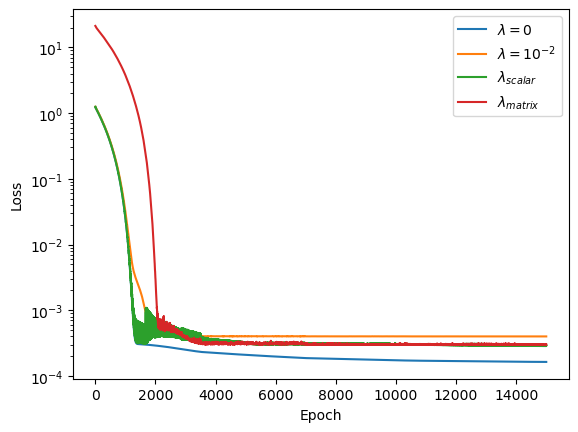

In [16]:
plt.plot(Loss_data1.detach().cpu().numpy(), label = "$\lambda = 0$")
plt.plot(Loss_data2.detach().cpu().numpy(), label = "$\lambda = 10^{-2}$")
plt.plot(Loss_data3.detach().cpu().numpy(), label = "$\lambda_{scalar}$")
plt.plot(Loss_data4.detach().cpu().numpy(), label = "$\lambda_{matrix}$")
plt.xlabel('Epoch') 
plt.ylabel('Loss')
plt.yscale("log")
plt.legend()
plt.show()

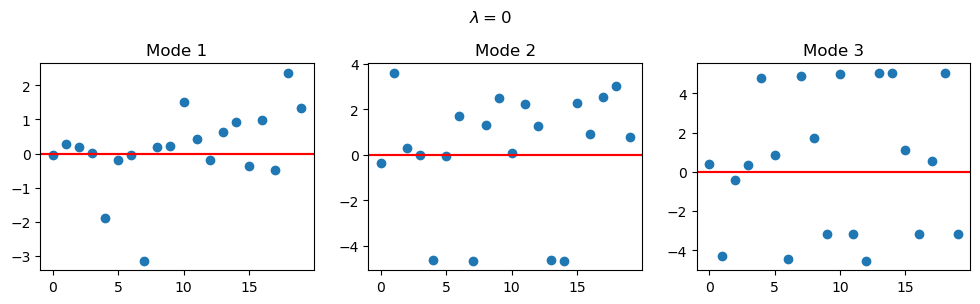

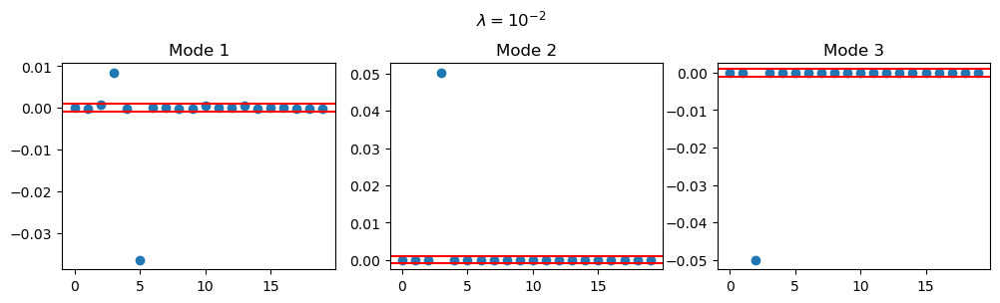

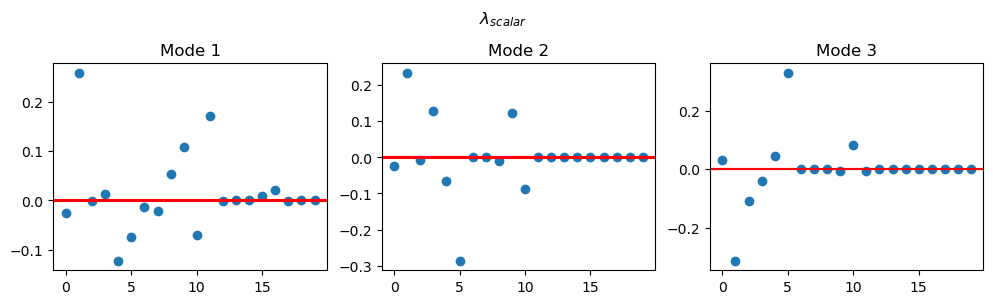

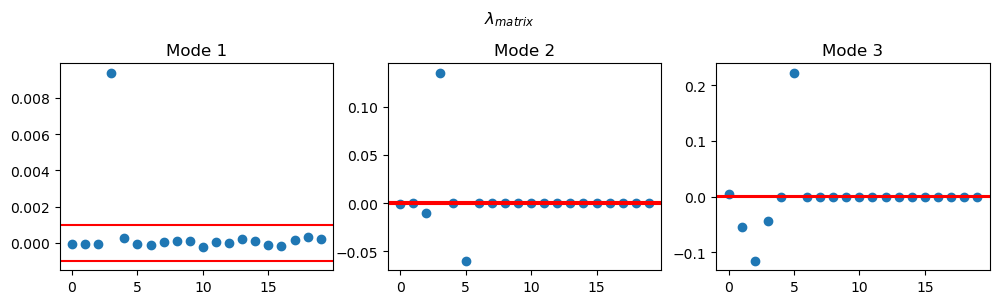

In [17]:
threshold = 0.001
#****************************************************************************#
fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize =(12, 3))
fig.suptitle('$\lambda = 0$')

ax[0].plot(COEFF_ADT1 [:, 0].detach().cpu().numpy(), 'o') 
ax[0].set_title('Mode 1')
ax[0].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[0].axhline(y = -threshold, color = 'r', linestyle = '-')

ax[1].plot(COEFF_ADT1 [:, 1].detach().cpu().numpy(), 'o') 
ax[1].set_title('Mode 2')
ax[1].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[1].axhline(y = -threshold, color = 'r', linestyle = '-')

ax[2].plot(COEFF_ADT1 [:, 2].detach().cpu().numpy(), 'o') 
ax[2].set_title('Mode 3')
ax[2].axhline(y = threshold, color = 'r', linestyle = '-')
ax[2].axhline(y = -threshold, color = 'r', linestyle = '-')
fig.subplots_adjust(top=0.8)
plt.show()

#****************************************************************************#

fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize =(12, 3))
fig.suptitle('$\lambda = 10^{-2} $')

ax[0].plot(COEFF_ADT2 [:, 0].detach().cpu().numpy(), 'o') 
ax[0].set_title('Mode 1')
ax[0].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[0].axhline(y = -threshold, color = 'r', linestyle = '-')

ax[1].plot(COEFF_ADT2 [:, 1].detach().cpu().numpy(), 'o') 
ax[1].set_title('Mode 2')
ax[1].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[1].axhline(y = -threshold, color = 'r', linestyle = '-')

ax[2].plot(COEFF_ADT2 [:, 2].detach().cpu().numpy(), 'o') 
ax[2].set_title('Mode 3')
ax[2].axhline(y = threshold, color = 'r', linestyle = '-')
ax[2].axhline(y = -threshold, color = 'r', linestyle = '-')
fig.subplots_adjust(top=0.8)
plt.show()

#****************************************************************************#

fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize =(12, 3))
fig.suptitle('$\lambda_{scalar} $')

ax[0].plot(COEFF_ADT3 [:, 0].detach().cpu().numpy(), 'o') 
ax[0].set_title('Mode 1')
ax[0].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[0].axhline(y = -threshold, color = 'r', linestyle = '-')

ax[1].plot(COEFF_ADT3 [:, 1].detach().cpu().numpy(), 'o') 
ax[1].set_title('Mode 2')
ax[1].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[1].axhline(y = -threshold, color = 'r', linestyle = '-')

ax[2].plot(COEFF_ADT3 [:, 2].detach().cpu().numpy(), 'o') 
ax[2].set_title('Mode 3')
ax[2].axhline(y = threshold, color = 'r', linestyle = '-')
ax[2].axhline(y = -threshold, color = 'r', linestyle = '-')
fig.subplots_adjust(top=0.8)
plt.show()
#****************************************************************************#
fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize =(12, 3))
fig.suptitle('$\lambda_{matrix} $')

ax[0].plot(COEFF_ADT4 [:, 0].detach().cpu().numpy(), 'o') 
ax[0].set_title('Mode 1')
ax[0].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[0].axhline(y = -threshold, color = 'r', linestyle = '-')

ax[1].plot(COEFF_ADT4 [:, 1].detach().cpu().numpy(), 'o') 
ax[1].set_title('Mode 2')
ax[1].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[1].axhline(y = -threshold, color = 'r', linestyle = '-')

ax[2].plot(COEFF_ADT4 [:, 2].detach().cpu().numpy(), 'o') 
ax[2].set_title('Mode 3')
ax[2].axhline(y = threshold, color = 'r', linestyle = '-')
ax[2].axhline(y = -threshold, color = 'r', linestyle = '-')
fig.subplots_adjust(top=0.8)
plt.show()


The optimised coefficient matrix is further reduced by assuming the terms to be zero within the chosen threshold (0.001). 

In [18]:
# TRUNCATED SINDy COEFFICIENTS

# CASE 2: LAMBDA
C1_h1 = torch.clone(COEFF_ADT2[:, 0]).detach()
C1_h1[torch.logical_and(C1_h1>=-threshold, C1_h1<=threshold)] = 0.0

C2_h1 = torch.clone(COEFF_ADT2[:, 1]).detach()
C2_h1[torch.logical_and(C2_h1>=-threshold, C2_h1<=threshold)] = 0.0

C3_h1 = torch.clone(COEFF_ADT2[:, 2]).detach()
C3_h1[torch.logical_and(C3_h1>=-threshold, C3_h1<=threshold)] = 0.0

#****************************************************************************#

# CASE 4: LAMBDA
C1_h2 = torch.clone(COEFF_ADT4[:, 0]).detach()
C1_h2[torch.logical_and(C1_h2>=-threshold, C1_h2<=threshold)] = 0.0

C2_h2 = torch.clone(COEFF_ADT4[:, 1]).detach()
C2_h2[torch.logical_and(C2_h2>=-threshold, C2_h2<=threshold)] = 0.0

C3_h2 = torch.clone(COEFF_ADT4[:, 2]).detach()
C3_h2[torch.logical_and(C3_h2>=-threshold, C3_h2<=threshold)] = 0.0

In [19]:
A1_DT_Predict1 = A_candidates @ C1_h1
A2_DT_Predict1 = A_candidates @ C2_h1
A3_DT_Predict1 = A_candidates @ C3_h1

A1_DT_Predict2 = A_candidates @ C1_h2
A2_DT_Predict2 = A_candidates @ C2_h2
A3_DT_Predict2 = A_candidates @ C3_h2

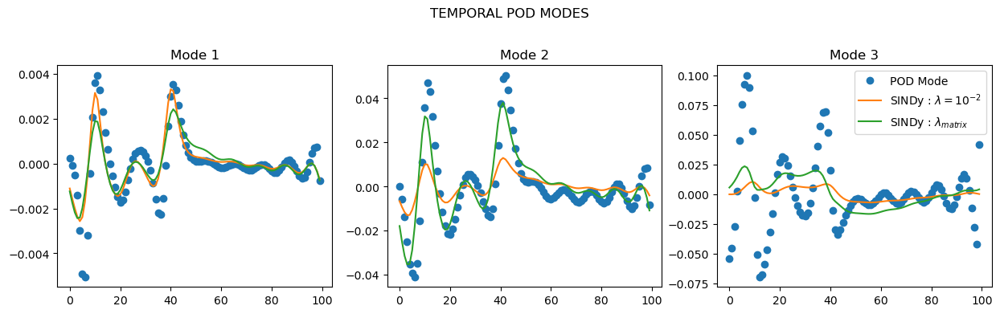

In [20]:
fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize =(15, 4))
fig.suptitle('TEMPORAL POD MODES')

ax[0].plot(A1A2A3_time_deriv[0, :].detach().cpu().numpy(), 'o', label = "POD Mode") 
ax[0].plot(A1_DT_Predict1.detach().cpu().numpy(), label = "SINDy : $\lambda = 10^{-2}$") 
ax[0].plot(A1_DT_Predict2.detach().cpu().numpy(), label = "SINDy - $\lambda_{matrix}$") 
ax[0].set_title('Mode 1')


ax[1].plot(A1A2A3_time_deriv[1, :].detach().cpu().numpy(), 'o', label = "POD Mode") 
ax[1].plot(A2_DT_Predict1.detach().cpu().numpy(), label = "SINDy - $\lambda = 10^{-2}$") 
ax[1].plot(A2_DT_Predict2.detach().cpu().numpy(), label = "SINDy - $\lambda_{matrix}$") 
ax[1].set_title('Mode 2')


ax[2].plot(A1A2A3_time_deriv[2, :].detach().cpu().numpy(), 'o', label = "POD Mode") 
ax[2].plot(A3_DT_Predict1.detach().cpu().numpy(), label = "SINDy : $\lambda = 10^{-2}$") 
ax[2].plot(A3_DT_Predict2.detach().cpu().numpy(), label = "SINDy : $\lambda_{matrix}$")
ax[2].legend()
ax[2].set_title('Mode 3')

fig.subplots_adjust(top=0.8)
plt.show()